In [25]:
from bread.vis import *
from bread.data import Features, SegmentationFile, Microscopy
from bread.algo.lineage import LineageGuesser, LineageGuesserNN, LineageGuesserML, LineageGuesserNearestCell, accuracy
from bread.data import Lineage

import pandas as pd
import numpy as np
import pathlib
import os
from sklearn.preprocessing import MinMaxScaler

import wandb
import torch.optim as optim
import torch.nn as nn
from torch.nn import functional as F
from torch.utils.data import Dataset, DataLoader
import torch.optim.lr_scheduler as lr_scheduler
import torch
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score
import os


In [8]:
# constants
selected_keys = ['dist_0','dist_std','poly_fit_budcm_budpt','poly_fit_expansion_vector','position_bud_std','position_bud_max','position_bud_min','position_bud_last','position_bud_first','orientation_bud_std','orientation_bud_max','orientation_bud_min','orientation_bud_last','orientation_bud_first','orientation_bud_last_minus_first','plyfit_orientation_bud']


step 1: extract features


In [9]:
def extract_features(segmentation, guesser):
    candidate_features = pd.DataFrame()
    bud_ids, time_ids = segmentation.find_buds().bud_ids, segmentation.find_buds().time_ids
    f_list = []
    for i, (bud_id, time_id) in enumerate(zip(bud_ids, time_ids)):
        frame_range = guesser.segmentation.request_frame_range(
            time_id, time_id + guesser.num_frames)
        num_frames_available = guesser.num_frames
        if len(frame_range) < 2:
            # not enough frames
            continue
        if len(frame_range) < guesser.num_frames:
            num_frames_available = len(frame_range)

        # check the bud still exists !
        for time_id_ in frame_range:
            if bud_id not in guesser.segmentation.cell_ids(time_id_):
                # bud has disappeared
                continue
        selected_times = [i for i in range(
            time_id, time_id + num_frames_available)]
        try:
            candidate_parents = guesser._candidate_parents(
                time_id, nearest_neighbours_of=bud_id)
            for c_id, candidate in enumerate(candidate_parents):
                features, f_list = guesser._get_features(
                    bud_id, candidate, time_id, selected_times)
                new_row = {'bud_id': bud_id, 'candid_id': candidate, 'time_id': time_id}
                new_row.update(features)
                new_df= pd.DataFrame(new_row, index=[0])
                candidate_features = pd.concat([candidate_features, new_df])
        except Exception as e:
            print("Error for bud {} at time {} with candidate {}: {}".format(
                bud_id, time_id, candidate, e))
    return candidate_features, f_list

In [3]:
args = {'fov': 0, 'bud_distance_max': 10, 'num_frames_refractory': 0, 'num_frames': 4, 'output_file': 'lineage.csv'}
data_path = '../../../data/'
features_all = pd.DataFrame()

for colony in range(0,6):
    print(f'Processing colony {colony}')
    segmentation_file = os.path.join(data_path, f'colony00{colony}_segmentation.h5')
    segmentation = SegmentationFile.from_h5(segmentation_file).get_segmentation('FOV'+str(args['fov']))
    guesser = LineageGuesserNN(
        segmentation=segmentation,
        dist_threshold=args['bud_distance_max'],
        num_frames_refractory=args['num_frames_refractory'],
        num_frames=args['num_frames'],
    )
    features, f_list = extract_features(segmentation, guesser)
    features['colony'] = colony
    features_all = pd.concat([features_all, features])


Processing colony 0
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 2 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #44 does not have nearest neighbours with a distance less than 10, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 44 at time 74 with candidate 33: No candidate parents have been found for in frame #74.


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 4 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))


Processing colony 1
No model was provided, using the default model
Processing colony 2
No model was provided, using the default model
Processing colony 3
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #77 does not have nearest neighbours with a distance less than 10, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 77 at time 167 with candidate 13: No candidate parents have been found for in frame #167.
Processing colony 4
No model was provided, using the default model
Error for bud 40 at time 123 with candidate 15: Unable to find cell_id=40 at time_id=124 in the segmentation.
Error for bud 105 at time 169 with candidate 67: Unable to find cell_id=67 at time_id=170 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #114 does not have nearest neighbours with a distance less than 10, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 114 at time 173 with candidate 97: No candidate parents have been found for in frame #173.
Processing colony 5
No model was provided, using the default model


In [4]:
features_all

,bud_id,candid_id,time_id,dist_0,dist_max,dist_min,dist_std,dist_max_min,poly_fit_budcm_candidcm,poly_fit_budcm_budpt,...,position_bud_first,position_bud_last_minus_first,orientation_bud_std,orientation_bud_max,orientation_bud_min,orientation_bud_last,orientation_bud_first,orientation_bud_last_minus_first,plyfit_orientation_bud,colony
0,1,1,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.166939,...,0.992954,-0.824071,0.549435,1.419761,0.131275,0.168883,0.992954,-0.824071,-0.376070,0
0,1,3,0,1.414214,2.828427,1.414214,0.596960,1.414214,1.483612,2.984140,...,0.536951,0.082304,0.348574,0.852563,0.022940,0.022940,0.056282,-0.033342,-0.088658,0
0,2,2,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.075098,...,1.099651,-0.120618,0.176747,1.099651,0.637974,0.979034,1.099651,-0.120618,-0.074654,0
0,2,3,0,3.162278,3.162278,2.236068,0.397568,0.926210,0.101788,0.249235,...,0.602720,-0.078025,0.057797,1.508837,1.345514,1.508837,1.345514,0.163323,0.048374,0
0,2,4,0,1.000000,1.414214,1.000000,0.179360,0.414214,1.445395,1.250583,...,0.784439,-0.631304,0.076081,0.758295,0.566509,0.758295,0.566509,0.191787,0.055422,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,37,18,175,2.000000,2.236068,2.000000,0.102220,0.236068,1.591169,3.207947,...,1.563045,-0.022038,0.151266,1.514439,1.133295,1.514439,1.133295,0.381143,0.106932,5
0,37,26,175,2.000000,2.000000,2.000000,0.000000,0.000000,2.487022,4.316390,...,1.559877,-1.280019,0.074683,1.435684,1.250352,1.250352,1.323078,-0.072726,-0.039808,5
0,38,9,178,3.000000,3.000000,0.000000,1.089725,3.000000,0.773591,1.949580,...,0.940659,-0.118083,0.441802,1.135029,0.000000,1.135029,0.839169,0.295861,0.147930,5
0,38,14,178,1.414214,2.828427,0.000000,1.061436,2.828427,1.916193,3.590413,...,1.181054,0.006143,0.601134,1.471914,0.000000,1.334349,1.471914,-0.137565,-0.068782,5


step 1.5: Normalize data


In [5]:
features_all.reset_index(inplace=True, drop=True)
features_all.to_csv('lineage_candidate_features_all.csv', index=False)

In [11]:
# turn features in to a matrix format
def get_custom_matrix_features(features_all, lineage_gt, feature_list, filling_features=[-100 for i in range(100)]):
    # Generate np array of feature sets for each bud
    lineage = lineage_gt.copy()
    # remove the rows with parent_GT = -1 (no parent) and the rows with candid_GT = -2 (disappearing buds)
    lineage = lineage.loc[lineage.parent_GT != -1]
    lineage = lineage.loc[lineage.parent_GT != -2]
    lineage = lineage.loc[lineage.parent_GT != -3]
    candidate_features = features_all.copy()
    features_list = []
    filling_features = filling_features[:len(feature_list)]
    parent_index_list = []
    candidate_list = []
    for bud, colony in lineage[['bud_id', 'colony']].values:
        bud_data = candidate_features.loc[(candidate_features['bud_id'] == bud) & (candidate_features['colony'] == colony)]
        candidates = bud_data['candid_id'].to_numpy()
        features = bud_data[feature_list].to_numpy()
        if(len(candidates) == 0):
            if(len(bud_data) == 0):
                # bud only appears in the last frame
                lineage.drop(lineage.loc[(lineage['bud_id'] == bud) & (lineage.colony == colony)].index,
                        inplace=True)
            else:
                print('no candidates', bud, colony, candidates)
            continue
        elif candidates.shape[0] < 4:
            n_rows = 4 - candidates.shape[0]
            rows_to_add = np.array([filling_features for i in range(n_rows)])
            features = np.concatenate((features, rows_to_add), axis=0)
            candidates = np.pad(
                candidates, ((0, 4 - candidates.shape[0])), mode='constant', constant_values=-3)
        elif features.shape[0] > 4:
            sorted_indices = np.argsort(features[:, 0])
            print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
                lineage['colony'] == colony), 'parent_GT']))
            # slice the top 4 rows
            features = features[sorted_indices[:4]]
            candidates = candidates[sorted_indices[:4]]

        parent = int(lineage.loc[(lineage['bud_id'] == bud) & (lineage['colony'] == colony), 'parent_GT'].iloc[0])
        if(parent not in candidates):
            print('parent not in candidates', bud, colony, candidates, parent)
            lineage.drop(lineage.loc[(lineage['bud_id'] == bud) & (lineage.colony == colony)].index, inplace=True)
            continue
        else:
            parent_index = np.where(candidates == parent)[0][0]
        parent_index_list.append(parent_index)
        features_list.append(features)
        candidate_list.append(candidates)
    lineage['features'] = features_list
    lineage['candidates'] = candidate_list
    lineage['parent_index_in_candidates'] = parent_index_list
    return lineage

# get the lineage ground truth
lin_gt_all = pd.DataFrame()
for colony in range(0,6):
    lineage_gt_path = os.path.join(data_path, f'colony00{colony}_lineage_gt.csv')
    lin_truth = pd.read_csv(lineage_gt_path)
    lin_truth['colony'] = colony
    lin_gt_all = pd.concat([lin_gt_all, lin_truth])
lin_gt_all.rename(columns={'# parent_id': 'parent_GT'}, inplace=True)
lin_gt_all.reset_index(inplace=True, drop=True)

# get matrix features
selected_keys = ['dist_0','dist_std','poly_fit_budcm_budpt','poly_fit_expansion_vector','position_bud_std','position_bud_max','position_bud_min','position_bud_last','position_bud_first','orientation_bud_std','orientation_bud_max','orientation_bud_min','orientation_bud_last','orientation_bud_first','orientation_bud_last_minus_first','plyfit_orientation_bud']
# matrix_features = get_custom_matrix_features(features_all, lin_gt_all, selected_keys)

NameError: name 'data_path' is not defined

step 1.5: normalize features


In [16]:
# Import necessary libraries
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

# Extract the subset of features to be normalized as a separate DataFrame
X = features_all[selected_keys]

# Apply min-max normalization to the subset of features
scaler = MinMaxScaler()
X_norm = scaler.fit_transform(X)

# Replace the original features with the normalized features in the dataframe
features_all_normalized = features_all.copy()
features_all_normalized[selected_keys] = X_norm

matrix_features_normalized = get_custom_matrix_features(features_all_normalized, lin_gt_all, selected_keys)


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 152 0 [  9  23  48  91 111] [1 4 0 2 3] 23
more than 4 candidates 163 0 [  3  54  68 102 134] [4 3 0 1 2] 54
more than 4 candidates 168 0 [  1  33  77 154 159] [1 2 4 3 0] 1
parent not in candidates 168 0 [ 33  77 159 154] 1
parent not in candidates 243 0 [ 25 233  -3  -3] 15
more than 4 candidates 261 0 [ 94 105 164 191 237] [2 0 1 4 3] 94
more than 4 candidates 262 0 [ 48  80 137 183 244] [2 1 4 3 0] 137
parent not in candidates 280 0 [ 27 105 212 238] 11
parent not in candidates 321 0 [ 53  92 107  -3] 96
more than 4 candidates 343 0 [159 182 270 290 305] [1 0 2 3 4] 182
more than 4 candidates 52 1 [ 3  7 13 25 29] [3 4 0 2 1] 25
more than 4 candidates 69 3 [12 19 21 42 67] [4 0 1 2 3] 12
more than 4 candidates 87 3 [18 37 39 59 71] [1 2 0 4 3] 37
parent not in candidates 68 4 [ 4  8 64 -3] 39


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (


step 2: define model


In [24]:

import wandb
import torch.optim as optim
import torch.nn as nn
from torch.nn import functional as F
from torch.utils.data import Dataset, DataLoader
import torch.optim.lr_scheduler as lr_scheduler
import torch
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score
import os

class BudDataset(Dataset):
    def __init__(self, data, augment=True):
        X = data['features'].to_numpy()
        labels = data['parent_index_in_candidates'].to_numpy()
        if(augment):
            X, labels = generate_all_permutations(X, labels)
        X = flatten_3d_array(X)
        self.data = torch.tensor(X, dtype=torch.float32)
        self.labels = torch.zeros(len(labels), 5)  # initialize labels as zeros
        for i, label in enumerate(labels):
            if label != -1:
                # set the position of the correct parent to 1
                self.labels[i][label] = 1.0

    def __getitem__(self, index):
        data = self.data[index]
        return self.data[index], self.labels[index]

    def __len__(self):
        return len(self.labels)

# lineage NN with mask
class LineageNN(nn.Module):
    def __init__(self, layers):
        super(LineageNN, self).__init__()
        self.layers = nn.ModuleList()  # create an empty nn.ModuleList
        for i in range(len(layers)-1):
            self.layers.append(nn.Linear(layers[i], layers[i+1]))

    def forward(self, x):
        mask = (x != -100).float()
        x = x * mask  # apply the mask to zero out invalid values
        for layer in self.layers[:-1]:
            x = F.relu(layer(x))
            # x = x * mask
        x = self.layers[-1](x)
        return x



step 3: split train-test-eval


In [27]:
matrix_features.reset_index(inplace=True, drop=True)
test_df = matrix_features.sample(frac=0.2, random_state=4)
train_df = matrix_features.drop(test_df.index)


step 4: train and eval using 5-fold cv


In [12]:
# functions to deal with data
import itertools

def flatten_3d_array(arr):
    """
    Flattens a 3-dimensional numpy array while keeping the first dimension unchanged
    """
    if arr.ndim == 1:
        arr2 = np.array([arr[i] for i in range(len(arr))])
        arr = np.stack(arr2)
    shape = arr.shape
    new_shape = (shape[0], np.prod(shape[1:]))
    return arr.reshape(new_shape)


def permute_matrix(matrix, row_id):
    """
    Generates all possible permutations of a matrix  rows
    it takes row_index as input, which is a one-hot encoded label for the classification 
    and outputs the one-hot encoded labels of the permutated matrices
    """
    # Get the number of rows in the matrix
    rows = len(matrix)

    # Get all possible permutations of the row indices
    permutations = list(itertools.permutations(range(rows)))

    # Use list comprehension to create a list of all permuted matrices
    permuted_matrices = [np.array([matrix[i] for i in permutation])
                         for permutation in permutations]

    # Use list comprehension to find the index of the specified row in each permuted matrix
    row_indices = [list(permutation).index(row_id)
                   for permutation in permutations]

    return permuted_matrices, row_indices


def generate_all_permutations(data, labels):
    """
    Generates all posible permutations for matrices in data 
    and the corresponding labels
    Labels should be integers
    """

    permuted_matrices_list = []
    permuted_labels_list = []

    for matrix, label in zip(data, labels):
        permuted_matrices, permuted_labels = permute_matrix(matrix, label)
        permuted_matrices_list.extend(permuted_matrices)
        permuted_labels_list.extend(permuted_labels)

    return np.array(permuted_matrices_list), np.array(permuted_labels_list)



In [13]:
# functions to train and test the model
def train_nn(train_df, eval_df, save_path='bst_nn.pth', config={},seed=42):
    if config == {}:
        config = {'epoch_n': 100, 'patience': 10, 'save_path': 'bst_nn.pth',
                  'augment': True, 'batch_size': 16, 'lr': 0.001, 'layers': [40, 32, 5],}
    # Initialize wandb
    wandb.init(project="lineage_tracing", group='with_mask',config=config)
    
    # initialize neural network
    # manualy set the seed to enable reproducibility
    torch.manual_seed(seed)
    net = LineageNN(layers=config['layers'])

    # define your loss function and optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(net.parameters(), lr=config['lr'])
    scheduler = lr_scheduler.LinearLR(optimizer, start_factor=1, end_factor=0.01, total_iters=200)

    train_bud_dataset = BudDataset(train_df, augment=config['augment'])
    train_bud_dataloader = DataLoader(
        train_bud_dataset, batch_size=config['batch_size'], shuffle=True)
    eval_bud_dataset = BudDataset(eval_df, augment=False)
    eval_bud_dataloader = DataLoader(
        eval_bud_dataset, batch_size=config['batch_size'], shuffle=True)

    # train your neural network
    patient = 0
    best_accuracy = 0.0
    for epoch in range(config['epoch_n']):
        running_loss = 0.0
        # training loop
        predicted_all = []
        labels_all = []
        net.train()
        for i, data in enumerate(train_bud_dataloader, 0):
            inputs, labels = data
            optimizer.zero_grad()
            # forward pass
            outputs = net(inputs)
            # calculate the loss
            loss = criterion(outputs, labels)
            _, labels = torch.max(labels.data, 1)
            _, predicted = torch.max(outputs.data, 1)
            predicted_all.extend(predicted)
            labels_all.extend(labels)
            # backward pass and optimize
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
            scheduler.step()
        train_accuracy = accuracy_score(labels_all, predicted_all)
        # eval loop
        predicted_all = []
        labels_all = []
        net.eval()
        for i, data in enumerate(eval_bud_dataloader, 0):
            inputs, labels = data
            with torch.no_grad():
                outputs = net(inputs)
            _, labels = torch.max(labels.data, 1)
            _, predicted = torch.max(outputs.data, 1)
            predicted_all.extend(predicted)
            labels_all.extend(labels)
        eval_accuracy = accuracy_score(labels_all, predicted_all)
        if(eval_accuracy > best_accuracy):
            best_accuracy = eval_accuracy
            best_model = net
            torch.save(net.state_dict(), save_path)
            patient = 0
        else:
            patient += 1
        if(patient > config['patience']):
            print('early stopping at ', epoch , 'LR: ', optimizer.param_groups[0]['lr'])
            break
        wandb_log = {'epoch': epoch, 'patience': patient, 'eval_accuracy': eval_accuracy,
                     'train_accuracy': train_accuracy, 'best_accuracy': best_accuracy, 'lr': optimizer.param_groups[0]['lr']    }
        wandb.log(wandb_log)
    return best_model, best_accuracy


def test_nn(model, test_df):
    bud_dataset = BudDataset(test_df, augment=False)
    bud_dataloader = DataLoader(
        bud_dataset, batch_size=len(test_df), shuffle=False)
    for i, data in enumerate(bud_dataloader, 0):
        if (i > 0):
            print('more than one batch')
        inputs, labels = data
        with torch.no_grad():
            outputs = model(inputs)
        _, labels = torch.max(labels.data, 1)
        _, predicted = torch.max(outputs.data, 1)
        accuracy = accuracy_score(predicted, labels)
    print('test accuracy', accuracy)
    test_df['predicted'] = predicted
    return test_df, accuracy


def cv_nn(df, config={}, seed=42):
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    X = df['features'].to_numpy()
    y = df['parent_index_in_candidates'].to_numpy()
    # repeat df because it necessary for the function to have two arguments
    skf.get_n_splits(X, y)
    accuracies = []
    models = []
    i = 0
    # repeat df because it necessary for the function to have two arguments
    for train_index, test_index in skf.split(X, y):
        i=i+1
        config['cv_number'] = i
        print('config: ', config)
        train_df = df.iloc[train_index]
        test_df = df.iloc[test_index]
        net, accuracy = train_nn(train_df, test_df, config=config, seed=seed)
        accuracies.append(accuracy)
        models.append(net)
    
    print('accuracy: ', np.mean(accuracies), '+/-', np.std(accuracies))
    return models, accuracies


In [20]:
config = {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True , 'features':'16','train_set': 'all'}
os.environ["WANDB_SILENT"] = "true"
models , accuracies = cv_nn(train_df, config=config, seed=42)

config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'cv_number': 1}


early stopping at  20 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'cv_number': 2}


early stopping at  18 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'cv_number': 3}


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'cv_number': 4}


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'cv_number': 5}


early stopping at  13 LR:  9.99999999999999e-05
accuracy:  0.8373004857737684 +/- 0.02796150421061789


In [21]:
print(accuracies)
print(np.mean(accuracies), '+/-', np.std(accuracies))

[0.8333333333333334, 0.8712121212121212, 0.8636363636363636, 0.8244274809160306, 0.7938931297709924]
0.8373004857737684 +/- 0.02796150421061789


Step 3.5: training for normalized data


In [22]:
matrix_features_normalized.reset_index(inplace=True, drop=True)
test_df_n = matrix_features_normalized.sample(frac=0.2, random_state=4)
train_df_n = matrix_features_normalized.drop(test_df_n.index)

config = {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True , 'features':'16','train_set': 'all', 'normalized': True}
os.environ["WANDB_SILENT"] = "true"
models_n , accuracies_n = cv_nn(train_df_n, config=config, seed=42)

config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'normalized': True, 'cv_number': 1}


early stopping at  12 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'normalized': True, 'cv_number': 2}


early stopping at  27 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'normalized': True, 'cv_number': 3}


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'normalized': True, 'cv_number': 4}


early stopping at  20 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'normalized': True, 'cv_number': 5}


early stopping at  12 LR:  9.99999999999999e-05
accuracy:  0.843384223918575 +/- 0.03810510463110446


step 4: test on test set and save best model


In [28]:
temp = []
for model in models:
    _, accuracy = test_nn(model, test_df)
    print(accuracy)
    temp.append(accuracy)
print("accuracy without normalization", np.mean(temp), '+/-', np.std(temp))

temp = []
for model in models_n:
    _, accuracy = test_nn(model, test_df_n)
    print(accuracy)
    temp.append(accuracy)
print("accuracy with normalization", np.mean(temp), '+/-', np.std(temp))

test accuracy 0.7575757575757576
0.7575757575757576
test accuracy 0.7515151515151515
0.7515151515151515
test accuracy 0.7636363636363637
0.7636363636363637
test accuracy 0.7333333333333333
0.7333333333333333
test accuracy 0.7454545454545455
0.7454545454545455
accuracy without normalization 0.7503030303030302 +/- 0.010427060929748658
test accuracy 0.7878787878787878
0.7878787878787878
test accuracy 0.7878787878787878
0.7878787878787878
test accuracy 0.7757575757575758
0.7757575757575758
test accuracy 0.7636363636363637
0.7636363636363637
test accuracy 0.7696969696969697
0.7696969696969697
accuracy with normalization 0.776969696969697 +/- 0.00969696969696968


step 6: give saved model to lineage guesser and run test for colonies


In [ ]:
from bread.vis import *
from bread.data import Features, SegmentationFile, Microscopy
from bread.algo.lineage import LineageGuesser, LineageGuesserNN, LineageGuesserML, LineageGuesserNearestCell, accuracy
from bread.data import Lineage

import pandas as pd
import pathlib
import os

args = {'fov': 0, 'bud_distance_max': 10, 'num_frames_refractory': 0, 'num_frames': 4, 'output_file': 'lineage.csv'}
data_path = '../../../data/'
i=0
for model in models:
    i=i+1
    print('model: ', i)
    lineage_guesses = []
    # save the pytorch neral network model
    model_path = os.path.join('/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/saved_models', 'nn_thresh_10_model_{}.pth'.format(i))
    torch.save(model.state_dict(), model_path)
    # find predictions for each colony
    for colony in range(0,6):
        output_file = os.path.join(data_path, f'colony00{colony}_lineage_guess.csv')
        segmentation_file = os.path.join(data_path, f'colony00{colony}_segmentation.h5')
        segmentation = SegmentationFile.from_h5(segmentation_file).get_segmentation('FOV'+str(args['fov']))
        guesser = LineageGuesserNN(
            saved_model = model_path, 
            segmentation=segmentation,
            dist_threshold=args['bud_distance_max'],
            num_frames_refractory=args['num_frames_refractory'],
            num_frames=args['num_frames'],
        )

        lineage_guess: Lineage = guesser.guess_lineage()
        lineage_guesses.append(lineage_guess)
        lineage_guess.save_csv(output_file)
    # find accuracy for each colony
    for colony, lin_guess in enumerate(lineage_guesses):
        lineage_gt_path = os.path.join(data_path, f'colony00{colony}_lineage_gt.csv')
        lin_truth = Lineage.from_csv(lineage_gt_path)
        acc = accuracy(lin_truth, lin_guess, strict=False)
        print('accuracy for colony {}: {}'.format(colony , acc))

step 7: run test for external data


In [26]:
f_list = ['dist_0','dist_std','poly_fit_budcm_budpt','poly_fit_expansion_vector','position_bud_std','position_bud_max','position_bud_min','position_bud_last','position_bud_first','orientation_bud_std','orientation_bud_max','orientation_bud_min','orientation_bud_last','orientation_bud_first','orientation_bud_last_minus_first','plyfit_orientation_bud']
external_subset_lineage_GT_path_edited = '/home/farzaneh/Documents/TrackerTestDataset_SCerevisiae_7/subset/lineage/lineage_budlum_edited_by_code.csv'
external_subset_segmentation_path = '/home/farzaneh/Documents/TrackerTestDataset_SCerevisiae_7/subset/segmentation2/stacked/mask_stack _edited.h5'

segmentation = SegmentationFile.from_h5(external_subset_segmentation_path).get_segmentation('FOV'+str(args['fov']))
guesser = LineageGuesserNN(
        segmentation=segmentation,
        dist_threshold=args['bud_distance_max'],
        num_frames_refractory=args['num_frames_refractory'],
        num_frames=args['num_frames'],
    )

external_subset_features ,_ =  extract_features(segmentation, guesser)
external_subset_features['colony'] = 10
external_subset_lineage_gt = pd.read_csv(external_subset_lineage_GT_path_edited)
external_subset_lineage_gt['colony'] = 10
external_subset_lineage_gt.rename(columns={'# parent_id': 'parent_GT'}, inplace=True)

# create matrix features for the external subset
external_subset_matrix_features = get_custom_matrix_features(
    external_subset_features, external_subset_lineage_gt, f_list)

# test the model on the external subset
accuracies = []
best_accuracy = 0
best_model = None
for model in models_n:
    pred, accuracy = test_nn(model, external_subset_matrix_features)
    accuracies.append(accuracy)
    if accuracy > best_accuracy:
        best_accuracy = accuracy
        best_model = model
print('accuracy on external subset: ', np.mean(accuracies))


No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #269 does not have nearest neighbours with a distance less than 10, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 269 at time 116 with candidate 178: No candidate parents have been found for in frame #116.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #287 does not have nearest neighbours with a distance less than 10, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #291 does not have nearest neighbours with a distance less than 10, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 287 at time 117 with candidate 240: No candidate parents have been found for in frame #117.
Error for bud 291 at time 117 with candidate 174: No candidate parents have been found for in frame #117.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #300 does not have nearest neighbours with a distance less than 10, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #307 does not have nearest neighbours with a distance less than 10, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 300 at time 118 with candidate 276: No candidate parents have been found for in frame #118.
Error for bud 307 at time 118 with candidate 269: No candidate parents have been found for in frame #118.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #309 does not have nearest neighbours with a distance less than 10, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #310 does not have nearest neighbours with a distance less than 10, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 ca

Error for bud 309 at time 118 with candidate 166: No candidate parents have been found for in frame #118.
Error for bud 310 at time 118 with candidate 166: No candidate parents have been found for in frame #118.
more than 4 candidates 44 10 [20 28 32 33 37] [4 1 2 0 3] 20
more than 4 candidates 47 10 [ 1  7 11 25 27] [1 3 4 2 0] 7
more than 4 candidates 58 10 [ 6 34 36 48 53] [0 1 2 3 4] 6
more than 4 candidates 76 10 [ 1  7 25 47 71] [1 2 3 4 0] 47
more than 4 candidates 80 10 [ 5 19 26 34 53] [1 2 3 0 4] 19
more than 4 candidates 85 10 [11 15 56 71 72] [0 2 3 4 1] 11
more than 4 candidates 92 10 [10 40 42 61 67] [1 4 0 3 2] 40
more than 4 candidates 96 10 [ 3  6  8 31 83] [0 1 3 2 4] 31
more than 4 candidates 97 10 [13 29 35 48 54] [0 1 2 3 4] 48
more than 4 candidates 103 10 [ 8 14 43 55 74] [1 3 0 4 2] 14
more than 4 candidates 114 10 [16 24 64 70 77] [0 2 1 4 3] 16
more than 4 candidates 115 10 [ 6 34 53 58 86] [0 2 1 3 4] 34
more than 4 candidates 118 10 [ 16  24  39  70 114] [1 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

Step 8: test on test_df_n for different distance and time


In [21]:
data_path = '../../../data/'
# get the lineage ground truth
lin_gt_all = pd.DataFrame()
for colony in range(0,6):
    lineage_gt_path = os.path.join(data_path, f'colony00{colony}_lineage_gt.csv')
    lin_truth = pd.read_csv(lineage_gt_path)
    lin_truth['colony'] = colony
    lin_gt_all = pd.concat([lin_gt_all, lin_truth])
lin_gt_all.rename(columns={'# parent_id': 'parent_GT'}, inplace=True)
lin_gt_all.reset_index(inplace=True, drop=True)

# get matrix features
selected_keys = ['dist_0','dist_std','poly_fit_budcm_budpt','poly_fit_expansion_vector','position_bud_std','position_bud_max','position_bud_min','position_bud_last','position_bud_first','orientation_bud_std','orientation_bud_max','orientation_bud_min','orientation_bud_last','orientation_bud_first','orientation_bud_last_minus_first','plyfit_orientation_bud']


def do_pipeline(args, lin_gt_all, config={}):
    selected_keys = args['selected_keys']
    res = {}
    # extract features
    features_all = pd.DataFrame()
    for colony in range(0,6):
        print(f'Processing colony {colony}')
        segmentation_file = os.path.join(data_path, f'colony00{colony}_segmentation.h5')
        segmentation = SegmentationFile.from_h5(segmentation_file).get_segmentation('FOV'+str(args['fov']))
        guesser = LineageGuesserNN(
            segmentation=segmentation,
            dist_threshold=args['bud_distance_max'],
            num_frames_refractory=args['num_frames_refractory'],
            num_frames=args['num_frames'],
        )
        features, f_list = extract_features(segmentation, guesser)
        features['colony'] = colony
        features_all = pd.concat([features_all, features])
    X = features_all[selected_keys]
    scaler = MinMaxScaler()
    X_norm = scaler.fit_transform(X)
    if(args['normalized']):
        # normalize features    
        features_all_normalized = features_all.copy()
        features_all_normalized[selected_keys] = X_norm
        features_all = features_all_normalized
    # get matrix features
    matrix_features = get_custom_matrix_features(features_all, lin_gt_all, selected_keys)
    # split train and test
    matrix_features.reset_index(inplace=True, drop=True)
    test_df = matrix_features.sample(frac=0.2, random_state=4)
    train_df = matrix_features.drop(test_df.index)
    # train the model
    if config == {}:  
        config = {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True , 'features':'16','train_set': 'all', 'dist_threshold':args['bud_distance_max'], 'num_frames': args['num_frames'],'normalized': args['normalized']}
    models , accuracies = cv_nn(train_df, config=config, seed=42)
    res['val_accuracy'] = np.mean(accuracies)
    res['val_accuracy_std'] = np.std(accuracies)
    # test the model on the external subset
    accuracies_test = []
    for model in models:
        pred, accuracy = test_nn(model, test_df)
        accuracies_test.append(accuracy)
    res['internal_test_accuracy'] = np.mean(accuracies_test)
    res['internal_test_accuracy_std'] = np.std(accuracies_test)
    
    # test the model on the external subset
    external_subset_lineage_GT_path_edited = '/home/farzaneh/Documents/TrackerTestDataset_SCerevisiae_7/subset/lineage/lineage_budlum_edited_by_code.csv'
    external_subset_segmentation_path = '/home/farzaneh/Documents/TrackerTestDataset_SCerevisiae_7/subset/segmentation2/stacked/mask_stack _edited.h5'
    segmentation = SegmentationFile.from_h5(external_subset_segmentation_path).get_segmentation('FOV'+str(args['fov']))
    guesser = LineageGuesserNN(
        segmentation=segmentation,
        dist_threshold=args['bud_distance_max'],
        num_frames_refractory=args['num_frames_refractory'],
        num_frames=args['num_frames'],
        )

    external_subset_features ,_ =  extract_features(segmentation, guesser)
    external_subset_features['colony'] = 10
    external_subset_lineage_gt = pd.read_csv(external_subset_lineage_GT_path_edited)
    external_subset_lineage_gt['colony'] = 10
    external_subset_lineage_gt.rename(columns={'# parent_id': 'parent_GT'}, inplace=True)
    if (args['normalized']):
        # normalize features    
        external_subset_features[selected_keys] = scaler.transform(external_subset_features[selected_keys])
    # create matrix features for the external subset
    external_subset_matrix_features = get_custom_matrix_features(
        external_subset_features, external_subset_lineage_gt, selected_keys)

    # test the model on the external subset
    accuracies_external = []
    best_accuracy = 0
    best_model = None
    for model in models:
        pred, accuracy = test_nn(model, external_subset_matrix_features)
        accuracies_external.append(accuracy)
    res['external_test_accuracy'] = np.mean(accuracies_external)
    res['external_test_accuracy_std'] = np.std(accuracies_external)
    return res
        

In [46]:
result_df = pd.DataFrame()

In [37]:
result_corrupted = result_df.drop(columns=['max_bud_dist','accuracy_on_external_test','internal_tes_accuracy_std','accuracy_on_internal_test','time_frame'])
result_corrupted.to_csv('results_dist_normal_time_corrupted.csv', index=False)
result_corrupted

,val_accuracy,val_accuracy_std,external_test_accuracy_std,bud_distance_max,num_frames,normalized,internal_test_accuracy,internal_test_accuracy_std,external_test_accuracy
0,0.753447,0.020753,0.018267,8.0,2.0,True,0.742331,0.016913,0.550508
0,0.784005,0.027219,0.010847,8.0,2.0,False,0.755828,0.009816,0.666441
0,0.796336,0.013992,0.015755,8.0,3.0,True,0.792638,0.010555,0.613559
0,0.799378,0.014945,0.011222,8.0,3.0,False,0.739877,0.012022,0.731525
0,0.816218,0.025271,0.031538,8.0,4.0,True,0.819632,0.007362,0.698983
0,0.831474,0.032856,0.010590,8.0,4.0,False,0.781595,0.006256,0.790508
0,0.825050,0.035565,0.021289,8.0,5.0,True,0.852761,0.013990,0.740339
0,0.843523,0.036234,0.013111,8.0,5.0,False,0.820859,0.009017,0.827797
0,0.828162,0.027179,0.007427,8.0,6.0,True,0.846626,0.003880,0.694915
0,0.837346,0.038842,0.015311,8.0,6.0,False,0.826994,0.009816,0.820339


In [42]:
result_edited = result_df.drop(columns=['max_bud_dist','accuracy_on_external_test','internal_tes_accuracy_std','accuracy_on_internal_test','time_frame'])
result_edited = result_edited.loc[result_edited['normalized'] == False]
result_edited.to_csv('results_dist_frame_not_normalized_edited.csv', index=False)

In [43]:
result_all = result_df.drop(columns=['max_bud_dist','accuracy_on_external_test','internal_tes_accuracy_std','accuracy_on_internal_test','time_frame'])
result_all.to_csv('results_dist_frame_all.csv', index=False)

In [48]:
result_df


,bud_distance_max,num_frames,normalized,val_accuracy,val_accuracy_std,internal_test_accuracy,internal_test_accuracy_std,external_test_accuracy,external_test_accuracy_std
0,8,4,True,0.646330,0.026021,0.469939,0.045016,0.363390,0.059545
0,8,4,False,0.630934,0.005609,0.490798,0.041246,0.409492,0.064865
0,8,6,True,0.636583,0.027894,0.506748,0.040806,0.367458,0.035785
0,8,6,False,0.656418,0.024320,0.560736,0.041537,0.461017,0.018690
0,8,8,True,0.625250,0.022466,0.483436,0.032556,0.278644,0.031972
0,8,8,False,0.657416,0.022014,0.606135,0.064391,0.509831,0.081429
0,8,10,True,0.644615,0.045221,0.554601,0.038528,0.336949,0.024218
0,8,10,False,0.643077,0.017941,0.561963,0.017611,0.491525,0.015311
0,32,4,True,0.674653,0.031023,0.631515,0.061616,0.616271,0.071280
0,32,4,False,0.801800,0.029783,0.802424,0.017397,0.778983,0.006214


In [52]:
result_df

,bud_distance_max,num_frames,normalized,val_accuracy,val_accuracy_std,internal_test_accuracy,internal_test_accuracy_std,external_test_accuracy,external_test_accuracy_std
0,8,4,True,0.646330,0.026021,0.469939,0.045016,0.363390,0.059545
0,8,4,False,0.630934,0.005609,0.490798,0.041246,0.409492,0.064865
0,8,6,True,0.636583,0.027894,0.506748,0.040806,0.367458,0.035785
0,8,6,False,0.656418,0.024320,0.560736,0.041537,0.461017,0.018690
0,8,8,True,0.625250,0.022466,0.483436,0.032556,0.278644,0.031972
0,8,8,False,0.657416,0.022014,0.606135,0.064391,0.509831,0.081429
0,8,10,True,0.644615,0.045221,0.554601,0.038528,0.336949,0.024218
0,8,10,False,0.643077,0.017941,0.561963,0.017611,0.491525,0.015311
0,32,4,True,0.674653,0.031023,0.631515,0.061616,0.616271,0.071280
0,32,4,False,0.801800,0.029783,0.802424,0.017397,0.778983,0.006214


In [51]:
max_bud_dists = [8,32,256]
frame_numbers = [4,6,8,10]
for max_bud_dist in max_bud_dists:
    for frame_number in frame_numbers:
        for normalized in [True, False]:
            args = {'fov': 0, 'bud_distance_max': max_bud_dist, 'num_frames_refractory': 0, 'num_frames': frame_number, 'output_file': 'lineage.csv', 'normalized' : normalized}
            res = do_pipeline(args, lin_gt_all)
            new_row = {'bud_distance_max':max_bud_dist, 'num_frames': frame_number , 'normalized': normalized}
            new_row.update(res)
            new_df = pd.DataFrame(new_row, index=[0])
            result_df = pd.concat([result_df, new_df])
result_df.to_csv('result_df_latest.csv', index=False)


Processing colony 0
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 2 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #44 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 44 at time 74 with candidate 33: No candidate parents have been found for in frame #74.


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 4 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))


Processing colony 1
No model was provided, using the default model
Processing colony 2
No model was provided, using the default model
Processing colony 3
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #77 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 77 at time 167 with candidate 13: No candidate parents have been found for in frame #167.
Processing colony 4
No model was provided, using the default model
Error for bud 40 at time 123 with candidate 15: Unable to find cell_id=40 at time_id=124 in the segmentation.
Error for bud 105 at time 169 with candidate 67: Unable to find cell_id=67 at time_id=170 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #114 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 114 at time 173 with candidate 97: No candidate parents have been found for in frame #173.
Processing colony 5
No model was provided, using the default model
parent not in candidates 163 0 [102 134  -3  -3] 54
more than 4 candidates 168 0 [  1  33  77 154 159] [1 2 4 3 0] 1
parent not in candidates 168 0 [ 33  77 159 154] 1
parent not in candidates 184 0 [ 15  25 120  -3] 104
parent not in candidates 207 0 [  7  13 140  -3] 81
parent not in candidates 233 0 [ 25  62 120  -3] 106
parent not in candidates 243 0 [ 25 233  -3  -3] 15
parent not in candidates 253 0 [115  -3  -3  -3] 56
more than 4 candidates 262 0 [ 48  80 137 183 244] [2 1 4 3 0] 137
parent not in candidates 280 0 [ 27 105 212  -3] 11
parent not in candidates 321 0 [ 53  92 107  -3] 96
parent not in candidates 323 0 [57 58 -3 -3] 100
more than 4 candidates 343 0 [159 182 270 290 305] [1 0 2 3 4] 182
parent not in candidates 353 0 [ 96 202 227  -3] 90


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 69 3 [12 19 21 42 67] [4 0 1 2 3] 12
more than 4 candidates 87 3 [18 37 39 59 71] [1 2 0 4 3] 37
parent not in candidates 68 4 [ 4  8 64 -3] 39
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 4, 'normalized': True, 'cv_number': 1}


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 4, 'normalized': True, 'cv_number': 2}


early stopping at  18 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 4, 'normalized': True, 'cv_number': 3}


early stopping at  14 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 4, 'normalized': True, 'cv_number': 4}


early stopping at  12 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 4, 'normalized': True, 'cv_number': 5}


early stopping at  24 LR:  9.99999999999999e-05
accuracy:  0.8131297709923665 +/- 0.018947908301856543
test accuracy 0.7668711656441718
test accuracy 0.7791411042944786
test accuracy 0.7730061349693251
test accuracy 0.7791411042944786
test accuracy 0.7852760736196319
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #269 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 269 at time 116 with candidate 178: No candidate parents have been found for in frame #116.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #287 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #291 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 287 at time 117 with candidate 240: No candidate parents have been found for in frame #117.
Error for bud 291 at time 117 with candidate 174: No candidate parents have been found for in frame #117.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #300 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 300 at time 118 with candidate 276: No candidate parents have been found for in frame #118.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #307 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #309 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #310 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnin

Error for bud 307 at time 118 with candidate 269: No candidate parents have been found for in frame #118.
Error for bud 309 at time 118 with candidate 166: No candidate parents have been found for in frame #118.
Error for bud 310 at time 118 with candidate 166: No candidate parents have been found for in frame #118.
more than 4 candidates 44 10 [20 28 32 33 37] [4 1 2 0 3] 20
more than 4 candidates 58 10 [ 6 34 36 48 53] [0 1 2 3 4] 6
more than 4 candidates 115 10 [ 6 34 53 58 86] [0 2 1 3 4] 34
more than 4 candidates 118 10 [ 16  24  39  70 114] [1 4 3 0 2] 24
more than 4 candidates 138 10 [ 17  20  57  68 131] [1 2 3 4 0] 57
more than 4 candidates 148 10 [ 11  30  72  85 143] [0 1 4 2 3] 11


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 164 10 [  4  69  73 110 157] [2 4 1 0 3] 73
more than 4 candidates 177 10 [ 14  55 103 141 166] [4 1 2 3 0] 55
more than 4 candidates 199 10 [ 91 113 115 137 181] [4 0 1 2 3] 91
more than 4 candidates 202 10 [ 32  57  88 126 149] [0 4 2 1 3] 32
more than 4 candidates 214 10 [  3  35 142 159 195] [1 2 3 4 0] 35
more than 4 candidates 218 10 [ 28  61 104 124 206] [2 4 3 0 1] 104
more than 4 candidates 248 10 [ 12  17  62 140 161] [1 2 3 0 4] 62
more than 4 candidates 261 10 [105 106 152 174 247] [0 3 4 1 2] 106
more than 4 candidates 264 10 [ 21  37  44 188 253] [1 2 4 0 3] 37
more than 4 candidates 286 10 [ 85 121 143 148 240] [0 1 2 4 3] 85
more than 4 candidates 299 10 [ 30  52 198 239 276] [0 1 2 3 4] 30
test accuracy 0.7457627118644068
test accuracy 0.7694915254237288
test accuracy 0.7627118644067796
test accuracy 0.7322033898305085
test accuracy 0.7457627118644068
Processing colony 0
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 2 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #44 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 44 at time 74 with candidate 33: No candidate parents have been found for in frame #74.


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 4 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))


Processing colony 1
No model was provided, using the default model
Processing colony 2
No model was provided, using the default model
Processing colony 3
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #77 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 77 at time 167 with candidate 13: No candidate parents have been found for in frame #167.
Processing colony 4
No model was provided, using the default model
Error for bud 40 at time 123 with candidate 15: Unable to find cell_id=40 at time_id=124 in the segmentation.
Error for bud 105 at time 169 with candidate 67: Unable to find cell_id=67 at time_id=170 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #114 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 114 at time 173 with candidate 97: No candidate parents have been found for in frame #173.
Processing colony 5
No model was provided, using the default model
parent not in candidates 163 0 [102 134  -3  -3] 54
more than 4 candidates 168 0 [  1  33  77 154 159] [1 2 4 3 0] 1
parent not in candidates 168 0 [ 33  77 159 154] 1
parent not in candidates 184 0 [ 15  25 120  -3] 104
parent not in candidates 207 0 [  7  13 140  -3] 81
parent not in candidates 233 0 [ 25  62 120  -3] 106
parent not in candidates 243 0 [ 25 233  -3  -3] 15
parent not in candidates 253 0 [115  -3  -3  -3] 56
more than 4 candidates 262 0 [ 48  80 137 183 244] [2 1 4 3 0] 137
parent not in candidates 280 0 [ 27 105 212  -3] 11
parent not in candidates 321 0 [ 53  92 107  -3] 96
parent not in candidates 323 0 [57 58 -3 -3] 100
more than 4 candidates 343 0 [159 182 270 290 305] [1 0 2 3 4] 182
parent not in candidates 353 0 [ 96 202 227  -3] 90


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 69 3 [12 19 21 42 67] [4 0 1 2 3] 12
more than 4 candidates 87 3 [18 37 39 59 71] [1 2 0 4 3] 37
parent not in candidates 68 4 [ 4  8 64 -3] 39
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 4, 'normalized': False, 'cv_number': 1}


early stopping at  14 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 4, 'normalized': False, 'cv_number': 2}


early stopping at  12 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 4, 'normalized': False, 'cv_number': 3}


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 4, 'normalized': False, 'cv_number': 4}


early stopping at  14 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 4, 'normalized': False, 'cv_number': 5}


early stopping at  36 LR:  9.99999999999999e-05
accuracy:  0.8223370522607164 +/- 0.019176939628574488
test accuracy 0.754601226993865
test accuracy 0.7730061349693251
test accuracy 0.754601226993865
test accuracy 0.7484662576687117
test accuracy 0.7484662576687117
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #269 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 269 at time 116 with candidate 178: No candidate parents have been found for in frame #116.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #287 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #291 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 287 at time 117 with candidate 240: No candidate parents have been found for in frame #117.
Error for bud 291 at time 117 with candidate 174: No candidate parents have been found for in frame #117.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #300 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 300 at time 118 with candidate 276: No candidate parents have been found for in frame #118.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #307 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #309 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #310 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnin

Error for bud 307 at time 118 with candidate 269: No candidate parents have been found for in frame #118.
Error for bud 309 at time 118 with candidate 166: No candidate parents have been found for in frame #118.
Error for bud 310 at time 118 with candidate 166: No candidate parents have been found for in frame #118.
more than 4 candidates 44 10 [20 28 32 33 37] [4 1 2 0 3] 20
more than 4 candidates 58 10 [ 6 34 36 48 53] [0 1 2 3 4] 6
more than 4 candidates 115 10 [ 6 34 53 58 86] [0 2 1 3 4] 34
more than 4 candidates 118 10 [ 16  24  39  70 114] [1 4 3 0 2] 24


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 138 10 [ 17  20  57  68 131] [1 2 3 4 0] 57
more than 4 candidates 148 10 [ 11  30  72  85 143] [0 1 4 2 3] 11
more than 4 candidates 164 10 [  4  69  73 110 157] [2 4 1 0 3] 73
more than 4 candidates 177 10 [ 14  55 103 141 166] [4 1 2 3 0] 55
more than 4 candidates 199 10 [ 91 113 115 137 181] [4 0 1 2 3] 91
more than 4 candidates 202 10 [ 32  57  88 126 149] [0 4 2 1 3] 32
more than 4 candidates 214 10 [  3  35 142 159 195] [1 2 3 4 0] 35
more than 4 candidates 218 10 [ 28  61 104 124 206] [2 4 3 0 1] 104
more than 4 candidates 248 10 [ 12  17  62 140 161] [1 2 3 0 4] 62
more than 4 candidates 261 10 [105 106 152 174 247] [0 3 4 1 2] 106
more than 4 candidates 264 10 [ 21  37  44 188 253] [1 2 4 0 3] 37
more than 4 candidates 286 10 [ 85 121 143 148 240] [0 1 2 4 3] 85
more than 4 candidates 299 10 [ 30  52 198 239 276] [0 1 2 3 4] 30
test accuracy 0.7966101694915254
test accuracy 0.7593220338983051
test accuracy 0.7627118644067796
test accuracy 0.705084745762

/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 2 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #44 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 44 at time 74 with candidate 33: No candidate parents have been found for in frame #74.


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 4 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))


Processing colony 1
No model was provided, using the default model
Processing colony 2
No model was provided, using the default model
Processing colony 3
No model was provided, using the default model
Error for bud 73 at time 163 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #77 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 77 at time 167 with candidate 13: No candidate parents have been found for in frame #167.
Processing colony 4
No model was provided, using the default model
Error for bud 40 at time 123 with candidate 15: Unable to find cell_id=40 at time_id=124 in the segmentation.
Error for bud 55 at time 137 with candidate 34: Unable to find cell_id=34 at time_id=141 in the segmentation.
Error for bud 87 at time 157 with candidate 60: Unable to find cell_id=60 at time_id=161 in the segmentation.
Error for bud 105 at time 169 with candidate 67: Unable to find cell_id=67 at time_id=170 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #114 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 114 at time 173 with candidate 97: No candidate parents have been found for in frame #173.
Processing colony 5
No model was provided, using the default model
parent not in candidates 163 0 [102 134  -3  -3] 54
more than 4 candidates 168 0 [  1  33  77 154 159] [1 2 4 3 0] 1
parent not in candidates 168 0 [ 33  77 159 154] 1
parent not in candidates 184 0 [ 15  25 120  -3] 104
parent not in candidates 207 0 [  7  13 140  -3] 81
parent not in candidates 233 0 [ 25  62 120  -3] 106
parent not in candidates 243 0 [ 25 233  -3  -3] 15
parent not in candidates 253 0 [115  -3  -3  -3] 56
more than 4 candidates 262 0 [ 48  80 137 183 244] [2 1 4 3 0] 137
parent not in candidates 280 0 [ 27 105 212  -3] 11
parent not in candidates 321 0 [ 53  92 107  -3] 96
parent not in candidates 323 0 [57 58 -3 -3] 100
more than 4 candidates 343 0 [159 182 270 290 305] [1 0 2 3 4] 182
parent not in candidates 353 0 [ 96 202 227  -3] 90


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 69 3 [12 19 21 42 67] [4 0 1 2 3] 12
more than 4 candidates 87 3 [18 37 39 59 71] [1 2 0 4 3] 37
parent not in candidates 68 4 [ 4  8 64 -3] 39
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 5, 'normalized': True, 'cv_number': 1}


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 5, 'normalized': True, 'cv_number': 2}


early stopping at  16 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 5, 'normalized': True, 'cv_number': 3}


early stopping at  15 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 5, 'normalized': True, 'cv_number': 4}


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 5, 'normalized': True, 'cv_number': 5}


early stopping at  13 LR:  9.99999999999999e-05
accuracy:  0.828126834997064 +/- 0.04280284028049346
test accuracy 0.8220858895705522
test accuracy 0.803680981595092
test accuracy 0.7975460122699386
test accuracy 0.7914110429447853
test accuracy 0.8159509202453987
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #269 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 269 at time 116 with candidate 178: No candidate parents have been found for in frame #116.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #287 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #291 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 287 at time 117 with candidate 240: No candidate parents have been found for in frame #117.
Error for bud 291 at time 117 with candidate 174: No candidate parents have been found for in frame #117.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #300 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #307 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 300 at time 118 with candidate 276: No candidate parents have been found for in frame #118.
Error for bud 307 at time 118 with candidate 269: No candidate parents have been found for in frame #118.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #309 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #310 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 cand

Error for bud 309 at time 118 with candidate 166: No candidate parents have been found for in frame #118.
Error for bud 310 at time 118 with candidate 166: No candidate parents have been found for in frame #118.
more than 4 candidates 44 10 [20 28 32 33 37] [4 1 2 0 3] 20
more than 4 candidates 58 10 [ 6 34 36 48 53] [0 1 2 3 4] 6
more than 4 candidates 115 10 [ 6 34 53 58 86] [0 2 1 3 4] 34
more than 4 candidates 118 10 [ 16  24  39  70 114] [1 4 3 0 2] 24
more than 4 candidates 138 10 [ 17  20  57  68 131] [1 2 3 4 0] 57
more than 4 candidates 148 10 [ 11  30  72  85 143] [0 1 4 2 3] 11
more than 4 candidates 164 10 [  4  69  73 110 157] [2 4 1 0 3] 73
more than 4 candidates 177 10 [ 14  55 103 141 166] [4 1 2 3 0] 55
more than 4 candidates 199 10 [ 91 113 115 137 181] [4 0 1 2 3] 91
more than 4 candidates 202 10 [ 32  57  88 126 149] [0 4 2 1 3] 32
more than 4 candidates 214 10 [  3  35 142 159 195] [1 2 3 4 0] 35
more than 4 candidates 218 10 [ 28  61 104 124 206] [2 4 3 0 1] 104


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 248 10 [ 12  17  62 140 161] [1 2 3 0 4] 62
more than 4 candidates 261 10 [105 106 152 174 247] [0 3 4 1 2] 106
more than 4 candidates 264 10 [ 21  37  44 188 253] [1 2 4 0 3] 37
more than 4 candidates 286 10 [ 85 121 143 148 240] [0 1 2 4 3] 85
more than 4 candidates 299 10 [ 30  52 198 239 276] [0 1 2 3 4] 30
test accuracy 0.7966101694915254
test accuracy 0.7966101694915254
test accuracy 0.7932203389830509
test accuracy 0.7864406779661017
test accuracy 0.7559322033898305
Processing colony 0
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 2 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #44 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 44 at time 74 with candidate 33: No candidate parents have been found for in frame #74.


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 4 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))


Processing colony 1
No model was provided, using the default model
Processing colony 2
No model was provided, using the default model
Processing colony 3
No model was provided, using the default model
Error for bud 73 at time 163 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #77 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 77 at time 167 with candidate 13: No candidate parents have been found for in frame #167.
Processing colony 4
No model was provided, using the default model
Error for bud 40 at time 123 with candidate 15: Unable to find cell_id=40 at time_id=124 in the segmentation.
Error for bud 55 at time 137 with candidate 34: Unable to find cell_id=34 at time_id=141 in the segmentation.
Error for bud 87 at time 157 with candidate 60: Unable to find cell_id=60 at time_id=161 in the segmentation.
Error for bud 105 at time 169 with candidate 67: Unable to find cell_id=67 at time_id=170 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #114 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 114 at time 173 with candidate 97: No candidate parents have been found for in frame #173.
Processing colony 5
No model was provided, using the default model
parent not in candidates 163 0 [102 134  -3  -3] 54
more than 4 candidates 168 0 [  1  33  77 154 159] [1 2 4 3 0] 1
parent not in candidates 168 0 [ 33  77 159 154] 1
parent not in candidates 184 0 [ 15  25 120  -3] 104
parent not in candidates 207 0 [  7  13 140  -3] 81
parent not in candidates 233 0 [ 25  62 120  -3] 106
parent not in candidates 243 0 [ 25 233  -3  -3] 15
parent not in candidates 253 0 [115  -3  -3  -3] 56
more than 4 candidates 262 0 [ 48  80 137 183 244] [2 1 4 3 0] 137
parent not in candidates 280 0 [ 27 105 212  -3] 11
parent not in candidates

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (


 321 0 [ 53  92 107  -3] 96
parent not in candidates 323 0 [57 58 -3 -3] 100
more than 4 candidates 343 0 [159 182 270 290 305] [1 0 2 3 4] 182
parent not in candidates 353 0 [ 96 202 227  -3] 90


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (


more than 4 candidates 69 3 [12 19 21 42 67] [4 0 1 2 3] 12
more than 4 candidates 87 3 [18 37 39 59 71] [1 2 0 4 3] 37
parent not in candidates 68 4 [ 4  8 64 -3] 39
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 5, 'normalized': False, 'cv_number': 1}


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 5, 'normalized': False, 'cv_number': 2}


early stopping at  15 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 5, 'normalized': False, 'cv_number': 3}


early stopping at  14 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 5, 'normalized': False, 'cv_number': 4}


early stopping at  14 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 5, 'normalized': False, 'cv_number': 5}


early stopping at  19 LR:  9.99999999999999e-05
accuracy:  0.8389078097475045 +/- 0.03647567130061873
test accuracy 0.8159509202453987
test accuracy 0.803680981595092
test accuracy 0.8220858895705522
test accuracy 0.8282208588957055
test accuracy 0.8282208588957055
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #269 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 269 at time 116 with candidate 178: No candidate parents have been found for in frame #116.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #287 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #291 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 287 at time 117 with candidate 240: No candidate parents have been found for in frame #117.
Error for bud 291 at time 117 with candidate 174: No candidate parents have been found for in frame #117.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #300 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #307 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 300 at time 118 with candidate 276: No candidate parents have been found for in frame #118.
Error for bud 307 at time 118 with candidate 269: No candidate parents have been found for in frame #118.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #309 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #310 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 cand

Error for bud 309 at time 118 with candidate 166: No candidate parents have been found for in frame #118.
Error for bud 310 at time 118 with candidate 166: No candidate parents have been found for in frame #118.
more than 4 candidates 44 10 [20 28 32 33 37] [4 1 2 0 3] 20
more than 4 candidates 58 10 [ 6 34 36 48 53] [0 1 2 3 4] 6
more than 4 candidates 115 10 [ 6 34 53 58 86] [0 2 1 3 4] 34
more than 4 candidates 118 10 [ 16  24  39  70 114] [1 4 3 0 2] 24
more than 4 candidates 138 10 [ 17  20  57  68 131] [1 2 3 4 0] 57
more than 4 candidates 148 10 [ 11  30  72  85 143] [0 1 4 2 3] 11
more than 4 candidates 164 10 [  4  69  73 110 157] [2 4 1 0 3] 73
more than 4 candidates 177 10 [ 14  55 103 141 166] [4 1 2 3 0] 55
more than 4 candidates 199 10 [ 91 113 115 137 181] [4 0 1 2 3] 91
more than 4 candidates 202 10 [ 32  57  88 126 149] [0 4 2 1 3] 32
more than 4 candidates 214 10 [  3  35 142 159 195] [1 2 3 4 0] 35
more than 4 candidates 218 10 [ 28  61 104 124 206] [2 4 3 0 1] 104


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 248 10 [ 12  17  62 140 161] [1 2 3 0 4] 62
more than 4 candidates 261 10 [105 106 152 174 247] [0 3 4 1 2] 106
more than 4 candidates 264 10 [ 21  37  44 188 253] [1 2 4 0 3] 37
more than 4 candidates 286 10 [ 85 121 143 148 240] [0 1 2 4 3] 85
more than 4 candidates 299 10 [ 30  52 198 239 276] [0 1 2 3 4] 30
test accuracy 0.7593220338983051
test accuracy 0.8067796610169492
test accuracy 0.7762711864406779
test accuracy 0.7762711864406779
test accuracy 0.7796610169491526
Processing colony 0
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 2 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #44 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 44 at time 74 with candidate 33: No candidate parents have been found for in frame #74.


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 4 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))


Processing colony 1
No model was provided, using the default model
Processing colony 2
No model was provided, using the default model
Processing colony 3
No model was provided, using the default model
Error for bud 73 at time 163 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #77 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 77 at time 167 with candidate 13: No candidate parents have been found for in frame #167.
Processing colony 4
No model was provided, using the default model
Error for bud 40 at time 123 with candidate 15: Unable to find cell_id=40 at time_id=124 in the segmentation.
Error for bud 50 at time 136 with candidate 34: Unable to find cell_id=34 at time_id=141 in the segmentation.
Error for bud 55 at time 137 with candidate 34: Unable to find cell_id=34 at time_id=141 in the segmentation.
Error for bud 87 at time 157 with candidate 60: Unable to find cell_id=60 at time_id=161 in the segmentation.
Error for bud 105 at time 169 with candidate 67: Unable to find cell_id=67 at time_id=170 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #114 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 114 at time 173 with candidate 97: No candidate parents have been found for in frame #173.
Processing colony 5
No model was provided, using the default model
parent not in candidates 163 0 [102 134  -3  -3] 54
more than 4 candidates 168 0 [  1  33  77 154 159] [1 2 4 3 0] 1
parent not in candidates 168 0 [ 33  77 159 154] 1
parent not in candidates 184 0 [ 15  25 120  -3] 104
parent not in candidates 207 0 [  7  13 140  -3] 81
parent not in candidates 233 0 [ 25  62 120  -3] 106
parent not in candidates 243 0 [ 25 233  -3  -3] 15
parent not in candidates 253 0 [115  -3  -3  -3] 56
more than 4 candidates 262 0 [ 48  80 137 183 244] [2 1 4 3 0] 137
parent not in candidates 280 0 [ 27 105 212  -3] 11
parent not in candidates 321 0 [ 53  92 107  -3] 96
parent not in candidates 323 0 [57 58 -3 -3] 100
more than 4 candidates 343 0 [159 182 270 290 305] [1 0 2 3 4] 182
parent not in candidates 353 0 [ 96 202 227  -3] 90


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 69 3 [12 19 21 42 67] [4 0 1 2 3] 12
more than 4 candidates 87 3 [18 37 39 59 71] [1 2 0 4 3] 37
parent not in candidates 68 4 [ 4  8 64 -3] 39
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 6, 'normalized': True, 'cv_number': 1}


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 6, 'normalized': True, 'cv_number': 2}


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 6, 'normalized': True, 'cv_number': 3}


early stopping at  14 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 6, 'normalized': True, 'cv_number': 4}


early stopping at  12 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 6, 'normalized': True, 'cv_number': 5}


early stopping at  14 LR:  9.99999999999999e-05
accuracy:  0.8235819142689372 +/- 0.03609601224168844
test accuracy 0.8404907975460123
test accuracy 0.8159509202453987
test accuracy 0.8282208588957055
test accuracy 0.8220858895705522
test accuracy 0.8159509202453987
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #269 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 269 at time 116 with candidate 178: No candidate parents have been found for in frame #116.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #287 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #291 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 287 at time 117 with candidate 240: No candidate parents have been found for in frame #117.
Error for bud 291 at time 117 with candidate 174: No candidate parents have been found for in frame #117.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #300 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #307 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 300 at time 118 with candidate 276: No candidate parents have been found for in frame #118.
Error for bud 307 at time 118 with candidate 269: No candidate parents have been found for in frame #118.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #309 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #310 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 cand

Error for bud 309 at time 118 with candidate 166: No candidate parents have been found for in frame #118.
Error for bud 310 at time 118 with candidate 166: No candidate parents have been found for in frame #118.
more than 4 candidates 44 10 [20 28 32 33 37] [4 1 2 0 3] 20
more than 4 candidates 58 10 [ 6 34 36 48 53] [0 1 2 3 4] 6
more than 4 candidates 115 10 [ 6 34 53 58 86] [0 2 1 3 4] 34
more than 4 candidates 118 10 [ 16  24  39  70 114] [1 4 3 0 2] 24
more than 4 candidates 138 10 [ 17  20  57  68 131] [1 2 3 4 0] 57
more than 4 candidates 148 10 [ 11  30  72  85 143] [0 1 4 2 3] 11
more than 4 candidates 164 10 [  4  69  73 110 157] [2 4 1 0 3] 73
more than 4 candidates 177 10 [ 14  55 103 141 166] [4 1 2 3 0] 55
more than 4 candidates 199 10 [ 91 113 115 137 181] [4 0 1 2 3] 91
more than 4 candidates 202 10 [ 32  57  88 126 149] [0 4 2 1 3] 32
more than 4 candidates 214 10 [  3  35 142 159 195] [1 2 3 4 0] 35
more than 4 candidates 218 10 [ 28  61 104 124 206] [2 4 3 0 1] 104


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 248 10 [ 12  17  62 140 161] [1 2 3 0 4] 62
more than 4 candidates 261 10 [105 106 152 174 247] [0 3 4 1 2] 106
more than 4 candidates 264 10 [ 21  37  44 188 253] [1 2 4 0 3] 37
more than 4 candidates 286 10 [ 85 121 143 148 240] [0 1 2 4 3] 85
more than 4 candidates 299 10 [ 30  52 198 239 276] [0 1 2 3 4] 30
test accuracy 0.7830508474576271
test accuracy 0.7966101694915254
test accuracy 0.7898305084745763
test accuracy 0.7898305084745763
test accuracy 0.7830508474576271
Processing colony 0
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 2 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #44 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 44 at time 74 with candidate 33: No candidate parents have been found for in frame #74.


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 4 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))


Processing colony 1
No model was provided, using the default model
Processing colony 2
No model was provided, using the default model
Processing colony 3
No model was provided, using the default model
Error for bud 73 at time 163 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #77 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 77 at time 167 with candidate 13: No candidate parents have been found for in frame #167.
Processing colony 4
No model was provided, using the default model
Error for bud 40 at time 123 with candidate 15: Unable to find cell_id=40 at time_id=124 in the segmentation.
Error for bud 50 at time 136 with candidate 34: Unable to find cell_id=34 at time_id=141 in the segmentation.
Error for bud 55 at time 137 with candidate 34: Unable to find cell_id=34 at time_id=141 in the segmentation.
Error for bud 87 at time 157 with candidate 60: Unable to find cell_id=60 at time_id=161 in the segmentation.
Error for bud 105 at time 169 with candidate 67: Unable to find cell_id=67 at time_id=170 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #114 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 114 at time 173 with candidate 97: No candidate parents have been found for in frame #173.
Processing colony 5
No model was provided, using the default model
parent not in candidates 163 0 [102 134  -3  -3] 54
more than 4 candidates 168 0 [  1  33  77 154 159] [1 2 4 3 0] 1
parent not in candidates 168 0 [ 33  77 159 154] 1
parent not in candidates 184 0 [ 15  25 120  -3] 104
parent not in candidates 207 0 [  7  13 140  -3] 81
parent not in candidates 233 0 [ 25  62 120  -3] 106
parent not in candidates 243 0 [ 25 233  -3  -3] 15
parent not in candidates 253 0 [115  -3  -3  -3] 56
more than 4 candidates 262 0 [ 48  80 137 183 244] [2 1 4 3 0] 137
parent not in candidates 280 0 [ 27 105 212  -3] 11
parent not in candidates 321 0 [ 53  92 107  -3] 96
parent not in candidates 323 0 [57 58 -3 -3] 100
more than 4 candidates 343 0 [159 182 270 290 305] [1 0 2 3 4] 182
parent not in candidates 353 0 [ 96 202 227  -3] 90


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 69 3 [12 19 21 42 67] [4 0 1 2 3] 12
more than 4 candidates 87 3 [18 37 39 59 71] [1 2 0 4 3] 37
parent not in candidates 68 4 [ 4  8 64 -3] 39
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 6, 'normalized': False, 'cv_number': 1}


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 6, 'normalized': False, 'cv_number': 2}


early stopping at  20 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 6, 'normalized': False, 'cv_number': 3}


early stopping at  14 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 6, 'normalized': False, 'cv_number': 4}


early stopping at  14 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 6, 'normalized': False, 'cv_number': 5}


early stopping at  23 LR:  9.99999999999999e-05
accuracy:  0.8297240164415738 +/- 0.034829298339954046
test accuracy 0.8282208588957055
test accuracy 0.8343558282208589
test accuracy 0.8466257668711656
test accuracy 0.8588957055214724
test accuracy 0.8466257668711656
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #269 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 269 at time 116 with candidate 178: No candidate parents have been found for in frame #116.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #287 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #291 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 287 at time 117 with candidate 240: No candidate parents have been found for in frame #117.
Error for bud 291 at time 117 with candidate 174: No candidate parents have been found for in frame #117.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #300 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #307 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 300 at time 118 with candidate 276: No candidate parents have been found for in frame #118.
Error for bud 307 at time 118 with candidate 269: No candidate parents have been found for in frame #118.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #309 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #310 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 cand

Error for bud 309 at time 118 with candidate 166: No candidate parents have been found for in frame #118.
Error for bud 310 at time 118 with candidate 166: No candidate parents have been found for in frame #118.
more than 4 candidates 44 10 [20 28 32 33 37] [4 1 2 0 3] 20
more than 4 candidates 58 10 [ 6 34 36 48 53] [0 1 2 3 4] 6
more than 4 candidates 115 10 [ 6 34 53 58 86] [0 2 1 3 4] 34
more than 4 candidates 118 10 [ 16  24  39  70 114] [1 4 3 0 2] 24
more than 4 candidates 138 10 [ 17  20  57  68 131] [1 2 3 4 0] 57
more than 4 candidates 148 10 [ 11  30  72  85 143] [0 1 4 2 3] 11
more than 4 candidates 164 10 [  4  69  73 110 157] [2 4 1 0 3] 73
more than 4 candidates 177 10 [ 14  55 103 141 166] [4 1 2 3 0] 55
more than 4 candidates 199 10 [ 91 113 115 137 181] [4 0 1 2 3] 91
more than 4 candidates 202 10 [ 32  57  88 126 149] [0 4 2 1 3] 32
more than 4 candidates 214 10 [  3  35 142 159 195] [1 2 3 4 0] 35


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 218 10 [ 28  61 104 124 206] [2 4 3 0 1] 104
more than 4 candidates 248 10 [ 12  17  62 140 161] [1 2 3 0 4] 62
more than 4 candidates 261 10 [105 106 152 174 247] [0 3 4 1 2] 106
more than 4 candidates 264 10 [ 21  37  44 188 253] [1 2 4 0 3] 37
more than 4 candidates 286 10 [ 85 121 143 148 240] [0 1 2 4 3] 85
more than 4 candidates 299 10 [ 30  52 198 239 276] [0 1 2 3 4] 30
test accuracy 0.7593220338983051
test accuracy 0.7762711864406779
test accuracy 0.7389830508474576
test accuracy 0.7694915254237288
test accuracy 0.7898305084745763
Processing colony 0
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 2 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #44 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 44 at time 74 with candidate 33: No candidate parents have been found for in frame #74.


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 4 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))


Processing colony 1
No model was provided, using the default model
Processing colony 2
No model was provided, using the default model
Processing colony 3
No model was provided, using the default model
Error for bud 73 at time 163 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #77 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 77 at time 167 with candidate 13: No candidate parents have been found for in frame #167.
Processing colony 4
No model was provided, using the default model
Error for bud 40 at time 123 with candidate 15: Unable to find cell_id=40 at time_id=124 in the segmentation.
Error for bud 50 at time 136 with candidate 34: Unable to find cell_id=34 at time_id=141 in the segmentation.
Error for bud 55 at time 137 with candidate 34: Unable to find cell_id=34 at time_id=141 in the segmentation.
Error for bud 82 at time 154 with candidate 32: Unable to find cell_id=82 at time_id=161 in the segmentation.
Error for bud 87 at time 157 with candidate 60: Unable to find cell_id=60 at time_id=161 in the segmentation.
Error for bud 105 at time 169 with candidate 67: Unable to find cell_id=67 at time_id=170 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #114 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 114 at time 173 with candidate 97: No candidate parents have been found for in frame #173.
Processing colony 5
No model was provided, using the default model
parent not in candidates 163 0 [102 134  -3  -3] 54
more than 4 candidates 168 0 [  1  33  77 154 159] [1 2 4 3 0] 1
parent not in candidates 168 0 [ 33  77 159 154] 1
parent not in candidates 184 0 [ 15  25 120  -3] 104
parent not in candidates 207 0 [  7  13 140  -3] 81
parent not in candidates 233 0 [ 25  62 120  -3] 106
parent not in candidates 243 0 [ 25 233  -3  -3] 15
parent not in candidates 253 0 [115  -3  -3  -3] 56
more than 4 candidates 262 0 [ 48  80 137 183 244] [2 1 4 3 0] 137
parent not in candidates 280 0 [ 27 105 212  -3] 11
parent not in candidates 321 0 [ 53  92 107  -3] 96
parent not in candidates 323 0 [57 58 -3 -3] 100
more than 4 candidates 343 0 [159 182 270 290 305] [1 0 2 3 4] 182
parent not in candidates 353 0 [ 96 202 227  -3] 90


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 69 3 [12 19 21 42 67] [4 0 1 2 3] 12
more than 4 candidates 87 3 [18 37 39 59 71] [1 2 0 4 3] 37
parent not in candidates 68 4 [ 4  8 64 -3] 39
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 8, 'normalized': True, 'cv_number': 1}


early stopping at  32 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 8, 'normalized': True, 'cv_number': 2}


early stopping at  15 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 8, 'normalized': True, 'cv_number': 3}


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 8, 'normalized': True, 'cv_number': 4}


early stopping at  14 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 8, 'normalized': True, 'cv_number': 5}


early stopping at  15 LR:  9.99999999999999e-05
accuracy:  0.8587081620669407 +/- 0.024899079248266297
test accuracy 0.9079754601226994
test accuracy 0.901840490797546
test accuracy 0.901840490797546
test accuracy 0.9079754601226994
test accuracy 0.901840490797546
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #269 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 269 at time 116 with candidate 178: No candidate parents have been found for in frame #116.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #287 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #291 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 287 at time 117 with candidate 240: No candidate parents have been found for in frame #117.
Error for bud 291 at time 117 with candidate 174: No candidate parents have been found for in frame #117.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #300 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #307 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 300 at time 118 with candidate 276: No candidate parents have been found for in frame #118.
Error for bud 307 at time 118 with candidate 269: No candidate parents have been found for in frame #118.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #309 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #310 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 cand

Error for bud 309 at time 118 with candidate 166: No candidate parents have been found for in frame #118.
Error for bud 310 at time 118 with candidate 166: No candidate parents have been found for in frame #118.
more than 4 candidates 44 10 [20 28 32 33 37] [4 1 2 0 3] 20
more than 4 candidates 58 10 [ 6 34 36 48 53] [0 1 2 3 4] 6
more than 4 candidates 115 10 [ 6 34 53 58 86] [0 2 1 3 4] 34
more than 4 candidates 118 10 [ 16  24  39  70 114] [1 4 3 0 2] 24
more than 4 candidates 138 10 [ 17  20  57  68 131] [1 2 3 4 0] 57
more than 4 candidates 148 10 [ 11  30  72  85 143] [0 1 4 2 3] 11
more than 4 candidates 164 10 [  4  69  73 110 157] [2 4 1 0 3] 73
more than 4 candidates 177 10 [ 14  55 103 141 166] [4 1 2 3 0] 55
more than 4 candidates 199 10 [ 91 113 115 137 181] [4 0 1 2 3] 91
more than 4 candidates 202 10 [ 32  57  88 126 149] [0 4 2 1 3] 32
more than 4 candidates 214 10 [  3  35 142 159 195] [1 2 3 4 0] 35
more than 4 candidates 218 10 [ 28  61 104 124 206] [2 4 3 0 1] 104


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 248 10 [ 12  17  62 140 161] [1 2 3 0 4] 62
more than 4 candidates 261 10 [105 106 152 174 247] [0 3 4 1 2] 106
more than 4 candidates 264 10 [ 21  37  44 188 253] [1 2 4 0 3] 37
more than 4 candidates 286 10 [ 85 121 143 148 240] [0 1 2 4 3] 85
more than 4 candidates 299 10 [ 30  52 198 239 276] [0 1 2 3 4] 30
test accuracy 0.8338983050847457
test accuracy 0.8305084745762712
test accuracy 0.8271186440677966
test accuracy 0.8271186440677966
test accuracy 0.8203389830508474
Processing colony 0
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 2 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #44 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 44 at time 74 with candidate 33: No candidate parents have been found for in frame #74.


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 4 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))


Processing colony 1
No model was provided, using the default model
Processing colony 2
No model was provided, using the default model
Processing colony 3
No model was provided, using the default model
Error for bud 73 at time 163 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #77 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 77 at time 167 with candidate 13: No candidate parents have been found for in frame #167.
Processing colony 4
No model was provided, using the default model
Error for bud 40 at time 123 with candidate 15: Unable to find cell_id=40 at time_id=124 in the segmentation.
Error for bud 50 at time 136 with candidate 34: Unable to find cell_id=34 at time_id=141 in the segmentation.
Error for bud 55 at time 137 with candidate 34: Unable to find cell_id=34 at time_id=141 in the segmentation.
Error for bud 82 at time 154 with candidate 32: Unable to find cell_id=82 at time_id=161 in the segmentation.
Error for bud 87 at time 157 with candidate 60: Unable to find cell_id=60 at time_id=161 in the segmentation.
Error for bud 105 at time 169 with candidate 67: Unable to find cell_id=67 at time_id=170 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #114 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 114 at time 173 with candidate 97: No candidate parents have been found for in frame #173.
Processing colony 5
No model was provided, using the default model
parent not in candidates 163 0 [102 134  -3  -3] 54
more than 4 candidates 168 0 [  1  33  77 154 159] [1 2 4 3 0] 1
parent not in candidates 168 0 [ 33  77 159 154] 1
parent not in candidates 184 0 [ 15  25 120  -3] 104
parent not in candidates 207 0 [  7  13 140  -3] 81
parent not in candidates 233 0 [ 25  62 120  -3] 106
parent not in candidates 243 0 [ 25 233  -3  -3] 15
parent not in candidates 253 0 [115  -3  -3  -3] 56
more than 4 candidates 262 0 [ 48  80 137 183 244] [2 1 4 3 0] 137
parent not in candidates 280 0 [ 27 105 212  -3] 11
parent not in candidates 321 0 [ 53  92 107  -3] 96
parent not in candidates 323 0 [57 58 -3 -3] 100
more than 4 candidates 343 0 [159 182 270 290 305] [1 0 2 3 4] 182
parent not in candidates 353 0 [ 96 202 227  -3] 90


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 69 3 [12 19 21 42 67] [4 0 1 2 3] 12
more than 4 candidates 87 3 [18 37 39 59 71] [1 2 0 4 3] 37
parent not in candidates 68 4 [ 4  8 64 -3] 39
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 8, 'normalized': False, 'cv_number': 1}


early stopping at  14 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 8, 'normalized': False, 'cv_number': 2}


early stopping at  14 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 8, 'normalized': False, 'cv_number': 3}


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 8, 'normalized': False, 'cv_number': 4}


early stopping at  20 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 8, 'normalized': False, 'cv_number': 5}


early stopping at  13 LR:  9.99999999999999e-05
accuracy:  0.8571462125660598 +/- 0.027756506422430327
test accuracy 0.8957055214723927
test accuracy 0.8895705521472392
test accuracy 0.8957055214723927
test accuracy 0.901840490797546
test accuracy 0.9079754601226994
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #269 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 269 at time 116 with candidate 178: No candidate parents have been found for in frame #116.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #287 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #291 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 287 at time 117 with candidate 240: No candidate parents have been found for in frame #117.
Error for bud 291 at time 117 with candidate 174: No candidate parents have been found for in frame #117.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #300 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #307 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 300 at time 118 with candidate 276: No candidate parents have been found for in frame #118.
Error for bud 307 at time 118 with candidate 269: No candidate parents have been found for in frame #118.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #309 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #310 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 cand

Error for bud 309 at time 118 with candidate 166: No candidate parents have been found for in frame #118.
Error for bud 310 at time 118 with candidate 166: No candidate parents have been found for in frame #118.
more than 4 candidates 44 10 [20 28 32 33 37] [4 1 2 0 3] 20
more than 4 candidates 58 10 [ 6 34 36 48 53] [0 1 2 3 4] 6
more than 4 candidates 115 10 [ 6 34 53 58 86] [0 2 1 3 4] 34
more than 4 candidates 118 10 [ 16  24  39  70 114] [1 4 3 0 2] 24
more than 4 candidates 138 10 [ 17  20  57  68 131] [1 2 3 4 0] 57
more than 4 candidates 148 10 [ 11  30  72  85 143] [0 1 4 2 3] 11
more than 4 candidates 164 10 [  4  69  73 110 157] [2 4 1 0 3] 73
more than 4 candidates 177 10 [ 14  55 103 141 166] [4 1 2 3 0] 55
more than 4 candidates 199 10 [ 91 113 115 137 181] [4 0 1 2 3] 91
more than 4 candidates 202 10 [ 32  57  88 126 149] [0 4 2 1 3] 32
more than 4 candidates 214 10 [  3  35 142 159 195] [1 2 3 4 0] 35
more than 4 candidates 218 10 [ 28  61 104 124 206] [2 4 3 0 1] 104


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 248 10 [ 12  17  62 140 161] [1 2 3 0 4] 62
more than 4 candidates 261 10 [105 106 152 174 247] [0 3 4 1 2] 106
more than 4 candidates 264 10 [ 21  37  44 188 253] [1 2 4 0 3] 37
more than 4 candidates 286 10 [ 85 121 143 148 240] [0 1 2 4 3] 85
more than 4 candidates 299 10 [ 30  52 198 239 276] [0 1 2 3 4] 30
test accuracy 0.8372881355932204
test accuracy 0.823728813559322
test accuracy 0.8440677966101695
test accuracy 0.8440677966101695
test accuracy 0.823728813559322
Processing colony 0
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 2 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #44 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 44 at time 74 with candidate 33: No candidate parents have been found for in frame #74.
Error for bud 155 at time 116 with candidate 72: Unable to find cell_id=155 at time_id=124 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 4 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))


Processing colony 1
No model was provided, using the default model
Processing colony 2
No model was provided, using the default model
Processing colony 3
No model was provided, using the default model
Error for bud 73 at time 163 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #77 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 77 at time 167 with candidate 13: No candidate parents have been found for in frame #167.
Processing colony 4
No model was provided, using the default model
Error for bud 40 at time 123 with candidate 15: Unable to find cell_id=40 at time_id=124 in the segmentation.
Error for bud 50 at time 136 with candidate 34: Unable to find cell_id=34 at time_id=141 in the segmentation.
Error for bud 55 at time 137 with candidate 34: Unable to find cell_id=34 at time_id=141 in the segmentation.
Error for bud 82 at time 154 with candidate 32: Unable to find cell_id=82 at time_id=161 in the segmentation.
Error for bud 87 at time 157 with candidate 60: Unable to find cell_id=60 at time_id=161 in the segmentation.
Error for bud 105 at time 169 with candidate 67: Unable to find cell_id=67 at time_id=170 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #114 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 114 at time 173 with candidate 97: No candidate parents have been found for in frame #173.
Processing colony 5
No model was provided, using the default model
parent not in candidates 163 0 [102 134  -3  -3] 54
more than 4 candidates 168 0 [  1  33  77 154 159] [1 2 4 3 0] 1
parent not in candidates 168 0 [ 33  77 159 154] 1
parent not in candidates 184 0 [ 15  25 120  -3] 104
parent not in candidates 207 0 [  7  13 140  -3] 81
parent not in candidates 233 0 [ 25  62 120  -3] 106
parent not in candidates 243 0 [ 25 233  -3  -3] 15
parent not in candidates 253 0 [115  -3  -3  -3] 56
more than 4 candidates 262 0 [ 48  80 137 183 244] [2 1 4 3 0] 137
parent not in candidates 280 0 [ 27 105 212  -3] 11
parent not in candidates 321 0 [ 53  92 107  -3] 96
parent not in candidates 323 0 [57 58 -3 -3] 100
more than 4 candidates 343 0 [159 182 270 290 305] [1 0 2 3 4] 182
parent not in candidates 353 0 [ 96 202 227  -3] 90


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 69 3 [12 19 21 42 67] [4 0 1 2 3] 12
more than 4 candidates 87 3 [18 37 39 59 71] [1 2 0 4 3] 37
parent not in candidates 68 4 [ 4  8 64 -3] 39
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 10, 'normalized': True, 'cv_number': 1}


early stopping at  15 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 10, 'normalized': True, 'cv_number': 2}


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 10, 'normalized': True, 'cv_number': 3}


early stopping at  18 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 10, 'normalized': True, 'cv_number': 4}


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 10, 'normalized': True, 'cv_number': 5}


early stopping at  24 LR:  9.99999999999999e-05
accuracy:  0.8492307692307692 +/- 0.029432502261090763
test accuracy 0.8650306748466258
test accuracy 0.852760736196319
test accuracy 0.8711656441717791
test accuracy 0.8711656441717791
test accuracy 0.8650306748466258
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #269 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 269 at time 116 with candidate 178: No candidate parents have been found for in frame #116.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #287 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #291 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 287 at time 117 with candidate 240: No candidate parents have been found for in frame #117.
Error for bud 291 at time 117 with candidate 174: No candidate parents have been found for in frame #117.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #300 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #307 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 300 at time 118 with candidate 276: No candidate parents have been found for in frame #118.
Error for bud 307 at time 118 with candidate 269: No candidate parents have been found for in frame #118.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #309 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #310 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 cand

Error for bud 309 at time 118 with candidate 166: No candidate parents have been found for in frame #118.
Error for bud 310 at time 118 with candidate 166: No candidate parents have been found for in frame #118.
more than 4 candidates 44 10 [20 28 32 33 37] [4 1 2 0 3] 20
more than 4 candidates 58 10 [ 6 34 36 48 53] [0 1 2 3 4] 6
more than 4 candidates 115 10 [ 6 34 53 58 86] [0 2 1 3 4] 34
more than 4 candidates 118 10 [ 16  24  39  70 114] [1 4 3 0 2] 24
more than 4 candidates 138 10 [ 17  20  57  68 131] [1 2 3 4 0] 57
more than 4 candidates 148 10 [ 11  30  72  85 143] [0 1 4 2 3] 11
more than 4 candidates 164 10 [  4  69  73 110 157] [2 4 1 0 3] 73
more than 4 candidates 177 10 [ 14  55 103 141 166] [4 1 2 3 0] 55
more than 4 candidates 199 10 [ 91 113 115 137 181] [4 0 1 2 3] 91
more than 4 candidates 202 10 [ 32  57  88 126 149] [0 4 2 1 3] 32
more than 4 candidates 214 10 [  3  35 142 159 195] [1 2 3 4 0] 35
more than 4 candidates 218 10 [ 28  61 104 124 206] [2 4 3 0 1] 104
m

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 261 10 [105 106 152 174 247] [0 3 4 1 2] 106
more than 4 candidates 264 10 [ 21  37  44 188 253] [1 2 4 0 3] 37
more than 4 candidates 286 10 [ 85 121 143 148 240] [0 1 2 4 3] 85
more than 4 candidates 299 10 [ 30  52 198 239 276] [0 1 2 3 4] 30
test accuracy 0.7627118644067796
test accuracy 0.7593220338983051
test accuracy 0.7728813559322034
test accuracy 0.7627118644067796
test accuracy 0.752542372881356
Processing colony 0
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 2 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #44 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 44 at time 74 with candidate 33: No candidate parents have been found for in frame #74.
Error for bud 155 at time 116 with candidate 72: Unable to find cell_id=155 at time_id=124 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 4 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))


Processing colony 1
No model was provided, using the default model
Processing colony 2
No model was provided, using the default model
Processing colony 3
No model was provided, using the default model
Error for bud 73 at time 163 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #77 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 77 at time 167 with candidate 13: No candidate parents have been found for in frame #167.
Processing colony 4
No model was provided, using the default model
Error for bud 40 at time 123 with candidate 15: Unable to find cell_id=40 at time_id=124 in the segmentation.
Error for bud 50 at time 136 with candidate 34: Unable to find cell_id=34 at time_id=141 in the segmentation.
Error for bud 55 at time 137 with candidate 34: Unable to find cell_id=34 at time_id=141 in the segmentation.
Error for bud 82 at time 154 with candidate 32: Unable to find cell_id=82 at time_id=161 in the segmentation.
Error for bud 87 at time 157 with candidate 60: Unable to find cell_id=60 at time_id=161 in the segmentation.
Error for bud 105 at time 169 with candidate 67: Unable to find cell_id=67 at time_id=170 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #114 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 114 at time 173 with candidate 97: No candidate parents have been found for in frame #173.
Processing colony 5
No model was provided, using the default model
parent not in candidates 163 0 [102 134  -3  -3] 54
more than 4 candidates 168 0 [  1  33  77 154 159] [1 2 4 3 0] 1
parent not in candidates 168 0 [ 33  77 159 154] 1
parent not in candidates 184 0 [ 15  25 120  -3] 104
parent not in candidates 207 0 [  7  13 140  -3] 81
parent not in candidates 233 0 [ 25  62 120  -3] 106
parent not in candidates 243 0 [ 25 233  -3  -3] 15
parent not in candidates 253 0 [115  -3  -3  -3] 56
more than 4 candidates 262 0 [ 48  80 137 183 244] [2 1 4 3 0] 137
parent not in candidates 280 0 [ 27 105 212  -3] 11
parent not in candidates 321 0 [ 53  92 107  -3] 96
parent not in candidates 323 0 [57 58 -3 -3] 100
more than 4 candidates 343 0 [159 182 270 290 305] [1 0 2 3 4] 182
parent not in candidates 353 0 [ 96 202 227  -3] 90


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 69 3 [12 19 21 42 67] [4 0 1 2 3] 12
more than 4 candidates 87 3 [18 37 39 59 71] [1 2 0 4 3] 37
parent not in candidates 68 4 [ 4  8 64 -3] 39
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 10, 'normalized': False, 'cv_number': 1}


early stopping at  28 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 10, 'normalized': False, 'cv_number': 2}


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 10, 'normalized': False, 'cv_number': 3}


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 10, 'normalized': False, 'cv_number': 4}


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 8, 'num_frames': 10, 'normalized': False, 'cv_number': 5}


early stopping at  13 LR:  9.99999999999999e-05
accuracy:  0.8476923076923077 +/- 0.027261607917952853
test accuracy 0.8588957055214724
test accuracy 0.8711656441717791
test accuracy 0.8343558282208589
test accuracy 0.8650306748466258
test accuracy 0.852760736196319
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #269 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 269 at time 116 with candidate 178: No candidate parents have been found for in frame #116.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #287 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #291 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 287 at time 117 with candidate 240: No candidate parents have been found for in frame #117.
Error for bud 291 at time 117 with candidate 174: No candidate parents have been found for in frame #117.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #300 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #307 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 300 at time 118 with candidate 276: No candidate parents have been found for in frame #118.
Error for bud 307 at time 118 with candidate 269: No candidate parents have been found for in frame #118.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #309 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #310 does not have nearest neighbours with a distance less than 8, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 cand

Error for bud 309 at time 118 with candidate 166: No candidate parents have been found for in frame #118.
Error for bud 310 at time 118 with candidate 166: No candidate parents have been found for in frame #118.
more than 4 candidates 44 10 [20 28 32 33 37] [4 1 2 0 3] 20
more than 4 candidates 58 10 [ 6 34 36 48 53] [0 1 2 3 4] 6
more than 4 candidates 115 10 [ 6 34 53 58 86] [0 2 1 3 4] 34
more than 4 candidates 118 10 [ 16  24  39  70 114] [1 4 3 0 2] 24
more than 4 candidates 138 10 [ 17  20  57  68 131] [1 2 3 4 0] 57
more than 4 candidates 148 10 [ 11  30  72  85 143] [0 1 4 2 3] 11
more than 4 candidates 164 10 [  4  69  73 110 157] [2 4 1 0 3] 73
more than 4 candidates 177 10 [ 14  55 103 141 166] [4 1 2 3 0] 55


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 199 10 [ 91 113 115 137 181] [4 0 1 2 3] 91
more than 4 candidates 202 10 [ 32  57  88 126 149] [0 4 2 1 3] 32
more than 4 candidates 214 10 [  3  35 142 159 195] [1 2 3 4 0] 35
more than 4 candidates 218 10 [ 28  61 104 124 206] [2 4 3 0 1] 104
more than 4 candidates 248 10 [ 12  17  62 140 161] [1 2 3 0 4] 62
more than 4 candidates 261 10 [105 106 152 174 247] [0 3 4 1 2] 106
more than 4 candidates 264 10 [ 21  37  44 188 253] [1 2 4 0 3] 37
more than 4 candidates 286 10 [ 85 121 143 148 240] [0 1 2 4 3] 85
more than 4 candidates 299 10 [ 30  52 198 239 276] [0 1 2 3 4] 30
test accuracy 0.7186440677966102
test accuracy 0.7457627118644068
test accuracy 0.7559322033898305
test accuracy 0.7796610169491526
test accuracy 0.7423728813559322
Processing colony 0
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 2 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #44 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 44 at time 74 with candidate 33: No candidate parents have been found for in frame #74.
Error for bud 185 at time 122 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 4 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))


Processing colony 1
No model was provided, using the default model
Processing colony 2
No model was provided, using the default model
Processing colony 3
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #77 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 77 at time 167 with candidate 29: No candidate parents have been found for in frame #167.
Processing colony 4
No model was provided, using the default model
Error for bud 40 at time 123 with candidate 3: Unable to find cell_id=40 at time_id=124 in the segmentation.
Error for bud 105 at time 169 with candidate 67: Unable to find cell_id=67 at time_id=170 in the segmentation.
Processing colony 5
No model was provided, using the default model


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 11 0 [ 2  3  4  6 10] [1 4 3 2 0] 3
more than 4 candidates 17 0 [ 2  3  4 10 11] [3 1 4 0 2] 3
more than 4 candidates 24 0 [ 6  8 11 12 16 20] [3 0 4 2 1 5] 12
more than 4 candidates 25 0 [ 2  4 10 15 17 18] [0 4 2 1 3 5] 10
more than 4 candidates 27 0 [ 4  8 11 16 17] [2 0 1 3 4] 8
more than 4 candidates 29 0 [ 3  4 11 17 27] [2 3 1 0 4] 17
more than 4 candidates 31 0 [ 4 10 15 17 25 29 30] [2 3 6 0 4 5 1] 15
more than 4 candidates 38 0 [ 6 11 16 24 27 35] [1 3 0 2 5 4] 11
more than 4 candidates 46 0 [ 5 14 19 22 26] [1 2 0 3 4] 19
more than 4 candidates 48 0 [ 1  9 19 33 43] [0 1 3 2 4] 9
more than 4 candidates 49 0 [ 5 14 19 22 46] [1 3 4 0 2] 22
more than 4 candidates 53 0 [ 5 20 28 36 39] [2 3 0 1 4] 28
more than 4 candidates 59 0 [ 3  6 20 28 53] [1 2 3 0 4] 6
more than 4 candidates 62 0 [ 2 10 17 25 40] [0 3 4 1 2] 25
more than 4 candidates 66 0 [ 2 18 33 40 43] [4 1 2 0 3] 33
more than 4 candidates 67 0 [15 30 31 55 64] [2 3 1 0 4] 31
more than 4 candidat

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 196 0 [ 35  74  83  84 118] [2 0 4 3 1] 35
more than 4 candidates 197 0 [ 12  38  75 127 128 160] [4 0 3 2 5 1] 12
more than 4 candidates 198 0 [ 12  75 127 128 160] [2 1 4 3 0] 127
more than 4 candidates 199 0 [  4   8  45 117 126] [1 2 0 4 3] 4
more than 4 candidates 200 0 [ 22  36  69 103 114 175] [1 5 3 2 0 4] 103
more than 4 candidates 202 0 [ 20  59  90  96 132] [0 2 1 3 4] 90
more than 4 candidates 203 0 [ 10  18  40  47 172] [0 2 1 3 4] 18
more than 4 candidates 205 0 [ 23  48  80  91 153] [3 4 0 1 2] 91
more than 4 candidates 206 0 [  7  86 101 115 140] [2 1 4 3 0] 86
more than 4 candidates 208 0 [ 55  79 110 116 178] [4 2 1 0 3] 110
more than 4 candidates 209 0 [ 59  92  96 147 202] [0 1 3 2 4] 59
more than 4 candidates 211 0 [ 30  50  79 124 199] [1 0 4 3 2] 50
more than 4 candidates 213 0 [ 45  50 117 133 194] [3 2 0 4 1] 117
more than 4 candidates 214 0 [ 12  75  87  95 127 128 160 197 198] [6 4 7 1 5 8 0 2 3] 127
more than 4 candidates 216 0 [14 49 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 19 1 [ 1  4  5  6 11 17] [1 3 5 2 4 0] 4
more than 4 candidates 22 1 [ 4  7  9 10 15] [3 0 2 4 1] 10
more than 4 candidates 25 1 [ 2  3  7 10 13] [0 4 2 3 1] 2
more than 4 candidates 29 1 [ 3  7 13 23 25] [0 2 4 1 3] 13
more than 4 candidates 31 1 [ 4  5 16 17 19] [1 3 4 2 0] 17
more than 4 candidates 34 1 [ 2  8 13 14 25] [1 3 2 0 4] 8
more than 4 candidates 41 1 [ 1  2  4 10 25 32] [0 1 3 2 4 5] 2
more than 4 candidates 42 1 [ 2  8 13 25 34] [2 0 4 3 1] 13
more than 4 candidates 45 1 [11 17 19 27 31] [1 2 3 4 0] 17
more than 4 candidates 47 1 [ 4  7  9 10 22 35] [4 3 1 5 2 0] 10
more than 4 candidates 48 1 [ 5 16 19 26 28 31] [0 1 5 3 2 4] 5
more than 4 candidates 49 1 [ 5 16 17 28 31] [3 4 0 2 1] 28
more than 4 candidates 52 1 [ 3  7 13 25 29] [3 4 0 2 1] 25
more than 4 candidates 55 1 [ 5  9 18 22 47] [3 1 2 4 0] 9
more than 4 candidates 58 1 [ 1  6 20 32 37] [1 0 4 3 2] 6
more than 4 candidates 62 1 [ 2  8 13 25 42] [2 0 4 3 1] 2
more than 4 candidates 67 1 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 136 2 [ 10  41  59  82 110] [0 1 2 4 3] 59
more than 4 candidates 138 2 [  7  31  57  63 102] [0 1 3 4 2] 63
more than 4 candidates 139 2 [ 14  29  73  76 127] [2 4 0 1 3] 73
more than 4 candidates 140 2 [ 6 13 57 64 84] [2 3 4 1 0] 64
more than 4 candidates 141 2 [ 33  39  69  87 104] [1 3 2 0 4] 39
more than 4 candidates 143 2 [  6   7  57  63 138] [2 1 3 4 0] 57
more than 4 candidates 147 2 [ 13  35  67  98 124] [3 0 1 2 4] 98
more than 4 candidates 148 2 [ 33  39  69  87 104 141] [3 5 0 4 1 2] 87
more than 4 candidates 149 2 [ 10  79  89 117 122] [0 1 4 3 2] 10
more than 4 candidates 152 2 [ 27  40  50  52  86  88 134] [0 2 6 5 3 4 1] 50
more than 4 candidates 10 3 [1 2 3 4 6] [1 0 4 3 2] 2
more than 4 candidates 15 3 [ 1  6  9 10 13] [2 3 1 4 0] 10
more than 4 candidates 28 3 [ 4  6 10 15 17 23] [2 4 1 0 3 5] 10
more than 4 candidates 36 3 [ 2  8 14 22 26] [4 0 3 1 2] 26
more than 4 candidates 40 3 [ 2  4 10 11 28] [2 0 1 4 3] 2
more than 4 candidates 41 3 [

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 107 4 [17 28 39 57 64 93] [5 0 3 1 4 2] 28
more than 4 candidates 108 4 [ 6 11 19 36 59] [0 1 3 2 4] 36
more than 4 candidates 109 4 [ 5  9 27 45 88] [1 4 2 0 3] 9
more than 4 candidates 113 4 [ 3 10 21 53 72 79 97] [6 1 2 5 3 0 4] 21
more than 4 candidates 119 4 [ 29  42  70 100 116] [0 3 1 2 4] 29
more than 4 candidates 121 4 [ 3 16 53 69 86 98] [3 0 4 5 1 2] 3
more than 4 candidates 122 4 [38 47 61 74 80] [3 4 1 2 0] 74
more than 4 candidates 123 4 [ 12  20  73  89 101] [2 3 1 0 4] 73
more than 4 candidates 125 4 [29 44 64 66 85 96] [3 1 5 0 2 4] 44
more than 4 candidates 126 4 [  6  11  19  30  36 108] [0 5 2 4 3 1] 6
more than 4 candidates 127 4 [ 7 11 54 59 78] [2 0 1 3 4] 11
more than 4 candidates 128 4 [ 11  18  36  47  65 108] [4 2 3 0 5 1] 47
more than 4 candidates 129 4 [ 21  32  56  71  72 117] [2 4 0 3 1 5] 72
more than 4 candidates 16 5 [ 1  4  6 10 15] [2 0 1 4 3] 1
more than 4 candidates 26 5 [ 3 12 18 21 23] [2 0 1 4 3] 18
more than 4 candidates 

early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 32, 'num_frames': 4, 'normalized': True, 'cv_number': 2}


early stopping at  14 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 32, 'num_frames': 4, 'normalized': True, 'cv_number': 3}


early stopping at  14 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 32, 'num_frames': 4, 'normalized': True, 'cv_number': 4}


early stopping at  25 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 32, 'num_frames': 4, 'normalized': True, 'cv_number': 5}


early stopping at  13 LR:  9.99999999999999e-05
accuracy:  0.7942697653223969 +/- 0.025813902879108775
test accuracy 0.8
test accuracy 0.8
test accuracy 0.8484848484848485
test accuracy 0.8
test accuracy 0.793939393939394
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #269 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 269 at time 116 with candidate 235: No candidate parents have been found for in frame #116.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #287 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 287 at time 117 with candidate 276: No candidate parents have been found for in frame #117.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #300 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 300 at time 118 with candidate 276: No candidate parents have been found for in frame #118.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #309 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #310 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 ca

Error for bud 309 at time 118 with candidate 274: No candidate parents have been found for in frame #118.
Error for bud 310 at time 118 with candidate 274: No candidate parents have been found for in frame #118.
more than 4 candidates 8 10 [1 2 3 4 5 6] [0 1 4 2 5 3] 2
more than 4 candidates 9 10 [1 2 5 6 8] [2 1 4 0 3] 5
more than 4 candidates 12 10 [ 1  2  3  4  7 10] [0 4 5 3 2 1] 1
more than 4 candidates 13 10 [ 1  3  6  7  8 11] [2 1 5 4 0 3] 6
more than 4 candidates 14 10 [1 2 5 6 8 9] [1 2 5 4 3 0] 2
more than 4 candidates 15 10 [ 1  3  7 10 12] [2 4 0 3 1] 7
more than 4 candidates 16 10 [ 5  6  8  9 14] [0 4 3 2 1] 5
more than 4 candidates 17 10 [ 1  2  4  7 10 12 15] [0 2 4 5 3 1 6] 4
more than 4 candidates 18 10 [ 1  3  6  7  8 11 12 13 15] [1 3 5 7 0 2 8 4 6] 3
more than 4 candidates 19 10 [ 2  3  5  6  8 14 16] [2 3 4 5 6 1 0] 8
more than 4 candidates 20 10 [ 1  2  4  7 10 12 15 17] [0 5 7 2 3 4 1 6] 1
more than 4 candidates 21 10 [ 4 10 12 17 20] [1 3 0 4 2] 10
more than 4

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 302 10 [ 27  38  65  90 160 173 194 224 227 246] [0 3 4 1 5 8 9 2 6 7] 27
more than 4 candidates 305 10 [ 26  46  63 108 158 226 237] [0 4 6 3 1 2 5] 26
more than 4 candidates 308 10 [  6   8  14  31  55  96 142 165 166 258 272 274] [ 5  8  7  1  4  2  0  6 11  3 10  9] 96
test accuracy 0.7728813559322034
test accuracy 0.7830508474576271
test accuracy 0.7796610169491526
test accuracy 0.7762711864406779
test accuracy 0.7864406779661017
Processing colony 0


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (


No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 2 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #44 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 44 at time 74 with candidate 33: No candidate parents have been found for in frame #74.
Error for bud 185 at time 122 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 4 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))


Processing colony 1
No model was provided, using the default model
Processing colony 2
No model was provided, using the default model
Processing colony 3
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #77 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 77 at time 167 with candidate 29: No candidate parents have been found for in frame #167.
Processing colony 4
No model was provided, using the default model
Error for bud 40 at time 123 with candidate 3: Unable to find cell_id=40 at time_id=124 in the segmentation.
Error for bud 105 at time 169 with candidate 67: Unable to find cell_id=67 at time_id=170 in the segmentation.
Processing colony 5
No model was provided, using the default model


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 11 0 [ 2  3  4  6 10] [1 4 3 2 0] 3
more than 4 candidates 17 0 [ 2  3  4 10 11] [3 1 4 0 2] 3
more than 4 candidates 24 0 [ 6  8 11 12 16 20] [3 0 4 2 1 5] 12
more than 4 candidates 25 0 [ 2  4 10 15 17 18] [0 4 2 1 3 5] 10
more than 4 candidates 27 0 [ 4  8 11 16 17] [2 0 1 3 4] 8
more than 4 candidates 29 0 [ 3  4 11 17 27] [2 3 1 0 4] 17
more than 4 candidates 31 0 [ 4 10 15 17 25 29 30] [2 3 6 0 4 5 1] 15
more than 4 candidates 38 0 [ 6 11 16 24 27 35] [1 3 0 2 5 4] 11
more than 4 candidates 46 0 [ 5 14 19 22 26] [1 2 0 3 4] 19
more than 4 candidates 48 0 [ 1  9 19 33 43] [0 1 3 2 4] 9
more than 4 candidates 49 0 [ 5 14 19 22 46] [1 3 4 0 2] 22
more than 4 candidates 53 0 [ 5 20 28 36 39] [2 3 0 1 4] 28
more than 4 candidates 59 0 [ 3  6 20 28 53] [1 2 3 0 4] 6
more than 4 candidates 62 0 [ 2 10 17 25 40] [0 3 4 1 2] 25
more than 4 candidates 66 0 [ 2 18 33 40 43] [4 1 2 0 3] 33
more than 4 candidates 67 0 [15 30 31 55 64] [2 3 1 0 4] 31
more than 4 candidat

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 334 0 [ 23  48  80  91 205 244 262] [1 2 6 3 5 0 4] 80
more than 4 candidates 335 0 [ 19  22 103 142 189 224] [1 5 4 3 2 0] 22
more than 4 candidates 336 0 [  5  60 103 156 224] [0 2 3 1 4] 60
more than 4 candidates 339 0 [ 67  79 110 199 208 211 314] [6 2 1 3 4 5 0] 79
more than 4 candidates 340 0 [ 15 106 120 167 233 243] [1 2 4 5 0 3] 106
more than 4 candidates 342 0 [ 25  62 106 219 233] [0 1 3 2 4] 62
more than 4 candidates 343 0 [ 23 152 154 159 173 182 270 290 305] [5 3 6 7 8 2 0 4 1] 182
more than 4 candidates 344 0 [ 54 139 220 267 312] [0 2 4 3 1] 54
more than 4 candidates 345 0 [ 95 127 197 198 229] [1 0 4 3 2] 127
more than 4 candidates 346 0 [ 49  52 285 295 302] [2 3 1 0 4] 52
more than 4 candidates 349 0 [ 20  39  90 245 282] [1 0 4 2 3] 20
more than 4 candidates 350 0 [ 45 117 133 251 279 293] [1 3 2 4 5 0] 117
more than 4 candidates 351 0 [ 21  35  61 196 326 331] [2 0 3 1 5 4] 196
more than 4 candidates 352 0 [ 11  24  63 193 281] [4 0 1 3 2] 11

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 129 2 [ 10  41  59  82 110] [2 0 1 3 4] 59
more than 4 candidates 132 2 [ 4 38 49 70 77] [2 1 4 0 3] 49
more than 4 candidates 136 2 [ 10  41  59  82 110] [0 1 2 4 3] 59
more than 4 candidates 138 2 [  7  31  57  63 102] [0 1 3 4 2] 63
more than 4 candidates 139 2 [ 14  29  73  76 127] [2 4 0 1 3] 73
more than 4 candidates 140 2 [ 6 13 57 64 84] [2 3 4 1 0] 64
more than 4 candidates 141 2 [ 33  39  69  87 104] [1 3 2 0 4] 39
more than 4 candidates 143 2 [  6   7  57  63 138] [2 1 3 4 0] 57
more than 4 candidates 147 2 [ 13  35  67  98 124] [3 0 1 2 4] 98
more than 4 candidates 148 2 [ 33  39  69  87 104 141] [3 5 0 4 1 2] 87
more than 4 candidates 149 2 [ 10  79  89 117 122] [0 1 4 3 2] 10
more than 4 candidates 152 2 [ 27  40  50  52  86  88 134] [0 2 6 5 3 4 1] 50
more than 4 candidates 10 3 [1 2 3 4 6] [1 0 4 3 2] 2
more than 4 candidates 15 3 [ 1  6  9 10 13] [2 3 1 4 0] 10
more than 4 candidates 28 3 [ 4  6 10 15 17 23] [2 4 1 0 3 5] 10
more than 4 candidate

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 32, 'num_frames': 4, 'normalized': False, 'cv_number': 2}


early stopping at  12 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 32, 'num_frames': 4, 'normalized': False, 'cv_number': 3}


early stopping at  15 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 32, 'num_frames': 4, 'normalized': False, 'cv_number': 4}


early stopping at  15 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 32, 'num_frames': 4, 'normalized': False, 'cv_number': 5}


early stopping at  13 LR:  9.99999999999999e-05
accuracy:  0.8138755980861244 +/- 0.025881339626429675
test accuracy 0.806060606060606
test accuracy 0.7878787878787878
test accuracy 0.8
test accuracy 0.8
test accuracy 0.7757575757575758
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #269 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 269 at time 116 with candidate 235: No candidate parents have been found for in frame #116.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #287 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 287 at time 117 with candidate 276: No candidate parents have been found for in frame #117.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #300 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 300 at time 118 with candidate 276: No candidate parents have been found for in frame #118.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #309 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #310 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 ca

Error for bud 309 at time 118 with candidate 274: No candidate parents have been found for in frame #118.
Error for bud 310 at time 118 with candidate 274: No candidate parents have been found for in frame #118.
more than 4 candidates 8 10 [1 2 3 4 5 6] [0 1 4 2 5 3] 2
more than 4 candidates 9 10 [1 2 5 6 8] [2 1 4 0 3] 5
more than 4 candidates 12 10 [ 1  2  3  4  7 10] [0 4 5 3 2 1] 1
more than 4 candidates 13 10 [ 1  3  6  7  8 11] [2 1 5 4 0 3] 6
more than 4 candidates 14 10 [1 2 5 6 8 9] [1 2 5 4 3 0] 2
more than 4 candidates 15 10 [ 1  3  7 10 12] [2 4 0 3 1] 7
more than 4 candidates 16 10 [ 5  6  8  9 14] [0 4 3 2 1] 5
more than 4 candidates 17 10 [ 1  2  4  7 10 12 15] [0 2 4 5 3 1 6] 4
more than 4 candidates 18 10 [ 1  3  6  7  8 11 12 13 15] [1 3 5 7 0 2 8 4 6] 3
more than 4 candidates 19 10 [ 2  3  5  6  8 14 16] [2 3 4 5 6 1 0] 8
more than 4 candidates 20 10 [ 1  2  4  7 10 12 15 17] [0 5 7 2 3 4 1 6] 1
more than 4 candidates 21 10 [ 4 10 12 17 20] [1 3 0 4 2] 10
more than 4

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 282 10 [ 40  42  49  67  89 105 122 155 179 182 223 247] [ 1  2  8  9 11  7  5  4 10  6  3  0] 42
more than 4 candidates 283 10 [ 13  23  60  79  97 102 128 167 171 228 231 252] [ 0  8  9  5  6  7  1  3 10  4  2 11] 13
more than 4 candidates 284 10 [  3  35  48  54  83  96 142 159 195 214 258 262 272] [ 6  8  9  1  7  0 10  5  4 11  2 12  3] 142
more than 4 candidates 285 10 [ 20  33  37  44  59  99 110 162 180 196 232 243] [ 1  5  8  0 10  9  2  4  7 11  6  3] 33
more than 4 candidates 286 10 [ 15  72  85 120 121 143 148 176 198 240 276] [ 2  4  5  9  6  1 10  7  0  8  3] 85
more than 4 candidates 288 10 [ 20  33  44  57  68  78 131 138 196 241] [6 9 8 7 3 1 5 4 0 2] 131
more than 4 candidates 290 10 [  9  22  24  43 105 106 144 152 174 193 203 261] [ 1  2  7  8 11 10  0  9  5  4  6  3] 22
more than 4 candidates 292 10 [ 78 126 132 216 256] [2 3 0 1 4] 132
more than 4 candidates 293 10 [ 42  67 104 105 106 155 174 179 182 247 261 278 279] [ 1  4  9  7 10  5  3  

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 2 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #44 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 44 at time 74 with candidate 33: No candidate parents have been found for in frame #74.
Error for bud 185 at time 122 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 4 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))


Processing colony 1
No model was provided, using the default model
Processing colony 2
No model was provided, using the default model
Processing colony 3
No model was provided, using the default model
Error for bud 73 at time 163 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #77 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 77 at time 167 with candidate 29: No candidate parents have been found for in frame #167.
Processing colony 4
No model was provided, using the default model
Error for bud 40 at time 123 with candidate 3: Unable to find cell_id=40 at time_id=124 in the segmentation.
Error for bud 55 at time 137 with candidate 15: Unable to find cell_id=55 at time_id=141 in the segmentation.
Error for bud 87 at time 157 with candidate 60: Unable to find cell_id=60 at time_id=161 in the segmentation.
Error for bud 105 at time 169 with candidate 67: Unable to find cell_id=67 at time_id=170 in the segmentation.
Processing colony 5
No model was provided, using the default model


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 11 0 [ 2  3  4  6 10] [1 4 3 2 0] 3
more than 4 candidates 17 0 [ 2  3  4 10 11] [3 1 4 0 2] 3
more than 4 candidates 24 0 [ 6  8 11 12 16 20] [3 0 4 2 1 5] 12
more than 4 candidates 25 0 [ 2  4 10 15 17 18] [0 4 2 1 3 5] 10
more than 4 candidates 27 0 [ 4  8 11 16 17] [2 0 1 3 4] 8
more than 4 candidates 29 0 [ 3  4 11 17 27] [2 3 1 0 4] 17
more than 4 candidates 31 0 [ 4 10 15 17 25 29 30] [2 3 6 0 4 5 1] 15
more than 4 candidates 38 0 [ 6 11 16 24 27 35] [1 3 0 2 5 4] 11
more than 4 candidates 46 0 [ 5 14 19 22 26] [1 2 0 3 4] 19
more than 4 candidates 48 0 [ 1  9 19 33 43] [0 1 3 2 4] 9
more than 4 candidates 49 0 [ 5 14 19 22 46] [1 3 4 0 2] 22
more than 4 candidates 53 0 [ 5 20 28 36 39] [2 3 0 1 4] 28
more than 4 candidates 59 0 [ 3  6 20 28 53] [1 2 3 0 4] 6
more than 4 candidates 62 0 [ 2 10 17 25 40] [0 3 4 1 2] 25
more than 4 candidates 66 0 [ 2 18 33 40 43] [4 1 2 0 3] 33
more than 4 candidates 67 0 [15 30 31 55 64] [2 3 1 0 4] 31
more than 4 candidat

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 192 0 [ 11  27 102 105 158] [3 1 4 0 2] 105
more than 4 candidates 193 0 [ 11  24  38  63 128 164] [2 0 3 1 4 5] 38
more than 4 candidates 194 0 [  8  16  45 117 133] [3 2 0 1 4] 45
more than 4 candidates 196 0 [ 35  74  83  84 118] [2 0 4 3 1] 35
more than 4 candidates 197 0 [ 12  38  75 127 128 160] [4 0 3 2 5 1] 12
more than 4 candidates 198 0 [ 12  75 127 128 160] [2 1 4 3 0] 127
more than 4 candidates 199 0 [  4   8  45 117 126] [1 2 0 4 3] 4
more than 4 candidates 200 0 [ 22  36  69 103 114 175] [1 5 3 2 0 4] 103
more than 4 candidates 202 0 [ 20  59  90  96 132] [0 2 1 3 4] 90
more than 4 candidates 203 0 [ 10  18  40  47 172] [0 2 1 3 4] 18
more than 4 candidates 205 0 [ 23  48  80  91 153] [3 4 0 1 2] 91
more than 4 candidates 206 0 [  7  86 101 115 140] [2 1 4 3 0] 86
more than 4 candidates 208 0 [ 55  79 110 116 178] [4 2 1 0 3] 110
more than 4 candidates 209 0 [ 59  92  96 147 202] [0 1 3 2 4] 59
more than 4 candidates 211 0 [ 30  50  79 124 199] [1 0

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 123 2 [ 1  9 18 72 95] [0 1 2 4 3] 9
more than 4 candidates 129 2 [ 10  41  59  82 110] [2 0 1 3 4] 59
more than 4 candidates 132 2 [ 4 38 49 70 77] [2 1 4 0 3] 49
more than 4 candidates 136 2 [ 10  41  59  82 110] [0 1 2 4 3] 59
more than 4 candidates 138 2 [  7  31  57  63 102] [0 1 3 4 2] 63
more than 4 candidates 139 2 [ 14  29  73  76 127] [2 4 0 1 3] 73
more than 4 candidates 140 2 [ 6 13 57 64 84] [2 3 4 1 0] 64
more than 4 candidates 141 2 [ 33  39  69  87 104] [1 3 2 0 4] 39
more than 4 candidates 143 2 [  6   7  57  63 138] [2 1 3 4 0] 57
more than 4 candidates 147 2 [ 13  35  67  98 124] [3 0 1 2 4] 98
more than 4 candidates 148 2 [ 33  39  69  87 104 141] [3 5 0 4 1 2] 87
more than 4 candidates 149 2 [ 10  79  89 117 122] [0 1 4 3 2] 10
more than 4 candidates 152 2 [ 27  40  50  52  86  88 134] [0 2 6 5 3 4 1] 50
more than 4 candidates 10 3 [1 2 3 4 6] [1 0 4 3 2] 2
more than 4 candidates 15 3 [ 1  6  9 10 13] [2 3 1 4 0] 10
more than 4 candidates 28 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 95 4 [12 18 20 47 65] [1 4 3 0 2] 18
more than 4 candidates 96 4 [ 8 14 17 64 66 68 85] [3 0 6 4 5 1 2] 64
more than 4 candidates 97 4 [ 3  5 10 21 53] [0 3 4 2 1] 53
more than 4 candidates 98 4 [ 2 16 54 59 69 86] [4 0 2 1 3 5] 54
more than 4 candidates 99 4 [13 23 25 31 62] [4 2 0 3 1] 25
more than 4 candidates 100 4 [17 29 42 64 66] [0 1 4 2 3] 17
more than 4 candidates 101 4 [ 9 12 35 49 63 73] [1 2 5 0 4 3] 12
more than 4 candidates 102 4 [15 41 50 83 84] [0 2 1 4 3] 15
more than 4 candidates 104 4 [ 5 10 33 53 86] [3 0 2 4 1] 33
more than 4 candidates 107 4 [17 28 39 57 64 93] [5 0 3 1 4 2] 28
more than 4 candidates 108 4 [ 6 11 19 36 59] [0 1 3 2 4] 36
more than 4 candidates 109 4 [ 5  9 27 45 88] [1 4 2 0 3] 9
more than 4 candidates 113 4 [ 3 10 21 53 72 79 97] [6 1 2 5 3 0 4] 21
more than 4 candidates 119 4 [ 29  42  70 100 116] [0 3 1 2 4] 29
more than 4 candidates 121 4 [ 3 16 53 69 86 98] [3 0 4 5 1 2] 3
more than 4 candidates 122 4 [38 47 61 74 80] [

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

early stopping at  14 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 32, 'num_frames': 5, 'normalized': True, 'cv_number': 2}


early stopping at  15 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 32, 'num_frames': 5, 'normalized': True, 'cv_number': 3}


early stopping at  16 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 32, 'num_frames': 5, 'normalized': True, 'cv_number': 4}


early stopping at  16 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 32, 'num_frames': 5, 'normalized': True, 'cv_number': 5}


early stopping at  15 LR:  9.99999999999999e-05
accuracy:  0.840909090909091 +/- 0.01727538522877484
test accuracy 0.8545454545454545
test accuracy 0.8484848484848485
test accuracy 0.8545454545454545
test accuracy 0.8242424242424242
test accuracy 0.8363636363636363
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #269 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 269 at time 116 with candidate 235: No candidate parents have been found for in frame #116.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #287 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 287 at time 117 with candidate 276: No candidate parents have been found for in frame #117.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #300 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 300 at time 118 with candidate 276: No candidate parents have been found for in frame #118.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #309 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #310 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 ca

Error for bud 309 at time 118 with candidate 274: No candidate parents have been found for in frame #118.
Error for bud 310 at time 118 with candidate 274: No candidate parents have been found for in frame #118.
more than 4 candidates 8 10 [1 2 3 4 5 6] [0 1 4 2 5 3] 2
more than 4 candidates 9 10 [1 2 5 6 8] [2 1 4 0 3] 5
more than 4 candidates 12 10 [ 1  2  3  4  7 10] [0 4 5 3 2 1] 1
more than 4 candidates 13 10 [ 1  3  6  7  8 11] [2 1 5 4 0 3] 6
more than 4 candidates 14 10 [1 2 5 6 8 9] [1 2 5 4 3 0] 2
more than 4 candidates 15 10 [ 1  3  7 10 12] [2 4 0 3 1] 7
more than 4 candidates 16 10 [ 5  6  8  9 14] [0 4 3 2 1] 5
more than 4 candidates 17 10 [ 1  2  4  7 10 12 15] [0 2 4 5 3 1 6] 4
more than 4 candidates 18 10 [ 1  3  6  7  8 11 12 13 15] [1 3 5 7 0 2 8 4 6] 3
more than 4 candidates 19 10 [ 2  3  5  6  8 14 16] [2 3 4 5 6 1 0] 8
more than 4 candidates 20 10 [ 1  2  4  7 10 12 15 17] [0 5 7 2 3 4 1 6] 1
more than 4 candidates 21 10 [ 4 10 12 17 20] [1 3 0 4 2] 10
more than 4

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 294 10 [ 21  32  44  66  88  93 149 169 208 253 257 264 265] [ 7  0  4  9 10  5 11  2  1  3 12  8  6] 21
more than 4 candidates 295 10 [  4   9  37  73  81 110 157 164 243 255 273] [ 3  7  0 10  9  5  4  8  6  1  2] 164
more than 4 candidates 296 10 [  7  56  71  76 134 150 191 201 224 236 254] [ 5  6 10  2  7  8  0  3  1  9  4] 150
more than 4 candidates 298 10 [ 32  33  44  57  88 131 149 202 253 265] [6 9 3 5 2 4 7 0 1 8] 149
more than 4 candidates 299 10 [ 11  18  30  52  84 120 121 148 198 205 239 276] [ 2  3  8 10 11  1  7  6  9  0  5  4] 30
more than 4 candidates 301 10 [ 27  38  41  65  90 154 160 173 227 246] [1 6 0 4 9 3 7 5 2 8] 160
more than 4 candidates 302 10 [ 27  38  65  90 160 173 194 224 227 246] [0 3 4 1 5 8 9 2 6 7] 27
more than 4 candidates 305 10 [ 26  46  63 108 158 226 237] [0 4 6 3 1 2 5] 26
more than 4 candidates 308 10 [  6   8  14  31  55  96 142 165 166 258 272 274] [ 5  8  7  1  4  2  0  6 11  3 10  9] 96
test accuracy 0.813559322033

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 2 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #44 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 44 at time 74 with candidate 33: No candidate parents have been found for in frame #74.
Error for bud 185 at time 122 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 4 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))


Processing colony 1
No model was provided, using the default model
Processing colony 2
No model was provided, using the default model
Processing colony 3
No model was provided, using the default model
Error for bud 73 at time 163 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #77 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 77 at time 167 with candidate 29: No candidate parents have been found for in frame #167.
Processing colony 4
No model was provided, using the default model
Error for bud 40 at time 123 with candidate 3: Unable to find cell_id=40 at time_id=124 in the segmentation.
Error for bud 55 at time 137 with candidate 15: Unable to find cell_id=55 at time_id=141 in the segmentation.
Error for bud 87 at time 157 with candidate 60: Unable to find cell_id=60 at time_id=161 in the segmentation.
Error for bud 105 at time 169 with candidate 67: Unable to find cell_id=67 at time_id=170 in the segmentation.
Processing colony 5
No model was provided, using the default model


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 11 0 [ 2  3  4  6 10] [1 4 3 2 0] 3
more than 4 candidates 17 0 [ 2  3  4 10 11] [3 1 4 0 2] 3
more than 4 candidates 24 0 [ 6  8 11 12 16 20] [3 0 4 2 1 5] 12
more than 4 candidates 25 0 [ 2  4 10 15 17 18] [0 4 2 1 3 5] 10
more than 4 candidates 27 0 [ 4  8 11 16 17] [2 0 1 3 4] 8
more than 4 candidates 29 0 [ 3  4 11 17 27] [2 3 1 0 4] 17
more than 4 candidates 31 0 [ 4 10 15 17 25 29 30] [2 3 6 0 4 5 1] 15
more than 4 candidates 38 0 [ 6 11 16 24 27 35] [1 3 0 2 5 4] 11
more than 4 candidates 46 0 [ 5 14 19 22 26] [1 2 0 3 4] 19
more than 4 candidates 48 0 [ 1  9 19 33 43] [0 1 3 2 4] 9
more than 4 candidates 49 0 [ 5 14 19 22 46] [1 3 4 0 2] 22
more than 4 candidates 53 0 [ 5 20 28 36 39] [2 3 0 1 4] 28
more than 4 candidates 59 0 [ 3  6 20 28 53] [1 2 3 0 4] 6
more than 4 candidates 62 0 [ 2 10 17 25 40] [0 3 4 1 2] 25
more than 4 candidates 66 0 [ 2 18 33 40 43] [4 1 2 0 3] 33
more than 4 candidates 67 0 [15 30 31 55 64] [2 3 1 0 4] 31
more than 4 candidat

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 203 0 [ 10  18  40  47 172] [0 2 1 3 4] 18
more than 4 candidates 205 0 [ 23  48  80  91 153] [3 4 0 1 2] 91
more than 4 candidates 206 0 [  7  86 101 115 140] [2 1 4 3 0] 86
more than 4 candidates 208 0 [ 55  79 110 116 178] [4 2 1 0 3] 110
more than 4 candidates 209 0 [ 59  92  96 147 202] [0 1 3 2 4] 59
more than 4 candidates 211 0 [ 30  50  79 124 199] [1 0 4 3 2] 50
more than 4 candidates 213 0 [ 45  50 117 133 194] [3 2 0 4 1] 117
more than 4 candidates 214 0 [ 12  75  87  95 127 128 160 197 198] [6 4 7 1 5 8 0 2 3] 127
more than 4 candidates 216 0 [14 49 52 82 98] [2 3 1 0 4] 52
more than 4 candidates 218 0 [  9  14  19  46 131 146] [4 0 5 2 1 3] 19
more than 4 candidates 219 0 [ 10  17  40  62 113 172] [0 5 4 3 1 2] 113
more than 4 candidates 220 0 [  2  17  54  85 134 139 186] [2 5 1 6 4 3 0] 54
more than 4 candidates 221 0 [ 55 104 110 116 208] [3 0 4 2 1] 55
more than 4 candidates 222 0 [  9  19  77 154 159 168] [2 4 1 5 0 3] 77
more than 4 candidates 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 31 1 [ 4  5 16 17 19] [1 3 4 2 0] 17
more than 4 candidates 34 1 [ 2  8 13 14 25] [1 3 2 0 4] 8
more than 4 candidates 41 1 [ 1  2  4 10 25 32] [0 1 3 2 4 5] 2
more than 4 candidates 42 1 [ 2  8 13 25 34] [2 0 4 3 1] 13
more than 4 candidates 45 1 [11 17 19 27 31] [1 2 3 4 0] 17
more than 4 candidates 47 1 [ 4  7  9 10 22 35] [4 3 1 5 2 0] 10
more than 4 candidates 48 1 [ 5 16 19 26 28 31] [0 1 5 3 2 4] 5
more than 4 candidates 49 1 [ 5 16 17 28 31] [3 4 0 2 1] 28
more than 4 candidates 52 1 [ 3  7 13 25 29] [3 4 0 2 1] 25
more than 4 candidates 55 1 [ 5  9 18 22 47] [3 1 2 4 0] 9
more than 4 candidates 58 1 [ 1  6 20 32 37] [1 0 4 3 2] 6
more than 4 candidates 62 1 [ 2  8 13 25 42] [2 0 4 3 1] 2
more than 4 candidates 67 1 [ 1  4  6 43 58] [0 2 3 1 4] 1
more than 4 candidates 69 1 [ 7 10 22 35 47] [0 1 4 3 2] 10
more than 4 candidates 71 1 [11 17 19 27 31 45] [1 5 3 4 2 0] 17
more than 4 candidates 72 1 [ 1  4 10 22 41] [2 4 1 0 3] 41
more than 4 candidates 73 1

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 41 3 [ 3  7 14 25 33] [0 2 3 1 4] 14
more than 4 candidates 43 3 [ 6 10 15 23 28] [0 1 3 2 4] 6
more than 4 candidates 45 3 [ 4  5 11 12 35] [1 2 3 4 0] 12
more than 4 candidates 46 3 [ 3  7 25 33 41] [4 3 0 2 1] 3
more than 4 candidates 48 3 [ 9 13 15 23 30] [2 1 0 4 3] 15
more than 4 candidates 52 3 [ 1  2 14 26 36] [2 1 0 4 3] 1
more than 4 candidates 56 3 [11 12 17 18 35 45] [0 5 4 1 3 2] 11
more than 4 candidates 57 3 [ 6 10 15 23 43] [2 3 4 0 1] 23
more than 4 candidates 60 3 [ 2  4 10 28 40] [4 2 0 3 1] 10
more than 4 candidates 64 3 [ 3 20 33 46 54] [3 1 4 2 0] 20
more than 4 candidates 65 3 [ 3  7 14 25 41] [1 2 3 4 0] 7
more than 4 candidates 69 3 [12 19 21 42 67] [4 0 1 2 3] 12
more than 4 candidates 71 3 [18 35 37 39 56] [0 1 3 4 2] 18
more than 4 candidates 72 3 [ 1  7  9 23 34] [4 2 0 3 1] 9
more than 4 candidates 74 3 [10 15 23 28 43 57] [0 5 4 2 3 1] 43
more than 4 candidates 75 3 [22 26 31 50 51] [1 0 2 4 3] 26
more than 4 candidates 78 3 [ 3 20 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (


config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 32, 'num_frames': 5, 'normalized': False, 'cv_number': 1}


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 32, 'num_frames': 5, 'normalized': False, 'cv_number': 2}


early stopping at  21 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 32, 'num_frames': 5, 'normalized': False, 'cv_number': 3}


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 32, 'num_frames': 5, 'normalized': False, 'cv_number': 4}


early stopping at  14 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 32, 'num_frames': 5, 'normalized': False, 'cv_number': 5}


early stopping at  13 LR:  9.99999999999999e-05
accuracy:  0.8272727272727274 +/- 0.016177391290956553
test accuracy 0.8242424242424242
test accuracy 0.8181818181818182
test accuracy 0.8242424242424242
test accuracy 0.8
test accuracy 0.8121212121212121
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #269 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 269 at time 116 with candidate 235: No candidate parents have been found for in frame #116.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #287 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 287 at time 117 with candidate 276: No candidate parents have been found for in frame #117.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #300 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 300 at time 118 with candidate 276: No candidate parents have been found for in frame #118.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #309 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #310 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 ca

Error for bud 309 at time 118 with candidate 274: No candidate parents have been found for in frame #118.
Error for bud 310 at time 118 with candidate 274: No candidate parents have been found for in frame #118.
more than 4 candidates 8 10 [1 2 3 4 5 6] [0 1 4 2 5 3] 2
more than 4 candidates 9 10 [1 2 5 6 8] [2 1 4 0 3] 5
more than 4 candidates 12 10 [ 1  2  3  4  7 10] [0 4 5 3 2 1] 1
more than 4 candidates 13 10 [ 1  3  6  7  8 11] [2 1 5 4 0 3] 6
more than 4 candidates 14 10 [1 2 5 6 8 9] [1 2 5 4 3 0] 2
more than 4 candidates 15 10 [ 1  3  7 10 12] [2 4 0 3 1] 7
more than 4 candidates 16 10 [ 5  6  8  9 14] [0 4 3 2 1] 5
more than 4 candidates 17 10 [ 1  2  4  7 10 12 15] [0 2 4 5 3 1 6] 4
more than 4 candidates 18 10 [ 1  3  6  7  8 11 12 13 15] [1 3 5 7 0 2 8 4 6] 3
more than 4 candidates 19 10 [ 2  3  5  6  8 14 16] [2 3 4 5 6 1 0] 8
more than 4 candidates 20 10 [ 1  2  4  7 10 12 15 17] [0 5 7 2 3 4 1 6] 1
more than 4 candidates 21 10 [ 4 10 12 17 20] [1 3 0 4 2] 10
more than 4

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 131 10 [17 20 21 33 44 57 59 62 68 78 88] [ 4  1  5  8 10  0  3  2  9  7  6] 20
more than 4 candidates 132 10 [17 57 68 78 94] [2 4 3 1 0] 68
more than 4 candidates 126 10 [ 21  32  44  57  66  78  88 112 131] [1 6 3 7 0 5 2 4 8] 32
more than 4 candidates 133 10 [ 15  27  38  56  65 100] [4 2 5 1 3 0] 65
more than 4 candidates 134 10 [  1   3   7  51  71  76  82 109 119] [2 6 0 5 4 3 1 7 8] 1
more than 4 candidates 135 10 [ 7 25 27 41 47 51 71 76 82 90] [1 4 8 7 9 5 3 6 2 0] 47
more than 4 candidates 136 10 [  1   2   4  25  33  51  69  73  82  99 109 110] [ 5  6 10 11  7  0  1  9  8  4  3  2] 69
more than 4 candidates 137 10 [ 19  23  34  36  58  75  79  91 113 115 128] [ 2  3  8  4  9  5 10  7  0  6  1] 36
more than 4 candidates 138 10 [ 17  20  44  57  62  68  78  88  94 131 132] [ 1  3  5  9  0  2  6  7  8  4 10] 57
more than 4 candidates 139 10 [12 17 20 25 33 41 47 51 59 62 99] [ 5  8  9  3  0  2 10  6  1  4  7] 59
more than 4 candidates 140 10 [ 12  17  20

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 292 10 [ 78 126 132 216 256] [2 3 0 1 4] 132
more than 4 candidates 293 10 [ 42  67 104 105 106 155 174 179 182 247 261 278 279] [ 1  4  9  7 10  5  3  8  6 12  0 11  2] 67
more than 4 candidates 294 10 [ 21  32  44  66  88  93 149 169 208 253 257 264 265] [ 7  0  4  9 10  5 11  2  1  3 12  8  6] 21
more than 4 candidates 295 10 [  4   9  37  73  81 110 157 164 243 255 273] [ 3  7  0 10  9  5  4  8  6  1  2] 164
more than 4 candidates 296 10 [  7  56  71  76 134 150 191 201 224 236 254] [ 5  6 10  2  7  8  0  3  1  9  4] 150
more than 4 candidates 298 10 [ 32  33  44  57  88 131 149 202 253 265] [6 9 3 5 2 4 7 0 1 8] 149
more than 4 candidates 299 10 [ 11  18  30  52  84 120 121 148 198 205 239 276] [ 2  3  8 10 11  1  7  6  9  0  5  4] 30
more than 4 candidates 301 10 [ 27  38  41  65  90 154 160 173 227 246] [1 6 0 4 9 3 7 5 2 8] 160
more than 4 candidates 302 10 [ 27  38  65  90 160 173 194 224 227 246] [0 3 4 1 5 8 9 2 6 7] 27
more than 4 candidates 305 10 [ 

/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 2 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #44 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 44 at time 74 with candidate 33: No candidate parents have been found for in frame #74.
Error for bud 185 at time 122 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 4 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))


Processing colony 1
No model was provided, using the default model
Processing colony 2
No model was provided, using the default model
Processing colony 3
No model was provided, using the default model
Error for bud 73 at time 163 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #77 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 77 at time 167 with candidate 29: No candidate parents have been found for in frame #167.
Processing colony 4
No model was provided, using the default model
Error for bud 40 at time 123 with candidate 3: Unable to find cell_id=40 at time_id=124 in the segmentation.
Error for bud 50 at time 136 with candidate 34: Unable to find cell_id=34 at time_id=141 in the segmentation.
Error for bud 51 at time 136 with candidate 34: Unable to find cell_id=34 at time_id=141 in the segmentation.
Error for bud 55 at time 137 with candidate 15: Unable to find cell_id=55 at time_id=141 in the segmentation.
Error for bud 87 at time 157 with candidate 60: Unable to find cell_id=60 at time_id=161 in the segmentation.
Error for bud 105 at time 169 with candidate 67: Unable to find cell_id=67 at time_id=170 in the segmentation.
Processing colony 5
No model was provided, using the default model


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 11 0 [ 2  3  4  6 10] [1 4 3 2 0] 3
more than 4 candidates 17 0 [ 2  3  4 10 11] [3 1 4 0 2] 3
more than 4 candidates 24 0 [ 6  8 11 12 16 20] [3 0 4 2 1 5] 12
more than 4 candidates 25 0 [ 2  4 10 15 17 18] [0 4 2 1 3 5] 10
more than 4 candidates 27 0 [ 4  8 11 16 17] [2 0 1 3 4] 8
more than 4 candidates 29 0 [ 3  4 11 17 27] [2 3 1 0 4] 17
more than 4 candidates 31 0 [ 4 10 15 17 25 29 30] [2 3 6 0 4 5 1] 15
more than 4 candidates 38 0 [ 6 11 16 24 27 35] [1 3 0 2 5 4] 11
more than 4 candidates 46 0 [ 5 14 19 22 26] [1 2 0 3 4] 19
more than 4 candidates 48 0 [ 1  9 19 33 43] [0 1 3 2 4] 9
more than 4 candidates 49 0 [ 5 14 19 22 46] [1 3 4 0 2] 22
more than 4 candidates 53 0 [ 5 20 28 36 39] [2 3 0 1 4] 28
more than 4 candidates 59 0 [ 3  6 20 28 53] [1 2 3 0 4] 6
more than 4 candidates 62 0 [ 2 10 17 25 40] [0 3 4 1 2] 25
more than 4 candidates 66 0 [ 2 18 33 40 43] [4 1 2 0 3] 33
more than 4 candidates 67 0 [15 30 31 55 64] [2 3 1 0 4] 31
more than 4 candidat

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 189 0 [  5  14  19  22 103 142 146] [6 5 3 0 4 1 2] 5
more than 4 candidates 190 0 [ 29  31  55 104 106 120 167] [6 3 2 1 5 4 0] 31
more than 4 candidates 191 0 [ 11  63  68  88  94 105 141 164] [7 4 1 5 3 0 6 2] 94
more than 4 candidates 192 0 [ 11  27 102 105 158] [3 1 4 0 2] 105
more than 4 candidates 193 0 [ 11  24  38  63 128 164] [2 0 3 1 4 5] 38
more than 4 candidates 194 0 [  8  16  45 117 133] [3 2 0 1 4] 45
more than 4 candidates 196 0 [ 35  74  83  84 118] [2 0 4 3 1] 35
more than 4 candidates 197 0 [ 12  38  75 127 128 160] [4 0 3 2 5 1] 12
more than 4 candidates 198 0 [ 12  75 127 128 160] [2 1 4 3 0] 127
more than 4 candidates 199 0 [  4   8  45 117 126] [1 2 0 4 3] 4
more than 4 candidates 200 0 [ 22  36  69 103 114 175] [1 5 3 2 0 4] 103
more than 4 candidates 202 0 [ 20  59  90  96 132] [0 2 1 3 4] 90
more than 4 candidates 203 0 [ 10  18  40  47 172] [0 2 1 3 4] 18
more than 4 candidates 205 0 [ 23  48  80  91 153] [3 4 0 1 2] 91
more than 4 can

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

 [1 3 2 0 4] 39
more than 4 candidates 143 2 [  6   7  57  63 138] [2 1 3 4 0] 57
more than 4 candidates 147 2 [ 13  35  67  98 124] [3 0 1 2 4] 98
more than 4 candidates 148 2 [ 33  39  69  87 104 141] [3 5 0 4 1 2] 87
more than 4 candidates 149 2 [ 10  79  89 117 122] [0 1 4 3 2] 10
more than 4 candidates 152 2 [ 27  40  50  52  86  88 134] [0 2 6 5 3 4 1] 50
more than 4 candidates 10 3 [1 2 3 4 6] [1 0 4 3 2] 2
more than 4 candidates 15 3 [ 1  6  9 10 13] [2 3 1 4 0] 10
more than 4 candidates 28 3 [ 4  6 10 15 17 23] [2 4 1 0 3 5] 10
more than 4 candidates 36 3 [ 2  8 14 22 26] [4 0 3 1 2] 26
more than 4 candidates 40 3 [ 2  4 10 11 28] [2 0 1 4 3] 2
more than 4 candidates 41 3 [ 3  7 14 25 33] [0 2 3 1 4] 14
more than 4 candidates 43 3 [ 6 10 15 23 28] [0 1 3 2 4] 6
more than 4 candidates 45 3 [ 4  5 11 12 35] [1 2 3 4 0] 12
more than 4 candidates 46 3 [ 3  7 25 33 41] [4 3 0 2 1] 3
more than 4 candidates 48 3 [ 9 13 15 23 30] [2 1 0 4 3] 15
more than 4 candidates 52 3 [ 1  2 14 26

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 113 4 [ 3 10 21 53 72 79 97] [6 1 2 5 3 0 4] 21
more than 4 candidates 119 4 [ 29  42  70 100 116] [0 3 1 2 4] 29
more than 4 candidates 121 4 [ 3 16 53 69 86 98] [3 0 4 5 1 2] 3
more than 4 candidates 122 4 [38 47 61 74 80] [3 4 1 2 0] 74
more than 4 candidates 123 4 [ 12  20  73  89 101] [2 3 1 0 4] 73
more than 4 candidates 125 4 [29 44 64 66 85 96] [3 1 5 0 2 4] 44
more than 4 candidates 126 4 [  6  11  19  30  36 108] [0 5 2 4 3 1] 6
more than 4 candidates 127 4 [ 7 11 54 59 78] [2 0 1 3 4] 11
more than 4 candidates 128 4 [ 11  18  36  47  65 108] [4 2 3 0 5 1] 47
more than 4 candidates 129 4 [ 21  32  56  71  72 117] [2 4 0 3 1 5] 72
more than 4 candidates 16 5 [ 1  4  6 10 15] [2 0 1 4 3] 1
more than 4 candidates 26 5 [ 3 12 18 21 23] [2 0 1 4 3] 18
more than 4 candidates 27 5 [ 3 12 18 21 23 26] [0 1 5 2 3 4] 3
more than 4 candidates 28 5 [ 4  7  8 11 15] [3 1 4 2 0] 11
more than 4 candidates 36 5 [ 2  9 18 26 32] [2 1 0 4 3] 18
more than 4 candidates 37 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

early stopping at  12 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 32, 'num_frames': 6, 'normalized': True, 'cv_number': 2}


early stopping at  17 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 32, 'num_frames': 6, 'normalized': True, 'cv_number': 3}


early stopping at  14 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 32, 'num_frames': 6, 'normalized': True, 'cv_number': 4}


early stopping at  15 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 32, 'num_frames': 6, 'normalized': True, 'cv_number': 5}


early stopping at  35 LR:  9.99999999999999e-05
accuracy:  0.8363636363636363 +/- 0.023764222941451703
test accuracy 0.8484848484848485
test accuracy 0.8363636363636363
test accuracy 0.8303030303030303
test accuracy 0.8363636363636363
test accuracy 0.8424242424242424
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #269 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 269 at time 116 with candidate 235: No candidate parents have been found for in frame #116.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #287 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 287 at time 117 with candidate 276: No candidate parents have been found for in frame #117.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #300 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 300 at time 118 with candidate 276: No candidate parents have been found for in frame #118.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #309 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #310 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 ca

Error for bud 309 at time 118 with candidate 274: No candidate parents have been found for in frame #118.
Error for bud 310 at time 118 with candidate 274: No candidate parents have been found for in frame #118.
more than 4 candidates 8 10 [1 2 3 4 5 6] [0 1 4 2 5 3] 2
more than 4 candidates 9 10 [1 2 5 6 8] [2 1 4 0 3] 5
more than 4 candidates 12 10 [ 1  2  3  4  7 10] [0 4 5 3 2 1] 1
more than 4 candidates 13 10 [ 1  3  6  7  8 11] [2 1 5 4 0 3] 6
more than 4 candidates 14 10 [1 2 5 6 8 9] [1 2 5 4 3 0] 2
more than 4 candidates 15 10 [ 1  3  7 10 12] [2 4 0 3 1] 7
more than 4 candidates 16 10 [ 5  6  8  9 14] [0 4 3 2 1] 5
more than 4 candidates 17 10 [ 1  2  4  7 10 12 15] [0 2 4 5 3 1 6] 4
more than 4 candidates 18 10 [ 1  3  6  7  8 11 12 13 15] [1 3 5 7 0 2 8 4 6] 3
more than 4 candidates 19 10 [ 2  3  5  6  8 14 16] [2 3 4 5 6 1 0] 8
more than 4 candidates 20 10 [ 1  2  4  7 10 12 15 17] [0 5 7 2 3 4 1 6] 1
more than 4 candidates 21 10 [ 4 10 12 17 20] [1 3 0 4 2] 10
more than 4

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 301 10 [ 27  38  41  65  90 154 160 173 227 246] [1 6 0 4 9 3 7 5 2 8] 160
more than 4 candidates 302 10 [ 27  38  65  90 160 173 194 224 227 246] [0 3 4 1 5 8 9 2 6 7] 27
more than 4 candidates 305 10 [ 26  46  63 108 158 226 237] [0 4 6 3 1 2 5] 26
more than 4 candidates 308 10 [  6   8  14  31  55  96 142 165 166 258 272 274] [ 5  8  7  1  4  2  0  6 11  3 10  9] 96
test accuracy 0.8101694915254237
test accuracy 0.823728813559322
test accuracy 0.8169491525423729
test accuracy 0.8067796610169492
test accuracy 0.7966101694915254
Processing colony 0


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (


No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 2 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #44 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 44 at time 74 with candidate 33: No candidate parents have been found for in frame #74.
Error for bud 185 at time 122 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 4 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))


Processing colony 1
No model was provided, using the default model
Processing colony 2
No model was provided, using the default model
Processing colony 3
No model was provided, using the default model
Error for bud 73 at time 163 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #77 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 77 at time 167 with candidate 29: No candidate parents have been found for in frame #167.
Processing colony 4
No model was provided, using the default model
Error for bud 40 at time 123 with candidate 3: Unable to find cell_id=40 at time_id=124 in the segmentation.
Error for bud 50 at time 136 with candidate 34: Unable to find cell_id=34 at time_id=141 in the segmentation.
Error for bud 51 at time 136 with candidate 34: Unable to find cell_id=34 at time_id=141 in the segmentation.
Error for bud 55 at time 137 with candidate 15: Unable to find cell_id=55 at time_id=141 in the segmentation.
Error for bud 87 at time 157 with candidate 60: Unable to find cell_id=60 at time_id=161 in the segmentation.
Error for bud 105 at time 169 with candidate 67: Unable to find cell_id=67 at time_id=170 in the segmentation.
Processing colony 5
No model was provided, using the default model


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 11 0 [ 2  3  4  6 10] [1 4 3 2 0] 3
more than 4 candidates 17 0 [ 2  3  4 10 11] [3 1 4 0 2] 3
more than 4 candidates 24 0 [ 6  8 11 12 16 20] [3 0 4 2 1 5] 12
more than 4 candidates 25 0 [ 2  4 10 15 17 18] [0 4 2 1 3 5] 10
more than 4 candidates 27 0 [ 4  8 11 16 17] [2 0 1 3 4] 8
more than 4 candidates 29 0 [ 3  4 11 17 27] [2 3 1 0 4] 17
more than 4 candidates 31 0 [ 4 10 15 17 25 29 30] [2 3 6 0 4 5 1] 15
more than 4 candidates 38 0 [ 6 11 16 24 27 35] [1 3 0 2 5 4] 11
more than 4 candidates 46 0 [ 5 14 19 22 26] [1 2 0 3 4] 19
more than 4 candidates 48 0 [ 1  9 19 33 43] [0 1 3 2 4] 9
more than 4 candidates 49 0 [ 5 14 19 22 46] [1 3 4 0 2] 22
more than 4 candidates 53 0 [ 5 20 28 36 39] [2 3 0 1 4] 28
more than 4 candidates 59 0 [ 3  6 20 28 53] [1 2 3 0 4] 6
more than 4 candidates 62 0 [ 2 10 17 25 40] [0 3 4 1 2] 25
more than 4 candidates 66 0 [ 2 18 33 40 43] [4 1 2 0 3] 33
more than 4 candidates 67 0 [15 30 31 55 64] [2 3 1 0 4] 31
more than 4 candidat

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 19 1 [ 1  4  5  6 11 17] [1 3 5 2 4 0] 4
more than 4 candidates 22 1 [ 4  7  9 10 15] [3 0 2 4 1] 10
more than 4 candidates 25 1 [ 2  3  7 10 13] [0 4 2 3 1] 2
more than 4 candidates 29 1 [ 3  7 13 23 25] [0 2 4 1 3] 13
more than 4 candidates 31 1 [ 4  5 16 17 19] [1 3 4 2 0] 17
more than 4 candidates 34 1 [ 2  8 13 14 25] [1 3 2 0 4] 8
more than 4 candidates 41 1 [ 1  2  4 10 25 32] [0 1 3 2 4 5] 2
more than 4 candidates 42 1 [ 2  8 13 25 34] [2 0 4 3 1] 13
more than 4 candidates 45 1 [11 17 19 27 31] [1 2 3 4 0] 17
more than 4 candidates 47 1 [ 4  7  9 10 22 35] [4 3 1 5 2 0] 10
more than 4 candidates 48 1 [ 5 16 19 26 28 31] [0 1 5 3 2 4] 5
more than 4 candidates 49 1 [ 5 16 17 28 31] [3 4 0 2 1] 28
more than 4 candidates 52 1 [ 3  7 13 25 29] [3 4 0 2 1] 25
more than 4 candidates 55 1 [ 5  9 18 22 47] [3 1 2 4 0] 9
more than 4 candidates 58 1 [ 1  6 20 32 37] [1 0 4 3 2] 6
more than 4 candidates 62 1 [ 2  8 13 25 42] [2 0 4 3 1] 2
more than 4 candidates 67 1 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 28 3 [ 4  6 10 15 17 23] [2 4 1 0 3 5] 10
more than 4 candidates 36 3 [ 2  8 14 22 26] [4 0 3 1 2] 26
more than 4 candidates 40 3 [ 2  4 10 11 28] [2 0 1 4 3] 2
more than 4 candidates 41 3 [ 3  7 14 25 33] [0 2 3 1 4] 14
more than 4 candidates 43 3 [ 6 10 15 23 28] [0 1 3 2 4] 6
more than 4 candidates 45 3 [ 4  5 11 12 35] [1 2 3 4 0] 12
more than 4 candidates 46 3 [ 3  7 25 33 41] [4 3 0 2 1] 3
more than 4 candidates 48 3 [ 9 13 15 23 30] [2 1 0 4 3] 15
more than 4 candidates 52 3 [ 1  2 14 26 36] [2 1 0 4 3] 1
more than 4 candidates 56 3 [11 12 17 18 35 45] [0 5 4 1 3 2] 11
more than 4 candidates 57 3 [ 6 10 15 23 43] [2 3 4 0 1] 23
more than 4 candidates 60 3 [ 2  4 10 28 40] [4 2 0 3 1] 10
more than 4 candidates 64 3 [ 3 20 33 46 54] [3 1 4 2 0] 20
more than 4 candidates 65 3 [ 3  7 14 25 41] [1 2 3 4 0] 7
more than 4 candidates 69 3 [12 19 21 42 67] [4 0 1 2 3] 12
more than 4 candidates 71 3 [18 35 37 39 56] [0 1 3 4 2] 18
more than 4 candidates 72 3 [ 1  7 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 16 5 [ 1  4  6 10 15] [2 0 1 4 3] 1
more than 4 candidates 26 5 [ 3 12 18 21 23] [2 0 1 4 3] 18
more than 4 candidates 27 5 [ 3 12 18 21 23 26] [0 1 5 2 3 4] 3
more than 4 candidates 28 5 [ 4  7  8 11 15] [3 1 4 2 0] 11
more than 4 candidates 36 5 [ 2  9 18 26 32] [2 1 0 4 3] 18
more than 4 candidates 37 5 [ 3  9 18 26 27 36] [2 3 0 4 1 5] 3
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 32, 'num_frames': 6, 'normalized': False, 'cv_number': 1}
early stopping at  21 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 32, 'num_frames': 6, 'normalized': False, 'cv_number': 2}
early stopping at  14 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': 

/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #269 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 269 at time 116 with candidate 235: No candidate parents have been found for in frame #116.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #287 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 287 at time 117 with candidate 276: No candidate parents have been found for in frame #117.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #300 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 300 at time 118 with candidate 276: No candidate parents have been found for in frame #118.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #309 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #310 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 ca

Error for bud 309 at time 118 with candidate 274: No candidate parents have been found for in frame #118.
Error for bud 310 at time 118 with candidate 274: No candidate parents have been found for in frame #118.
more than 4 candidates 8 10 [1 2 3 4 5 6] [0 1 4 2 5 3] 2
more than 4 candidates 9 10 [1 2 5 6 8] [2 1 4 0 3] 5
more than 4 candidates 12 10 [ 1  2  3  4  7 10] [0 4 5 3 2 1] 1
more than 4 candidates 13 10 [ 1  3  6  7  8 11] [2 1 5 4 0 3] 6
more than 4 candidates 14 10 [1 2 5 6 8 9] [1 2 5 4 3 0] 2
more than 4 candidates 15 10 [ 1  3  7 10 12] [2 4 0 3 1] 7
more than 4 candidates 16 10 [ 5  6  8  9 14] [0 4 3 2 1] 5
more than 4 candidates 17 10 [ 1  2  4  7 10 12 15] [0 2 4 5 3 1 6] 4
more than 4 candidates 18 10 [ 1  3  6  7  8 11 12 13 15] [1 3 5 7 0 2 8 4 6] 3
more than 4 candidates 19 10 [ 2  3  5  6  8 14 16] [2 3 4 5 6 1 0] 8
more than 4 candidates 20 10 [ 1  2  4  7 10 12 15 17] [0 5 7 2 3 4 1 6] 1
more than 4 candidates 21 10 [ 4 10 12 17 20] [1 3 0 4 2] 10
more than 4

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 117 10 [ 13  18  29  45  54  60  84  97 102] [2 5 3 0 6 7 8 4 1] 29
more than 4 candidates 118 10 [ 16  24  39  64  70  77  89 107 114] [1 8 4 0 2 3 5 7 6] 24
more than 4 candidates 119 10 [ 1  3  7 11 18 35 54 71 76 82 85 87] [ 2  3 11  7  6  8  1  5 10  9  0  4] 7
more than 4 candidates 120 10 [ 11  15  18  30  52  56  72  85 100] [4 1 6 3 7 5 8 0 2] 52
more than 4 candidates 121 10 [ 11  15  18  30  52  72  85 120] [3 4 5 7 1 2 6 0] 30
more than 4 candidates 122 10 [ 24  39  49  70  89 105 107] [2 1 4 6 5 3 0] 49
more than 4 candidates 123 10 [  5   6   8  14  34  53  58  86  91 115] [7 9 1 5 6 4 0 2 3 8] 53
more than 4 candidates 124 10 [ 21  28  37  50  61  66  81  93 104 116] [1 3 4 7 5 8 9 0 2 6] 50
more than 4 candidates 125 10 [ 21  28  32  66  93 112] [3 5 1 2 0 4] 66
more than 4 candidates 127 10 [  3   7  11  18  29  35  54  71  85  87 119] [ 2  6  9 10  3  7  1  5  0  4  8] 54
more than 4 candidates 128 10 [ 13  23  34  36  48  58  75  79  91 102 113

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 267 10 [ 12  17  20  25  41  47  59  62 139 162 248] [ 6  7  8  3  9  0  4  2 10  1  5] 59
more than 4 candidates 268 10 [  1   2  51  69 109 110 136 175 178 234 235] [ 2  4  8  3  6  1  9 10  7  0  5] 51
more than 4 candidates 270 10 [ 28  61  93 116 124 125 197 208 218 230] [3 4 0 6 9 5 8 1 7 2] 116
more than 4 candidates 271 10 [ 17  20  62  68  94 101 138 140 161 190 248 256] [ 3  0  4  8 10  6 11  5  7  2  9  1] 17
more than 4 candidates 272 10 [  1   2   3  31  55  96 142 165 166 195 214 219] [ 2  3  6  7  5  4  0 10  8  1  9 11] 31
more than 4 candidates 273 10 [  4  37  73 110 136 157 164 178 180 232 235 243] [ 6  2 11  3 10  8  0  1  7  5  9  4] 73
more than 4 candidates 274 10 [  8  14  31  55  77  96 103 141 165 166 177 250 259] [ 1  9 10  3  7 11  6  8  0  5 12  4  2] 14
more than 4 candidates 276 10 [ 11  30  52  85 121 143 148 176 198 205 239 240] [ 6 10  4  8  1  0  3  9  2  7 11  5] 121
more than 4 candidates 277 10 [  8  53  86  98 123 129 146 14

/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 2 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #44 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 44 at time 74 with candidate 33: No candidate parents have been found for in frame #74.
Error for bud 162 at time 118 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 185 at time 122 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 4 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))


Processing colony 1
No model was provided, using the default model
Processing colony 2
No model was provided, using the default model
Processing colony 3
No model was provided, using the default model
Error for bud 73 at time 163 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #77 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 77 at time 167 with candidate 29: No candidate parents have been found for in frame #167.
Processing colony 4
No model was provided, using the default model
Error for bud 34 at time 117 with candidate 24: Unable to find cell_id=24 at time_id=124 in the segmentation.
Error for bud 40 at time 123 with candidate 3: Unable to find cell_id=40 at time_id=124 in the segmentation.
Error for bud 50 at time 136 with candidate 34: Unable to find cell_id=34 at time_id=141 in the segmentation.
Error for bud 51 at time 136 with candidate 34: Unable to find cell_id=34 at time_id=141 in the segmentation.
Error for bud 55 at time 137 with candidate 15: Unable to find cell_id=55 at time_id=141 in the segmentation.
Error for bud 82 at time 154 with candidate 10: Unable to find cell_id=82 at time_id=161 in the segmentation.
Error for bud 87 at time 157 with candidate 60: Unable to find cell_id=60 at time_id=161 in the segmentation.
Error for bud 105 at time 169 with candidate 67: Unable to f

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 11 0 [ 2  3  4  6 10] [1 4 3 2 0] 3
more than 4 candidates 17 0 [ 2  3  4 10 11] [3 1 4 0 2] 3
more than 4 candidates 24 0 [ 6  8 11 12 16 20] [3 0 4 2 1 5] 12
more than 4 candidates 25 0 [ 2  4 10 15 17 18] [0 4 2 1 3 5] 10
more than 4 candidates 27 0 [ 4  8 11 16 17] [2 0 1 3 4] 8
more than 4 candidates 29 0 [ 3  4 11 17 27] [2 3 1 0 4] 17
more than 4 candidates 31 0 [ 4 10 15 17 25 29 30] [2 3 6 0 4 5 1] 15
more than 4 candidates 38 0 [ 6 11 16 24 27 35] [1 3 0 2 5 4] 11
more than 4 candidates 46 0 [ 5 14 19 22 26] [1 2 0 3 4] 19
more than 4 candidates 48 0 [ 1  9 19 33 43] [0 1 3 2 4] 9
more than 4 candidates 49 0 [ 5 14 19 22 46] [1 3 4 0 2] 22
more than 4 candidates 53 0 [ 5 20 28 36 39] [2 3 0 1 4] 28
more than 4 candidates 59 0 [ 3  6 20 28 53] [1 2 3 0 4] 6
more than 4 candidates 62 0 [ 2 10 17 25 40] [0 3 4 1 2] 25
more than 4 candidates 66 0 [ 2 18 33 40 43] [4 1 2 0 3] 33
more than 4 candidates 67 0 [15 30 31 55 64] [2 3 1 0 4] 31
more than 4 candidat

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 196 0 [ 35  74  83  84 118] [2 0 4 3 1] 35
more than 4 candidates 197 0 [ 12  38  75 127 128 160] [4 0 3 2 5 1] 12
more than 4 candidates 198 0 [ 12  75 127 128 160] [2 1 4 3 0] 127
more than 4 candidates 199 0 [  4   8  45 117 126] [1 2 0 4 3] 4
more than 4 candidates 200 0 [ 22  36  69 103 114 175] [1 5 3 2 0 4] 103
more than 4 candidates 202 0 [ 20  59  90  96 132] [0 2 1 3 4] 90
more than 4 candidates 203 0 [ 10  18  40  47 172] [0 2 1 3 4] 18
more than 4 candidates 205 0 [ 23  48  80  91 153] [3 4 0 1 2] 91
more than 4 candidates 206 0 [  7  86 101 115 140] [2 1 4 3 0] 86
more than 4 candidates 208 0 [ 55  79 110 116 178] [4 2 1 0 3] 110
more than 4 candidates 209 0 [ 59  92  96 147 202] [0 1 3 2 4] 59
more than 4 candidates 211 0 [ 30  50  79 124 199] [1 0 4 3 2] 50
more than 4 candidates 213 0 [ 45  50 117 133 194] [3 2 0 4 1] 117
more than 4 candidates 214 0 [ 12  75  87  95 127 128 160 197 198] [6 4 7 1 5 8 0 2 3] 127
more than 4 candidates 216 0 [14 49 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 19 1 [ 1  4  5  6 11 17] [1 3 5 2 4 0] 4
more than 4 candidates 22 1 [ 4  7  9 10 15] [3 0 2 4 1] 10
more than 4 candidates 25 1 [ 2  3  7 10 13] [0 4 2 3 1] 2
more than 4 candidates 29 1 [ 3  7 13 23 25] [0 2 4 1 3] 13
more than 4 candidates 31 1 [ 4  5 16 17 19] [1 3 4 2 0] 17
more than 4 candidates 34 1 [ 2  8 13 14 25] [1 3 2 0 4] 8
more than 4 candidates 41 1 [ 1  2  4 10 25 32] [0 1 3 2 4 5] 2
more than 4 candidates 42 1 [ 2  8 13 25 34] [2 0 4 3 1] 13
more than 4 candidates 45 1 [11 17 19 27 31] [1 2 3 4 0] 17
more than 4 candidates 47 1 [ 4  7  9 10 22 35] [4 3 1 5 2 0] 10
more than 4 candidates 48 1 [ 5 16 19 26 28 31] [0 1 5 3 2 4] 5
more than 4 candidates 49 1 [ 5 16 17 28 31] [3 4 0 2 1] 28
more than 4 candidates 52 1 [ 3  7 13 25 29] [3 4 0 2 1] 25
more than 4 candidates 55 1 [ 5  9 18 22 47] [3 1 2 4 0] 9
more than 4 candidates 58 1 [ 1  6 20 32 37] [1 0 4 3 2] 6
more than 4 candidates 62 1 [ 2  8 13 25 42] [2 0 4 3 1] 2
more than 4 candidates 67 1 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 28 3 [ 4  6 10 15 17 23] [2 4 1 0 3 5] 10
more than 4 candidates 36 3 [ 2  8 14 22 26] [4 0 3 1 2] 26
more than 4 candidates 40 3 [ 2  4 10 11 28] [2 0 1 4 3] 2
more than 4 candidates 41 3 [ 3  7 14 25 33] [0 2 3 1 4] 14
more than 4 candidates 43 3 [ 6 10 15 23 28] [0 1 3 2 4] 6
more than 4 candidates 45 3 [ 4  5 11 12 35] [1 2 3 4 0] 12
more than 4 candidates 46 3 [ 3  7 25 33 41] [4 3 0 2 1] 3
more than 4 candidates 48 3 [ 9 13 15 23 30] [2 1 0 4 3] 15
more than 4 candidates 52 3 [ 1  2 14 26 36] [2 1 0 4 3] 1
more than 4 candidates 56 3 [11 12 17 18 35 45] [0 5 4 1 3 2] 11
more than 4 candidates 57 3 [ 6 10 15 23 43] [2 3 4 0 1] 23
more than 4 candidates 60 3 [ 2  4 10 28 40] [4 2 0 3 1] 10
more than 4 candidates 64 3 [ 3 20 33 46 54] [3 1 4 2 0] 20
more than 4 candidates 65 3 [ 3  7 14 25 41] [1 2 3 4 0] 7
more than 4 candidates 69 3 [12 19 21 42 67] [4 0 1 2 3] 12
more than 4 candidates 71 3 [18 35 37 39 56] [0 1 3 4 2] 18
more than 4 candidates 72 3 [ 1  7 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 16 5 [ 1  4  6 10 15] [2 0 1 4 3] 1
more than 4 candidates 26 5 [ 3 12 18 21 23] [2 0 1 4 3] 18
more than 4 candidates 27 5 [ 3 12 18 21 23 26] [0 1 5 2 3 4] 3
more than 4 candidates 28 5 [ 4  7  8 11 15] [3 1 4 2 0] 11
more than 4 candidates 36 5 [ 2  9 18 26 32] [2 1 0 4 3] 18
more than 4 candidates 37 5 [ 3  9 18 26 27 36] [2 3 0 4 1 5] 3
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 32, 'num_frames': 8, 'normalized': True, 'cv_number': 1}
early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 32, 'num_frames': 8, 'normalized': True, 'cv_number': 2}
early stopping at  17 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [6

/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #269 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 269 at time 116 with candidate 235: No candidate parents have been found for in frame #116.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #287 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 287 at time 117 with candidate 276: No candidate parents have been found for in frame #117.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #300 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 300 at time 118 with candidate 276: No candidate parents have been found for in frame #118.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #309 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #310 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 ca

Error for bud 309 at time 118 with candidate 274: No candidate parents have been found for in frame #118.
Error for bud 310 at time 118 with candidate 274: No candidate parents have been found for in frame #118.
more than 4 candidates 8 10 [1 2 3 4 5 6] [0 1 4 2 5 3] 2
more than 4 candidates 9 10 [1 2 5 6 8] [2 1 4 0 3] 5
more than 4 candidates 12 10 [ 1  2  3  4  7 10] [0 4 5 3 2 1] 1
more than 4 candidates 13 10 [ 1  3  6  7  8 11] [2 1 5 4 0 3] 6
more than 4 candidates 14 10 [1 2 5 6 8 9] [1 2 5 4 3 0] 2
more than 4 candidates 15 10 [ 1  3  7 10 12] [2 4 0 3 1] 7
more than 4 candidates 16 10 [ 5  6  8  9 14] [0 4 3 2 1] 5
more than 4 candidates 17 10 [ 1  2  4  7 10 12 15] [0 2 4 5 3 1 6] 4
more than 4 candidates 18 10 [ 1  3  6  7  8 11 12 13 15] [1 3 5 7 0 2 8 4 6] 3
more than 4 candidates 19 10 [ 2  3  5  6  8 14 16] [2 3 4 5 6 1 0] 8
more than 4 candidates 20 10 [ 1  2  4  7 10 12 15 17] [0 5 7 2 3 4 1 6] 1
more than 4 candidates 21 10 [ 4 10 12 17 20] [1 3 0 4 2] 10
more than 4

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

[ 21  28  50  81  93 153 169 170 206 208 230] [ 4  5  2 10  8  0  1  3  9  7  6] 153
more than 4 candidates 281 10 [  1  51  69  76  82 109 134 135 175 178 234 268] [ 1  5 10  8  0 11  4  6  2  9  3  7] 109
more than 4 candidates 282 10 [ 40  42  49  67  89 105 122 155 179 182 223 247] [ 1  2  8  9 11  7  5  4 10  6  3  0] 42
more than 4 candidates 283 10 [ 13  23  60  79  97 102 128 167 171 228 231 252] [ 0  8  9  5  6  7  1  3 10  4  2 11] 13
more than 4 candidates 284 10 [  3  35  48  54  83  96 142 159 195 214 258 262 272] [ 6  8  9  1  7  0 10  5  4 11  2 12  3] 142
more than 4 candidates 285 10 [ 20  33  37  44  59  99 110 162 180 196 232 243] [ 1  5  8  0 10  9  2  4  7 11  6  3] 33
more than 4 candidates 286 10 [ 15  72  85 120 121 143 148 176 198 240 276] [ 2  4  5  9  6  1 10  7  0  8  3] 85
more than 4 candidates 288 10 [ 20  33  44  57  68  78 131 138 196 241] [6 9 8 7 3 1 5 4 0 2] 131
more than 4 candidates 290 10 [  9  22  24  43 105 106 144 152 174 193 203 261] [ 1  2  7

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 2 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #44 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 44 at time 74 with candidate 33: No candidate parents have been found for in frame #74.
Error for bud 162 at time 118 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 185 at time 122 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 4 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))


Processing colony 1
No model was provided, using the default model
Processing colony 2
No model was provided, using the default model
Processing colony 3
No model was provided, using the default model
Error for bud 73 at time 163 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #77 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 77 at time 167 with candidate 29: No candidate parents have been found for in frame #167.
Processing colony 4
No model was provided, using the default model
Error for bud 34 at time 117 with candidate 24: Unable to find cell_id=24 at time_id=124 in the segmentation.
Error for bud 40 at time 123 with candidate 3: Unable to find cell_id=40 at time_id=124 in the segmentation.
Error for bud 50 at time 136 with candidate 34: Unable to find cell_id=34 at time_id=141 in the segmentation.
Error for bud 51 at time 136 with candidate 34: Unable to find cell_id=34 at time_id=141 in the segmentation.
Error for bud 55 at time 137 with candidate 15: Unable to find cell_id=55 at time_id=141 in the segmentation.
Error for bud 82 at time 154 with candidate 10: Unable to find cell_id=82 at time_id=161 in the segmentation.
Error for bud 87 at time 157 with candidate 60: Unable to find cell_id=60 at time_id=161 in the segmentation.
Error for bud 105 at time 169 with candidate 67: Unable to f

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 11 0 [ 2  3  4  6 10] [1 4 3 2 0] 3
more than 4 candidates 17 0 [ 2  3  4 10 11] [3 1 4 0 2] 3
more than 4 candidates 24 0 [ 6  8 11 12 16 20] [3 0 4 2 1 5] 12
more than 4 candidates 25 0 [ 2  4 10 15 17 18] [0 4 2 1 3 5] 10
more than 4 candidates 27 0 [ 4  8 11 16 17] [2 0 1 3 4] 8
more than 4 candidates 29 0 [ 3  4 11 17 27] [2 3 1 0 4] 17
more than 4 candidates 31 0 [ 4 10 15 17 25 29 30] [2 3 6 0 4 5 1] 15
more than 4 candidates 38 0 [ 6 11 16 24 27 35] [1 3 0 2 5 4] 11
more than 4 candidates 46 0 [ 5 14 19 22 26] [1 2 0 3 4] 19
more than 4 candidates 48 0 [ 1  9 19 33 43] [0 1 3 2 4] 9
more than 4 candidates 49 0 [ 5 14 19 22 46] [1 3 4 0 2] 22
more than 4 candidates 53 0 [ 5 20 28 36 39] [2 3 0 1 4] 28
more than 4 candidates 59 0 [ 3  6 20 28 53] [1 2 3 0 4] 6
more than 4 candidates 62 0 [ 2 10 17 25 40] [0 3 4 1 2] 25
more than 4 candidates 66 0 [ 2 18 33 40 43] [4 1 2 0 3] 33
more than 4 candidates 67 0 [15 30 31 55 64] [2 3 1 0 4] 31
more than 4 candidat

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 190 0 [ 29  31  55 104 106 120 167] [6 3 2 1 5 4 0] 31
more than 4 candidates 191 0 [ 11  63  68  88  94 105 141 164] [7 4 1 5 3 0 6 2] 94
more than 4 candidates 192 0 [ 11  27 102 105 158] [3 1 4 0 2] 105
more than 4 candidates 193 0 [ 11  24  38  63 128 164] [2 0 3 1 4 5] 38
more than 4 candidates 194 0 [  8  16  45 117 133] [3 2 0 1 4] 45
more than 4 candidates 196 0 [ 35  74  83  84 118] [2 0 4 3 1] 35
more than 4 candidates 197 0 [ 12  38  75 127 128 160] [4 0 3 2 5 1] 12
more than 4 candidates 198 0 [ 12  75 127 128 160] [2 1 4 3 0] 127
more than 4 candidates 199 0 [  4   8  45 117 126] [1 2 0 4 3] 4
more than 4 candidates 200 0 [ 22  36  69 103 114 175] [1 5 3 2 0 4] 103
more than 4 candidates 202 0 [ 20  59  90  96 132] [0 2 1 3 4] 90
more than 4 candidates 203 0 [ 10  18  40  47 172] [0 2 1 3 4] 18
more than 4 candidates 205 0 [ 23  48  80  91 153] [3 4 0 1 2] 91
more than 4 candidates 206 0 [  7  86 101 115 140] [2 1 4 3 0] 86
more than 4 candidates 208

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 356 0 [ 51  73  95 157 198 294] [3 2 5 1 4 0] 157
more than 4 candidates 19 1 [ 1  4  5  6 11 17] [1 3 5 2 4 0] 4
more than 4 candidates 22 1 [ 4  7  9 10 15] [3 0 2 4 1] 10
more than 4 candidates 25 1 [ 2  3  7 10 13] [0 4 2 3 1] 2
more than 4 candidates 29 1 [ 3  7 13 23 25] [0 2 4 1 3] 13
more than 4 candidates 31 1 [ 4  5 16 17 19] [1 3 4 2 0] 17
more than 4 candidates 34 1 [ 2  8 13 14 25] [1 3 2 0 4] 8
more than 4 candidates 41 1 [ 1  2  4 10 25 32] [0 1 3 2 4 5] 2
more than 4 candidates 42 1 [ 2  8 13 25 34] [2 0 4 3 1] 13
more than 4 candidates 45 1 [11 17 19 27 31] [1 2 3 4 0] 17
more than 4 candidates 47 1 [ 4  7  9 10 22 35] [4 3 1 5 2 0] 10
more than 4 candidates 48 1 [ 5 16 19 26 28 31] [0 1 5 3 2 4] 5
more than 4 candidates 49 1 [ 5 16 17 28 31] [3 4 0 2 1] 28
more than 4 candidates 52 1 [ 3  7 13 25 29] [3 4 0 2 1] 25
more than 4 candidates 55 1 [ 5  9 18 22 47] [3 1 2 4 0] 9
more than 4 candidates 58 1 [ 1  6 20 32 37] [1 0 4 3 2] 6
more than 4 ca

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 147 2 [ 13  35  67  98 124] [3 0 1 2 4] 98
more than 4 candidates 148 2 [ 33  39  69  87 104 141] [3 5 0 4 1 2] 87
more than 4 candidates 149 2 [ 10  79  89 117 122] [0 1 4 3 2] 10
more than 4 candidates 152 2 [ 27  40  50  52  86  88 134] [0 2 6 5 3 4 1] 50
more than 4 candidates 10 3 [1 2 3 4 6] [1 0 4 3 2] 2
more than 4 candidates 15 3 [ 1  6  9 10 13] [2 3 1 4 0] 10
more than 4 candidates 28 3 [ 4  6 10 15 17 23] [2 4 1 0 3 5] 10
more than 4 candidates 36 3 [ 2  8 14 22 26] [4 0 3 1 2] 26
more than 4 candidates 40 3 [ 2  4 10 11 28] [2 0 1 4 3] 2
more than 4 candidates 41 3 [ 3  7 14 25 33] [0 2 3 1 4] 14
more than 4 candidates 43 3 [ 6 10 15 23 28] [0 1 3 2 4] 6
more than 4 candidates 45 3 [ 4  5 11 12 35] [1 2 3 4 0] 12
more than 4 candidates 46 3 [ 3  7 25 33 41] [4 3 0 2 1] 3
more than 4 candidates 48 3 [ 9 13 15 23 30] [2 1 0 4 3] 15
more than 4 candidates 52 3 [ 1  2 14 26 36] [2 1 0 4 3] 1
more than 4 candidates 56 3 [11 12 17 18 35 45] [0 5 4 1 3 2] 1

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 113 4 [ 3 10 21 53 72 79 97] [6 1 2 5 3 0 4] 21
more than 4 candidates 119 4 [ 29  42  70 100 116] [0 3 1 2 4] 29
more than 4 candidates 121 4 [ 3 16 53 69 86 98] [3 0 4 5 1 2] 3
more than 4 candidates 122 4 [38 47 61 74 80] [3 4 1 2 0] 74
more than 4 candidates 123 4 [ 12  20  73  89 101] [2 3 1 0 4] 73
more than 4 candidates 125 4 [29 44 64 66 85 96] [3 1 5 0 2 4] 44
more than 4 candidates 126 4 [  6  11  19  30  36 108] [0 5 2 4 3 1] 6
more than 4 candidates 127 4 [ 7 11 54 59 78] [2 0 1 3 4] 11
more than 4 candidates 128 4 [ 11  18  36  47  65 108] [4 2 3 0 5 1] 47
more than 4 candidates 129 4 [ 21  32  56  71  72 117] [2 4 0 3 1 5] 72
more than 4 candidates 16 5 [ 1  4  6 10 15] [2 0 1 4 3] 1
more than 4 candidates 26 5 [ 3 12 18 21 23] [2 0 1 4 3] 18
more than 4 candidates 27 5 [ 3 12 18 21 23 26] [0 1 5 2 3 4] 3
more than 4 candidates 28 5 [ 4  7  8 11 15] [3 1 4 2 0] 11
more than 4 candidates 36 5 [ 2  9 18 26 32] [2 1 0 4 3] 18
more than 4 candidates 37 

/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #269 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 269 at time 116 with candidate 235: No candidate parents have been found for in frame #116.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #287 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 287 at time 117 with candidate 276: No candidate parents have been found for in frame #117.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #300 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 300 at time 118 with candidate 276: No candidate parents have been found for in frame #118.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #309 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #310 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 ca

Error for bud 309 at time 118 with candidate 274: No candidate parents have been found for in frame #118.
Error for bud 310 at time 118 with candidate 274: No candidate parents have been found for in frame #118.
more than 4 candidates 8 10 [1 2 3 4 5 6] [0 1 4 2 5 3] 2
more than 4 candidates 9 10 [1 2 5 6 8] [2 1 4 0 3] 5
more than 4 candidates 12 10 [ 1  2  3  4  7 10] [0 4 5 3 2 1] 1
more than 4 candidates 13 10 [ 1  3  6  7  8 11] [2 1 5 4 0 3] 6
more than 4 candidates 14 10 [1 2 5 6 8 9] [1 2 5 4 3 0] 2
more than 4 candidates 15 10 [ 1  3  7 10 12] [2 4 0 3 1] 7
more than 4 candidates 16 10 [ 5  6  8  9 14] [0 4 3 2 1] 5
more than 4 candidates 17 10 [ 1  2  4  7 10 12 15] [0 2 4 5 3 1 6] 4
more than 4 candidates 18 10 [ 1  3  6  7  8 11 12 13 15] [1 3 5 7 0 2 8 4 6] 3
more than 4 candidates 19 10 [ 2  3  5  6  8 14 16] [2 3 4 5 6 1 0] 8
more than 4 candidates 20 10 [ 1  2  4  7 10 12 15 17] [0 5 7 2 3 4 1 6] 1
more than 4 candidates 21 10 [ 4 10 12 17 20] [1 3 0 4 2] 10
more than 4

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 139 10 [12 17 20 25 33 41 47 51 59 62 99] [ 5  8  9  3  0  2 10  6  1  4  7] 59
more than 4 candidates 140 10 [ 12  17  20  41  62  94  95 101] [0 4 7 1 3 5 2 6] 62
more than 4 candidates 141 10 [  2   4   8   9  14  31  43  55  64  69  74 103] [ 7 10  0 11  6  5  9  1  2  4  3  8] 2
more than 4 candidates 142 10 [ 1  3  6  7  8 31 35 48 83 87 91 96] [ 1  6  8 11  2  5  7  4  9 10  0  3] 35
more than 4 candidates 143 10 [ 11  15  18  30  52  71  72  85 119 121 127] [ 0  6  7  3  2  1  9  5 10  4  8] 72
more than 4 candidates 144 10 [  2   4   9  10  22  24  43  55  64  69  74 103 106] [ 2  6 10  1  4 11  3  9  0  7 12  8  5] 43
more than 4 candidates 145 10 [ 11  18  29  30  45  52  84 130] [1 3 6 7 2 5 4 0] 18
more than 4 candidates 146 10 [  5   6   8  14  53  58  86  96 115 123 129] [ 2  6  1  9  3 10  5  4  7  8  0] 8
more than 4 candidates 147 10 [  5   6   8  14  53  55  77  86 103 123 129] [ 3  7  2  1 10  9  0  6  5  4  8] 86
more than 4 candidates 148 10

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 293 10 [ 42  67 104 105 106 155 174 179 182 247 261 278 279] [ 1  4  9  7 10  5  3  8  6 12  0 11  2] 67
more than 4 candidates 294 10 [ 21  32  44  66  88  93 149 169 208 253 257 264 265] [ 7  0  4  9 10  5 11  2  1  3 12  8  6] 21
more than 4 candidates 295 10 [  4   9  37  73  81 110 157 164 243 255 273] [ 3  7  0 10  9  5  4  8  6  1  2] 164
more than 4 candidates 296 10 [  7  56  71  76 134 150 191 201 224 236 254] [ 5  6 10  2  7  8  0  3  1  9  4] 150
more than 4 candidates 298 10 [ 32  33  44  57  88 131 149 202 253 265] [6 9 3 5 2 4 7 0 1 8] 149
more than 4 candidates 299 10 [ 11  18  30  52  84 120 121 148 198 205 239 276] [ 2  3  8 10 11  1  7  6  9  0  5  4] 30
more than 4 candidates 301 10 [ 27  38  41  65  90 154 160 173 227 246] [1 6 0 4 9 3 7 5 2 8] 160
more than 4 candidates 302 10 [ 27  38  65  90 160 173 194 224 227 246] [0 3 4 1 5 8 9 2 6 7] 27
more than 4 candidates 305 10 [ 26  46  63 108 158 226 237] [0 4 6 3 1 2 5] 26
more than 4 candidate

/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 2 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #44 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 44 at time 74 with candidate 33: No candidate parents have been found for in frame #74.
Error for bud 155 at time 116 with candidate 72: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 162 at time 118 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 185 at time 122 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 4 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))


Processing colony 1
No model was provided, using the default model
Processing colony 2
No model was provided, using the default model
Processing colony 3
No model was provided, using the default model
Error for bud 73 at time 163 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #77 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 77 at time 167 with candidate 29: No candidate parents have been found for in frame #167.
Processing colony 4
No model was provided, using the default model
Error for bud 34 at time 117 with candidate 24: Unable to find cell_id=24 at time_id=124 in the segmentation.
Error for bud 40 at time 123 with candidate 3: Unable to find cell_id=40 at time_id=124 in the segmentation.
Error for bud 50 at time 136 with candidate 34: Unable to find cell_id=34 at time_id=141 in the segmentation.
Error for bud 51 at time 136 with candidate 34: Unable to find cell_id=34 at time_id=141 in the segmentation.
Error for bud 55 at time 137 with candidate 15: Unable to find cell_id=55 at time_id=141 in the segmentation.
Error for bud 80 at time 153 with candidate 60: Unable to find cell_id=60 at time_id=161 in the segmentation.
Error for bud 82 at time 154 with candidate 10: Unable to find cell_id=82 at time_id=161 in the segmentation.
Error for bud 87 at time 157 with candidate 60: Unable to fi

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 11 0 [ 2  3  4  6 10] [1 4 3 2 0] 3
more than 4 candidates 17 0 [ 2  3  4 10 11] [3 1 4 0 2] 3
more than 4 candidates 24 0 [ 6  8 11 12 16 20] [3 0 4 2 1 5] 12
more than 4 candidates 25 0 [ 2  4 10 15 17 18] [0 4 2 1 3 5] 10
more than 4 candidates 27 0 [ 4  8 11 16 17] [2 0 1 3 4] 8
more than 4 candidates 29 0 [ 3  4 11 17 27] [2 3 1 0 4] 17
more than 4 candidates 31 0 [ 4 10 15 17 25 29 30] [2 3 6 0 4 5 1] 15
more than 4 candidates 38 0 [ 6 11 16 24 27 35] [1 3 0 2 5 4] 11
more than 4 candidates 46 0 [ 5 14 19 22 26] [1 2 0 3 4] 19
more than 4 candidates 48 0 [ 1  9 19 33 43] [0 1 3 2 4] 9
more than 4 candidates 49 0 [ 5 14 19 22 46] [1 3 4 0 2] 22
more than 4 candidates 53 0 [ 5 20 28 36 39] [2 3 0 1 4] 28
more than 4 candidates 59 0 [ 3  6 20 28 53] [1 2 3 0 4] 6
more than 4 candidates 62 0 [ 2 10 17 25 40] [0 3 4 1 2] 25
more than 4 candidates 66 0 [ 2 18 33 40 43] [4 1 2 0 3] 33
more than 4 candidates 67 0 [15 30 31 55 64] [2 3 1 0 4] 31
more than 4 candidat

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 189 0 [  5  14  19  22 103 142 146] [6 5 3 0 4 1 2] 5
more than 4 candidates 190 0 [ 29  31  55 104 106 120 167] [6 3 2 1 5 4 0] 31
more than 4 candidates 191 0 [ 11  63  68  88  94 105 141 164] [7 4 1 5 3 0 6 2] 94
more than 4 candidates 192 0 [ 11  27 102 105 158] [3 1 4 0 2] 105
more than 4 candidates 193 0 [ 11  24  38  63 128 164] [2 0 3 1 4 5] 38
more than 4 candidates 194 0 [  8  16  45 117 133] [3 2 0 1 4] 45
more than 4 candidates 196 0 [ 35  74  83  84 118] [2 0 4 3 1] 35
more than 4 candidates 197 0 [ 12  38  75 127 128 160] [4 0 3 2 5 1] 12
more than 4 candidates 198 0 [ 12  75 127 128 160] [2 1 4 3 0] 127
more than 4 candidates 199 0 [  4   8  45 117 126] [1 2 0 4 3] 4
more than 4 candidates 200 0 [ 22  36  69 103 114 175] [1 5 3 2 0 4] 103
more than 4 candidates 202 0 [ 20  59  90  96 132] [0 2 1 3 4] 90
more than 4 candidates 203 0 [ 10  18  40  47 172] [0 2 1 3 4] 18
more than 4 candidates 205 0 [ 23  48  80  91 153] [3 4 0 1 2] 91
more than 4 can

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 147 2 [ 13  35  67  98 124] [3 0 1 2 4] 98
more than 4 candidates 148 2 [ 33  39  69  87 104 141] [3 5 0 4 1 2] 87
more than 4 candidates 149 2 [ 10  79  89 117 122] [0 1 4 3 2] 10
more than 4 candidates 152 2 [ 27  40  50  52  86  88 134] [0 2 6 5 3 4 1] 50
more than 4 candidates 10 3 [1 2 3 4 6] [1 0 4 3 2] 2
more than 4 candidates 15 3 [ 1  6  9 10 13] [2 3 1 4 0] 10
more than 4 candidates 28 3 [ 4  6 10 15 17 23] [2 4 1 0 3 5] 10
more than 4 candidates 36 3 [ 2  8 14 22 26] [4 0 3 1 2] 26
more than 4 candidates 40 3 [ 2  4 10 11 28] [2 0 1 4 3] 2
more than 4 candidates 41 3 [ 3  7 14 25 33] [0 2 3 1 4] 14
more than 4 candidates 43 3 [ 6 10 15 23 28] [0 1 3 2 4] 6
more than 4 candidates 45 3 [ 4  5 11 12 35] [1 2 3 4 0] 12
more than 4 candidates 46 3 [ 3  7 25 33 41] [4 3 0 2 1] 3
more than 4 candidates 48 3 [ 9 13 15 23 30] [2 1 0 4 3] 15
more than 4 candidates 52 3 [ 1  2 14 26 36] [2 1 0 4 3] 1
more than 4 candidates 56 3 [11 12 17 18 35 45] [0 5 4 1 3 2] 1

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

early stopping at  12 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 32, 'num_frames': 10, 'normalized': True, 'cv_number': 2}


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 32, 'num_frames': 10, 'normalized': True, 'cv_number': 3}


early stopping at  19 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 32, 'num_frames': 10, 'normalized': True, 'cv_number': 4}


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 32, 'num_frames': 10, 'normalized': True, 'cv_number': 5}


early stopping at  13 LR:  9.99999999999999e-05
accuracy:  0.8495373583159843 +/- 0.020671122179456266
test accuracy 0.8545454545454545
test accuracy 0.8545454545454545
test accuracy 0.8424242424242424
test accuracy 0.8666666666666667
test accuracy 0.8424242424242424
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #269 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 269 at time 116 with candidate 235: No candidate parents have been found for in frame #116.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #287 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 287 at time 117 with candidate 276: No candidate parents have been found for in frame #117.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #300 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 300 at time 118 with candidate 276: No candidate parents have been found for in frame #118.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #309 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #310 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 ca

Error for bud 309 at time 118 with candidate 274: No candidate parents have been found for in frame #118.
Error for bud 310 at time 118 with candidate 274: No candidate parents have been found for in frame #118.
more than 4 candidates 8 10 [1 2 3 4 5 6] [0 1 4 2 5 3] 2
more than 4 candidates 9 10 [1 2 5 6 8] [2 1 4 0 3] 5
more than 4 candidates 12 10 [ 1  2  3  4  7 10] [0 4 5 3 2 1] 1
more than 4 candidates 13 10 [ 1  3  6  7  8 11] [2 1 5 4 0 3] 6
more than 4 candidates 14 10 [1 2 5 6 8 9] [1 2 5 4 3 0] 2
more than 4 candidates 15 10 [ 1  3  7 10 12] [2 4 0 3 1] 7
more than 4 candidates 16 10 [ 5  6  8  9 14] [0 4 3 2 1] 5
more than 4 candidates 17 10 [ 1  2  4  7 10 12 15] [0 2 4 5 3 1 6] 4
more than 4 candidates 18 10 [ 1  3  6  7  8 11 12 13 15] [1 3 5 7 0 2 8 4 6] 3
more than 4 candidates 19 10 [ 2  3  5  6  8 14 16] [2 3 4 5 6 1 0] 8
more than 4 candidates 20 10 [ 1  2  4  7 10 12 15 17] [0 5 7 2 3 4 1 6] 1
more than 4 candidates 21 10 [ 4 10 12 17 20] [1 3 0 4 2] 10
more than 4

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 277 10 [  8  53  86  98 123 129 146 147 163 184 210 233] [ 2  5  7  6  9  4 11 10  0  8  3  1] 86
more than 4 candidates 278 10 [  4   9  10  22  67 106 144 152 170 174 247 261] [ 1  5  9  2  4  3 11  0  8  6 10  7] 9
more than 4 candidates 279 10 [  9  10  50  67 104 106 155 170 174 206] [1 3 7 5 4 2 0 9 8 6] 10
more than 4 candidates 280 10 [ 21  28  50  81  93 153 169 170 206 208 230] [ 4  5  2 10  8  0  1  3  9  7  6] 153
more than 4 candidates 281 10 [  1  51  69  76  82 109 134 135 175 178 234 268] [ 1  5 10  8  0 11  4  6  2  9  3  7] 109
more than 4 candidates 282 10 [ 40  42  49  67  89 105 122 155 179 182 223 247] [ 1  2  8  9 11  7  5  4 10  6  3  0] 42
more than 4 candidates 283 10 [ 13  23  60  79  97 102 128 167 171 228 231 252] [ 0  8  9  5  6  7  1  3 10  4  2 11] 13
more than 4 candidates 284 10 [  3  35  48  54  83  96 142 159 195 214 258 262 272] [ 6  8  9  1  7  0 10  5  4 11  2 12  3] 142
more than 4 candidates 285 10 [ 20  33  37  44  59  99

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 2 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #44 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 44 at time 74 with candidate 33: No candidate parents have been found for in frame #74.
Error for bud 155 at time 116 with candidate 72: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 162 at time 118 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 185 at time 122 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 4 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))


Processing colony 1
No model was provided, using the default model
Processing colony 2
No model was provided, using the default model
Processing colony 3
No model was provided, using the default model
Error for bud 73 at time 163 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #77 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 77 at time 167 with candidate 29: No candidate parents have been found for in frame #167.
Processing colony 4
No model was provided, using the default model
Error for bud 34 at time 117 with candidate 24: Unable to find cell_id=24 at time_id=124 in the segmentation.
Error for bud 40 at time 123 with candidate 3: Unable to find cell_id=40 at time_id=124 in the segmentation.
Error for bud 50 at time 136 with candidate 34: Unable to find cell_id=34 at time_id=141 in the segmentation.
Error for bud 51 at time 136 with candidate 34: Unable to find cell_id=34 at time_id=141 in the segmentation.
Error for bud 55 at time 137 with candidate 15: Unable to find cell_id=55 at time_id=141 in the segmentation.
Error for bud 80 at time 153 with candidate 60: Unable to find cell_id=60 at time_id=161 in the segmentation.
Error for bud 82 at time 154 with candidate 10: Unable to find cell_id=82 at time_id=161 in the segmentation.
Error for bud 87 at time 157 with candidate 60: Unable to fi

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 11 0 [ 2  3  4  6 10] [1 4 3 2 0] 3
more than 4 candidates 17 0 [ 2  3  4 10 11] [3 1 4 0 2] 3
more than 4 candidates 24 0 [ 6  8 11 12 16 20] [3 0 4 2 1 5] 12
more than 4 candidates 25 0 [ 2  4 10 15 17 18] [0 4 2 1 3 5] 10
more than 4 candidates 27 0 [ 4  8 11 16 17] [2 0 1 3 4] 8
more than 4 candidates 29 0 [ 3  4 11 17 27] [2 3 1 0 4] 17
more than 4 candidates 31 0 [ 4 10 15 17 25 29 30] [2 3 6 0 4 5 1] 15
more than 4 candidates 38 0 [ 6 11 16 24 27 35] [1 3 0 2 5 4] 11
more than 4 candidates 46 0 [ 5 14 19 22 26] [1 2 0 3 4] 19
more than 4 candidates 48 0 [ 1  9 19 33 43] [0 1 3 2 4] 9
more than 4 candidates 49 0 [ 5 14 19 22 46] [1 3 4 0 2] 22
more than 4 candidates 53 0 [ 5 20 28 36 39] [2 3 0 1 4] 28
more than 4 candidates 59 0 [ 3  6 20 28 53] [1 2 3 0 4] 6
more than 4 candidates 62 0 [ 2 10 17 25 40] [0 3 4 1 2] 25
more than 4 candidates 66 0 [ 2 18 33 40 43] [4 1 2 0 3] 33
more than 4 candidates 67 0 [15 30 31 55 64] [2 3 1 0 4] 31
more than 4 candidat

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 189 0 [  5  14  19  22 103 142 146] [6 5 3 0 4 1 2] 5
more than 4 candidates 190 0 [ 29  31  55 104 106 120 167] [6 3 2 1 5 4 0] 31
more than 4 candidates 191 0 [ 11  63  68  88  94 105 141 164] [7 4 1 5 3 0 6 2] 94
more than 4 candidates 192 0 [ 11  27 102 105 158] [3 1 4 0 2] 105
more than 4 candidates 193 0 [ 11  24  38  63 128 164] [2 0 3 1 4 5] 38
more than 4 candidates 194 0 [  8  16  45 117 133] [3 2 0 1 4] 45
more than 4 candidates 196 0 [ 35  74  83  84 118] [2 0 4 3 1] 35
more than 4 candidates 197 0 [ 12  38  75 127 128 160] [4 0 3 2 5 1] 12
more than 4 candidates 198 0 [ 12  75 127 128 160] [2 1 4 3 0] 127
more than 4 candidates 199 0 [  4   8  45 117 126] [1 2 0 4 3] 4
more than 4 candidates 200 0 [ 22  36  69 103 114 175] [1 5 3 2 0 4] 103
more than 4 candidates 202 0 [ 20  59  90  96 132] [0 2 1 3 4] 90
more than 4 candidates 203 0 [ 10  18  40  47 172] [0 2 1 3 4] 18
more than 4 candidates 205 0 [ 23  48  80  91 153] [3 4 0 1 2] 91
more than 4 can

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 349 0 [ 20  39  90 245 282] [1 0 4 2 3] 20
more than 4 candidates 350 0 [ 45 117 133 251 279 293] [1 3 2 4 5 0] 117
more than 4 candidates 351 0 [ 21  35  61 196 326 331] [2 0 3 1 5 4] 196
more than 4 candidates 352 0 [ 11  24  63 193 281] [4 0 1 3 2] 11
more than 4 candidates 353 0 [ 20  53  90  96 202 209 227] [3 6 4 2 1 0 5] 90
more than 4 candidates 354 0 [ 22 142 189 259 307 335] [1 2 5 0 3 4] 189
more than 4 candidates 355 0 [ 55 110 190 221 337] [3 0 2 4 1] 221
more than 4 candidates 356 0 [ 51  73  95 157 198 294] [3 2 5 1 4 0] 157
more than 4 candidates 19 1 [ 1  4  5  6 11 17] [1 3 5 2 4 0] 4
more than 4 candidates 22 1 [ 4  7  9 10 15] [3 0 2 4 1] 10
more than 4 candidates 25 1 [ 2  3  7 10 13] [0 4 2 3 1] 2
more than 4 candidates 29 1 [ 3  7 13 23 25] [0 2 4 1 3] 13
more than 4 candidates 31 1 [ 4  5 16 17 19] [1 3 4 2 0] 17
more than 4 candidates 34 1 [ 2  8 13 14 25] [1 3 2 0 4] 8
more than 4 candidates 41 1 [ 1  2  4 10 25 32] [0 1 3 2 4 5] 2
more 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 143 2 [  6   7  57  63 138] [2 1 3 4 0] 57
more than 4 candidates 147 2 [ 13  35  67  98 124] [3 0 1 2 4] 98
more than 4 candidates 148 2 [ 33  39  69  87 104 141] [3 5 0 4 1 2] 87
more than 4 candidates 149 2 [ 10  79  89 117 122] [0 1 4 3 2] 10
more than 4 candidates 152 2 [ 27  40  50  52  86  88 134] [0 2 6 5 3 4 1] 50
more than 4 candidates 10 3 [1 2 3 4 6] [1 0 4 3 2] 2
more than 4 candidates 15 3 [ 1  6  9 10 13] [2 3 1 4 0] 10
more than 4 candidates 28 3 [ 4  6 10 15 17 23] [2 4 1 0 3 5] 10
more than 4 candidates 36 3 [ 2  8 14 22 26] [4 0 3 1 2] 26
more than 4 candidates 40 3 [ 2  4 10 11 28] [2 0 1 4 3] 2
more than 4 candidates 41 3 [ 3  7 14 25 33] [0 2 3 1 4] 14
more than 4 candidates 43 3 [ 6 10 15 23 28] [0 1 3 2 4] 6
more than 4 candidates 45 3 [ 4  5 11 12 35] [1 2 3 4 0] 12
more than 4 candidates 46 3 [ 3  7 25 33 41] [4 3 0 2 1] 3
more than 4 candidates 48 3 [ 9 13 15 23 30] [2 1 0 4 3] 15
more than 4 candidates 52 3 [ 1  2 14 26 36] [2 1 0 4 3]

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 102 4 [15 41 50 83 84] [0 2 1 4 3] 15
more than 4 candidates 104 4 [ 5 10 33 53 86] [3 0 2 4 1] 33
more than 4 candidates 107 4 [17 28 39 57 64 93] [5 0 3 1 4 2] 28
more than 4 candidates 108 4 [ 6 11 19 36 59] [0 1 3 2 4] 36
more than 4 candidates 109 4 [ 5  9 27 45 88] [1 4 2 0 3] 9
more than 4 candidates 113 4 [ 3 10 21 53 72 79 97] [6 1 2 5 3 0 4] 21
more than 4 candidates 119 4 [ 29  42  70 100 116] [0 3 1 2 4] 29
more than 4 candidates 121 4 [ 3 16 53 69 86 98] [3 0 4 5 1 2] 3
more than 4 candidates 122 4 [38 47 61 74 80] [3 4 1 2 0] 74
more than 4 candidates 123 4 [ 12  20  73  89 101] [2 3 1 0 4] 73
more than 4 candidates 125 4 [29 44 64 66 85 96] [3 1 5 0 2 4] 44
more than 4 candidates 126 4 [  6  11  19  30  36 108] [0 5 2 4 3 1] 6
more than 4 candidates 127 4 [ 7 11 54 59 78] [2 0 1 3 4] 11
more than 4 candidates 128 4 [ 11  18  36  47  65 108] [4 2 3 0 5 1] 47
more than 4 candidates 129 4 [ 21  32  56  71  72 117] [2 4 0 3 1 5] 72
more than 4 candidat

early stopping at  14 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 32, 'num_frames': 10, 'normalized': False, 'cv_number': 2}


early stopping at  14 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 32, 'num_frames': 10, 'normalized': False, 'cv_number': 3}


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 32, 'num_frames': 10, 'normalized': False, 'cv_number': 4}


early stopping at  25 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 32, 'num_frames': 10, 'normalized': False, 'cv_number': 5}


early stopping at  14 LR:  9.99999999999999e-05
accuracy:  0.8495373583159843 +/- 0.02283824475995293
test accuracy 0.8303030303030303
test accuracy 0.8545454545454545
test accuracy 0.8666666666666667
test accuracy 0.8484848484848485
test accuracy 0.8606060606060606
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #269 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 269 at time 116 with candidate 235: No candidate parents have been found for in frame #116.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #287 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 287 at time 117 with candidate 276: No candidate parents have been found for in frame #117.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #300 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 300 at time 118 with candidate 276: No candidate parents have been found for in frame #118.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #309 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #310 does not have nearest neighbours with a distance less than 32, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 ca

Error for bud 309 at time 118 with candidate 274: No candidate parents have been found for in frame #118.
Error for bud 310 at time 118 with candidate 274: No candidate parents have been found for in frame #118.
more than 4 candidates 8 10 [1 2 3 4 5 6] [0 1 4 2 5 3] 2
more than 4 candidates 9 10 [1 2 5 6 8] [2 1 4 0 3] 5
more than 4 candidates 12 10 [ 1  2  3  4  7 10] [0 4 5 3 2 1] 1
more than 4 candidates 13 10 [ 1  3  6  7  8 11] [2 1 5 4 0 3] 6
more than 4 candidates 14 10 [1 2 5 6 8 9] [1 2 5 4 3 0] 2
more than 4 candidates 15 10 [ 1  3  7 10 12] [2 4 0 3 1] 7
more than 4 candidates 16 10 [ 5  6  8  9 14] [0 4 3 2 1] 5
more than 4 candidates 17 10 [ 1  2  4  7 10 12 15] [0 2 4 5 3 1 6] 4
more than 4 candidates 18 10 [ 1  3  6  7  8 11 12 13 15] [1 3 5 7 0 2 8 4 6] 3
more than 4 candidates 19 10 [ 2  3  5  6  8 14 16] [2 3 4 5 6 1 0] 8
more than 4 candidates 20 10 [ 1  2  4  7 10 12 15 17] [0 5 7 2 3 4 1 6] 1
more than 4 candidates 21 10 [ 4 10 12 17 20] [1 3 0 4 2] 10
more than 4

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 279 10 [  9  10  50  67 104 106 155 170 174 206] [1 3 7 5 4 2 0 9 8 6] 10
more than 4 candidates 280 10 [ 21  28  50  81  93 153 169 170 206 208 230] [ 4  5  2 10  8  0  1  3  9  7  6] 153
more than 4 candidates 281 10 [  1  51  69  76  82 109 134 135 175 178 234 268] [ 1  5 10  8  0 11  4  6  2  9  3  7] 109
more than 4 candidates 282 10 [ 40  42  49  67  89 105 122 155 179 182 223 247] [ 1  2  8  9 11  7  5  4 10  6  3  0] 42
more than 4 candidates 283 10 [ 13  23  60  79  97 102 128 167 171 228 231 252] [ 0  8  9  5  6  7  1  3 10  4  2 11] 13
more than 4 candidates 284 10 [  3  35  48  54  83  96 142 159 195 214 258 262 272] [ 6  8  9  1  7  0 10  5  4 11  2 12  3] 142
more than 4 candidates 285 10 [ 20  33  37  44  59  99 110 162 180 196 232 243] [ 1  5  8  0 10  9  2  4  7 11  6  3] 33
more than 4 candidates 286 10 [ 15  72  85 120 121 143 148 176 198 240 276] [ 2  4  5  9  6  1 10  7  0  8  3] 85
more than 4 candidates 288 10 [ 20  33  44  57  68  78 131 1

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 2 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #44 does not have nearest neighbours with a distance less than 256, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 44 at time 74 with candidate 40: No candidate parents have been found for in frame #74.
Error for bud 56 at time 82 with candidate 32: Unable to find cell_id=32 at time_id=85 in the segmentation.
Error for bud 175 at time 121 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 176 at time 121 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 177 at time 121 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 180 at time 122 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 181 at time 122 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 182 at time 122 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 185 at time 122 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.

/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 4 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))


Processing colony 1
No model was provided, using the default model
Processing colony 2
No model was provided, using the default model
Processing colony 3
No model was provided, using the default model
Error for bud 74 at time 164 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Error for bud 75 at time 164 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Processing colony 4
No model was provided, using the default model
Error for bud 39 at time 122 with candidate 24: Unable to find cell_id=24 at time_id=124 in the segmentation.
Error for bud 40 at time 123 with candidate 1: Unable to find cell_id=40 at time_id=124 in the segmentation.
Error for bud 56 at time 138 with candidate 34: Unable to find cell_id=34 at time_id=141 in the segmentation.
Error for bud 58 at time 140 with candidate 34: Unable to find cell_id=34 at time_id=141 in the segmentation.
Error for bud 88 at time 158 with candidate 48: Unable to find cell_id=48

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 7 0 [1 2 3 4 5 6] [1 2 3 5 0 4] 2
more than 4 candidates 8 0 [1 2 3 4 5 6 7] [3 6 5 1 2 0 4] 4
more than 4 candidates 9 0 [1 2 3 4 5 6 7 8] [0 4 2 1 5 6 3 7] 1
more than 4 candidates 10 0 [1 2 3 4 5 6 7 8] [1 2 6 3 5 7 0 4] 2
more than 4 candidates 11 0 [ 1  2  3  4  5  6  8  9 10] [2 8 5 3 1 6 0 7 4] 3
more than 4 candidates 12 0 [ 1  2  3  4  5  6  7  8  9 10] [5 2 7 3 9 1 0 4 8 6] 6
more than 4 candidates 14 0 [ 1  2  3  4  5  6  7  8  9 10 11 12 13] [ 4  8  0  2  1  5  9  6 10 11  3  7 12] 5
more than 4 candidates 15 0 [ 1  2  3  4  5  6  8  9 10 11 12 14] [ 3  8  1  2  9  6  5  0  7 10  4 11] 4
more than 4 candidates 16 0 [ 1  2  3  4  5  6  8  9 10 11 12 14 15] [ 9  6  5  3 10  8  2  1 12  0  7  4 11] 11
more than 4 candidates 17 0 [ 1  2  3  4  5  6  8  9 10 11 12 14 15 16] [ 8  2  9  1  3  5  6 12 13  0 10  7  4 11] 3
more than 4 candidates 18 0 [ 1  2  3  4  5  6  8  9 10 11 12 14 15 16] [ 1  8 12  2  3  7  0  9  6  5  4 13 10 11] 2
more than 4 candidate

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 252 0 [  4  10  15  17  18  25  29  30  31  40  43  45  47  55  62  64  67  70
  79  85 104 106 110 112 113 116 119 120 137 138 139 144 167 172 178 184
 186 190 199 201 203 208 211 217 219 220 221 230 231 233 239 243] [31  2 20 35 51 27  5 49 43 37 32 25 21 14 23 46 13  8  6 12 44  1 24 47
 39 41 22 26 50 48 19 16 15 40 33  3 10 34 18  9  4 38 17 29 30  0  7 36
 42 28 45 11] 144
more than 4 candidates 253 0 [  5   7  13  14  20  21  22  28  34  35  36  39  41  49  52  53  56  59
  60  61  69  72  81  86  90  92  93  96  99 101 103 107 108 114 115 123
 132 135 140 142 143 145 147 148 156 162 169 170 175 185 187 189 196 200
 202 206 207 209 216 223 224 227 234 236 240 245] [34 16  2 56 38 41 29 22  1 63 55 23 49 33  8 12 46 15 45 50 48 35 10  5
 43 31 20 61 53 32 24 27 21 36 62 19  6 25 30 59 54 44  4 40 57 13 11  7
 39 60 42  9 18 17 14 51  0 65 37 64 28 47  3 52 58 26] 56
more than 4 candidates 254 0 [  6   7  13  20  21  22  28  34  35  36  39  41  42  53  56  5

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 23 1 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22] [ 2 14  6 12  8  9  1  7 21  3 17  0 13 16  4 11 18  5 15 20 19 10] 3
more than 4 candidates 24 1 [ 1  2  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22] [ 9 18  4 17 15 14  0  2 10  3 19  8  1 20  7  5 16 12 13 11  6] 11
more than 4 candidates 25 1 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22] [ 1 12  6  9  2  7 13  0 14 11 21  8  3 16  5 20 17 18  4 19 10 15] 2
more than 4 candidates 26 1 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25] [ 4 15 17 18  3  8 16 21  9 14  5  0 10  6 19 22  1 24 23  2 11 12 20 13
  7] 5
more than 4 candidates 27 1 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26] [18 15  4 16 10  5  3 25 19  0 23 17  9  8 21 11  1  6 14 20 24 22 12  2
 13  7] 19
more than 4 candidates 28 1 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26] [ 3 16  0  9  5 18 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

 80 2 [ 2  3  4  5 10 11 14 16 17 25 26 27 29 30 38 43 44 45 46 47 48 52 53 68
 70 73 76 77 78] [ 5  9 15  1 16 19 26 18 28 12  8 25  6 13  2 10 22 17  7 23 24  3 20 11
  4  0 21 14 27] 25
more than 4 candidates 81 2 [ 6  7  8 12 13 15 19 20 22 23 28 31 33 34 35 37 39 40 42 50 54 55 56 57
 61 62 63 64 65 66 67 69] [ 0 24 14 27  4 23 22  8 26 21 30  1 29 15  6 20 11 12 13  7  3 16  9 10
 31  2 25 18 17  5 28 19] 6
more than 4 candidates 82 2 [ 3  4  5  8 10 11 15 17 21 22 26 27 28 30 31 33 34 38 39 41 42 49 50 51
 52 53 55 59 65 69 70 71 77 78 79 80] [17 27  4 30 34  8  7  1 21 19 13 32 33 23  2  0 31 28 10  6  3 11 25 18
  5 12 22 16 29 24 20 15 14  9 26 35] 59
more than 4 candidates 83 2 [ 3  4  5  6  7  8 10 11 12 15 17 20 21 22 23 25 26 27 28 30 31 33 34 38
 39 40 41 42 43 49 50 52 53 54 55 57 59 62 63 65 66 69 70 71 77 78 79 80] [32 17 16 31  0 30  9  2  1 44 27 25 43 18 29  5 45 11 10 20 37 42  7 23
 22 39 28  8  4 24 46  6 36 12 38 19 34 33 15 47 13 35 14 26 41  3 40 21] 27
more 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 65 3 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 22 23 24 25
 26 27 28 29 30 31 32 33 34 36 38 40 41 43 45 46 47 48 49 50 51 52 53 54
 55 57 59 60 61 62 63] [ 6 13 23 36  2  0 22 39 30 46 45 32 33 19 53 31 52  7 24  8 44 21 47  1
 15  9 20 54 51 29 14 41  3 49 35 28 26 37 43 40 12 42  5 38 27  4 16 10
 34 50 11 18 25 17 48] 7
more than 4 candidates 66 3 [ 1  2  3  4  5  6  8 10 11 12 14 15 17 18 19 21 22 23 26 27 28 29 31 35
 36 37 38 39 40 42 43 45 47 49 50 51 52 55 56 57 58 59 60 61] [14 37 29  4 26 40  9 15 31 33  3 34  8 28 38 22 23 32  1 13 16 20 42 12
 18 27  7 35 30 25 36 43 41 24  5  6 39  0 17 19 10  2 11 21] 19
more than 4 candidates 67 3 [ 1  2  4  5  6  8 10 11 12 14 15 17 18 19 21 22 23 26 27 28 29 31 35 36
 37 38 39 40 42 43 44 45 47 49 50 51 52 55 56 57 58 59 60 61 66] [14 28 13  8 38 44 31 22 37  3  7 27 12  2 25 11 33 26 19 40  1 24 42 21
 34 41 29  6  4 32 17 15 18 43 39 36 16 35 23  0 20 10 30  5  9] 21
more than 4 candidates 6

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 


more than 4 candidates 77 4 [ 1  2  4  6  8 11 13 14 16 17 19 22 23 25 26 28 29 30 31 36 39 42 43 44
 51 52 54 57 58 59 60 62 64 66 68 69 70 75] [21 27  9 16 15 33 23 36 32  4 20  7 34  0  2 37 28 14  3  6 17  1 11 29
 31 25 10 13 12  5 26  8 19 30 18 35 24 22] 42
more than 4 candidates 78 4 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 25 27 28
 30 31 32 33 35 36 37 38 39 41 45 46 47 48 49 50 51 53 54 56 57 58 59 60
 61 62 63 64 65 67 68 69 71 72 73 74 76] [36 10 11  6 29 50 42 16 58 52 46 28  5 18 53 27  8 55 48  1 17 35 38 31
  4 30 14 24  0  2 41 22 59 47 34 45 20 19  9 40 60 23 32  3 57 33 25 56
 51 37 49 39 26 13 15 54 21 12 44 43  7] 47
more than 4 candidates 79 4 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 25 26
 27 28 30 31 32 33 35 36 39 41 43 45 46 47 48 49 50 51 52 53 54 56 58 59
 61 62 63 64 65 66 67 68 69 71 72 73 75 76] [ 2 19 33 41 57 40 43 14 58 38  9 27 29 13 20  4 56 30  1 45 28  6 61 22
 44 49 34 35  8 50  3 46 10 12 47 21 1

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

early stopping at  29 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 4, 'normalized': True, 'cv_number': 2}


early stopping at  22 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 4, 'normalized': True, 'cv_number': 3}


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 4, 'normalized': True, 'cv_number': 4}


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 4, 'normalized': True, 'cv_number': 5}


early stopping at  14 LR:  9.99999999999999e-05
accuracy:  0.7488607883344726 +/- 0.04582531849121325
test accuracy 0.7272727272727273
test accuracy 0.7090909090909091
test accuracy 0.7090909090909091
test accuracy 0.703030303030303
test accuracy 0.7151515151515152
No model was provided, using the default model


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 6 10 [1 2 3 4 5] [2 4 1 0 3] 3
more than 4 candidates 7 10 [1 2 3 4 5 6] [0 3 1 2 4 5] 1
more than 4 candidates 8 10 [1 2 3 4 5 6 7] [0 1 4 2 5 3 6] 2
more than 4 candidates 9 10 [1 2 3 4 5 6 7 8] [4 1 7 0 5 2 3 6] 5
more than 4 candidates 10 10 [1 2 3 4 5 6 7 8 9] [0 3 6 1 2 7 4 5 8] 4
more than 4 candidates 11 10 [ 1  2  3  4  5  6  7  8  9 10] [2 5 7 0 4 1 6 3 8 9] 3
more than 4 candidates 12 10 [ 1  2  3  4  5  6  7  8  9 10 11] [ 0  6  9  3  2  1  7  5 10  4  8] 1
more than 4 candidates 13 10 [ 1  2  3  4  5  6  7  8  9 10 11 12] [ 5  2 10  7  0  6  4  1 11  3  8  9] 6
more than 4 candidates 14 10 [ 1  2  3  4  5  6  7  8  9 10 11 12 13] [ 1  4  8  7  5  0  3  2 12  6 10  9 11] 2
more than 4 candidates 15 10 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14] [ 6 11  0  9  2 10  3  7  1 12  5 13  4  8] 7
more than 4 candidates 16 10 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14] [ 4 13  8  7  5  1  2  0 12  3 10  6 11  9] 5
more than 4 candidates 17 10 [ 1  2  3  4  5 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

 4
more than 4 candidates 256 10 [  1   2   3   4   7   9  10  11  12  15  17  20  21  22  25  27  28  31
  32  33  37  38  41  43  44  47  50  51  55  56  57  59  61  62  65  66
  67  68  69  71  72  73  74  76  78  81  82  88  90  92  93  94  95  99
 100 101 103 104 106 109 110 111 112 116 124 125 126 131 132 133 134 135
 136 138 139 140 141 144 149 150 153 154 155 156 157 160 161 162 164 169
 170 172 173 174 175 176 178 179 180 188 190 191 192 194 196 197 200 201
 202 203 206 208 215 216 218 219 220 224 225 227 230 232 234 235 236 238
 240 241 243 244 245 246 247 248 249 251] [ 68  37  44  51 127  73  86 113  30  10 100  66  55  67  11 133  75 104
  33 108  78 125 106  24   8  19  83  31 129  18  74  47  53  52  20  22
  14  87  62  12  98 102 131 121  81  89  72  99 112  25  15  60 116  46
 128  41  35  27  50  61  80  21 111  71  45  48  88  96 119 123  65  85
  26  94   3  16  91 103 120  59  38  34   6 122  84  43 117  63  92 110
  90  69  70   0  79  42  64   1  29   5  54 114 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 2 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #44 does not have nearest neighbours with a distance less than 256, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 44 at time 74 with candidate 40: No candidate parents have been found for in frame #74.
Error for bud 56 at time 82 with candidate 32: Unable to find cell_id=32 at time_id=85 in the segmentation.
Error for bud 175 at time 121 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 176 at time 121 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 177 at time 121 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 180 at time 122 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 181 at time 122 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 182 at time 122 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 185 at time 122 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.

/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 4 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))


Processing colony 1
No model was provided, using the default model
Processing colony 2
No model was provided, using the default model
Processing colony 3
No model was provided, using the default model
Error for bud 74 at time 164 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Error for bud 75 at time 164 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Processing colony 4
No model was provided, using the default model
Error for bud 39 at time 122 with candidate 24: Unable to find cell_id=24 at time_id=124 in the segmentation.
Error for bud 40 at time 123 with candidate 1: Unable to find cell_id=40 at time_id=124 in the segmentation.
Error for bud 56 at time 138 with candidate 34: Unable to find cell_id=34 at time_id=141 in the segmentation.
Error for bud 58 at time 140 with candidate 34: Unable to find cell_id=34 at time_id=141 in the segmentation.
Error for bud 88 at time 158 with candidate 48: Unable to find cell_id=48

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 7 0 [1 2 3 4 5 6] [1 2 3 5 0 4] 2
more than 4 candidates 8 0 [1 2 3 4 5 6 7] [3 6 5 1 2 0 4] 4
more than 4 candidates 9 0 [1 2 3 4 5 6 7 8] [0 4 2 1 5 6 3 7] 1
more than 4 candidates 10 0 [1 2 3 4 5 6 7 8] [1 2 6 3 5 7 0 4] 2
more than 4 candidates 11 0 [ 1  2  3  4  5  6  8  9 10] [2 8 5 3 1 6 0 7 4] 3
more than 4 candidates 12 0 [ 1  2  3  4  5  6  7  8  9 10] [5 2 7 3 9 1 0 4 8 6] 6
more than 4 candidates 14 0 [ 1  2  3  4  5  6  7  8  9 10 11 12 13] [ 4  8  0  2  1  5  9  6 10 11  3  7 12] 5
more than 4 candidates 15 0 [ 1  2  3  4  5  6  8  9 10 11 12 14] [ 3  8  1  2  9  6  5  0  7 10  4 11] 4
more than 4 candidates 16 0 [ 1  2  3  4  5  6  8  9 10 11 12 14 15] [ 9  6  5  3 10  8  2  1 12  0  7  4 11] 11
more than 4 candidates 17 0 [ 1  2  3  4  5  6  8  9 10 11 12 14 15 16] [ 8  2  9  1  3  5  6 12 13  0 10  7  4 11] 3
more than 4 candidates 18 0 [ 1  2  3  4  5  6  8  9 10 11 12 14 15 16] [ 1  8 12  2  3  7  0  9  6  5  4 13 10 11] 2
more than 4 candidate

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 136 0 [  1   2   3   4   5   6   7   8   9  11  12  13  14  16  17  19  20  21
  22  24  27  28  29  33  34  35  36  37  38  39  40  41  42  45  48  49
  51  53  54  59  60  61  63  64  65  66  68  69  71  72  73  74  75  77
  78  80  81  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97
  99 101 102 103 105 106 107 109 114 115 117 118 121 122 126 127 128 131
 132 134 135] [ 5 39 62 92 42 16 66 21 51 67 68 70 28 84 48  9 78 47 29 64 10 90 71 40
 76 46 37 58  2 88 25 80 41 32 19 24 75 57 87 13 79 20  0 83  4 74 26 52
 54 91 38 61  1 18 17 36  6 53 44 86 56  7 60 49 59 69 35 23 15  3 34 11
 50 73 27 31 14 82 89  8 81 22 30 12 33 45 85 72 63 55 77 43 65] 6
more than 4 candidates 137 0 [  1   2   3   4   5   9  10  14  15  17  18  19  22  23  25  26  27  28
  29  31  33  36  40  43  46  47  48  49  52  54  55  57  58  60  62  64
  66  68  69  70  76  77  80  82  85  88  89  91  92  93  94  97  98 100
 102 103 104 105 106 108 109 110 111 112 113 119 120 123 1

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 266 0 [  2   3   4   8  10  15  16  17  18  25  27  29  30  31  33  37  40  43
  45  47  50  54  55  62  64  66  67  68  70  79  85 102 104 105 106 110
 112 113 116 117 119 120 124 126 133 134 137 138 139 144 158 163 167 172
 178 183 184 186 190 192 194 199 201 203 208 210 211 212 213 217 219 220
 221 230 231 233 235 238 239 243 251 252 256] [13 11 52 58 34 22 41 24 56 37 30 32 26 70  5 72 75  7 47 78  2 35 23 79
 38 61 12 57  4 53 64  9 49 18 29 48 81 59 43 82 19 21 66 16 20 63 69 44
 71 36  3 54 42 60 65 74 62  0  8 51 45 39 17 10 80  6 73 40 25 31 77 76
 55 14 68 15  1 67 50 28 46 33 27] 31
more than 4 candidates 267 0 [  1   2   3   4   5   6   8   9  10  11  15  16  17  18  19  23  24  25
  27  28  29  30  31  33  37  38  40  43  45  47  48  50  51  54  55  59
  60  62  63  64  65  66  67  68  69  77  79  80  85  88  92  93  94  97
 102 103 104 105 106 109 110 112 113 117 119 120 121 122 126 128 133 134
 135 136 137 138 139 141 147 152 154 156 158 159 163 16

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 48 1 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 22 23 24 25 26
 27 28 29 30 31 32 34 35 36 37 38 39 41 42 43 44 45 46 47] [ 4 14 28 23 17 25 27 16 15  3 40 39 19 24 38  8 10  5  0 34  9 42 36 31
 18  6 21 33 35 22  1 13 29 26 32 12 11 20 41  2 37 30  7] 5
more than 4 candidates 49 1 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 34 35 36 37 38 39 41 42 43 44 45 46 47] [30 27  4 16 15 18  3 25 42 40 29 17 26 21  5 10 41  0  8  9 19 38 44 23
 35 36  6 33 31  1 24 34 37 14 28 11 12 39  2 22 32 43  7 20 13] 28
more than 4 candidates 50 1 [ 1  2  3  4  5  6  7  9 10 11 13 15 16 17 18 19 20 22 23 24 25 26 27 28
 29 30 31 32 35 37 38 39 41 43 44 45 46 47 48 49] [21 12 34 14  4 38 25 30 26 15 39  7 23 17  3 13 35 37 28 22 33  8 31  6
  9  5  0 11 32 20 24 16 19 36  1 18 29 27 10  2] 26
more than 4 candidates 51 1 [ 1  2  3  4  5  6  7  8  9 10 12 13 14 15 17 18 20 21 22 23 25 28 29 32
 33 34 35 37 38 39 40

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 130 2 [  2   3  11  14  16  17  25  29  43  44  45  46  53  68  73  76  78  80
  97  99 100 101 114 118 120 121] [ 6  9 18 17 20  7  2  8 21  3 15 14 22  1 25 13 23 11 10 24 16 19 12  0
  4  5] 25
more than 4 candidates 131 2 [  1   3   4   5  10  11  14  15  16  17  21  25  26  27  29  30  38  41
  43  44  45  46  47  49  50  51  52  53  59  68  70  71  73  76  77  78
  79  80  82  83  85  86  89  99 100 101 106 109 110 111 117 118 121 122
 127 128 129 130] [35  5  1 45  9 15 37 55 49 52  2 21 11 33 30 18 38 53 36 48 12  4 51 27
 54 41 16 19  3 28 32  8 34 56 20 39 50 22 43 44 57 23 42 17 46 13 24  6
 10  7 14 47 29 25 31 40  0 26] 78
more than 4 candidates 132 2 [  3   4   5   6   7   8  10  11  15  17  20  21  22  26  27  28  30  31
  33  34  38  39  40  41  42  49  50  51  52  53  55  56  57  59  62  63
  65  69  70  71  77  78  79  82  83  86  87  88  89  90  91  93  96 101
 102 104 106 107 110 111 117 122 128 129] [25 20 40  1 38 39 11 58  2 33 36 59  8  5 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 35 4 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34] [ 8  4  6 32 15  2 11 20 10  1 26 23 17 30  9 19 18 33 31 21  5  0 14  3
 16 24 29 27 12  7 22 13 28 25] 5
more than 4 candidates 36 4 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35] [10 18 17 11  6  5  8  1 19 34  0 32 29 15  4 26  2 30 23 21 20 27 16  3
  9 33 14 31  7 24 28 13 12 25 22] 11
more than 4 candidates 37 4 [ 1  2  3  4  5  6  7  8  9 10 11 12 14 15 16 17 18 19 20 21 22 24 25 27
 28 29 30 31 32 33 34 35] [16 11 18 17 10  6  8  5 23 26 31  4 29  0  1 14  2 19 27 21  9 24 20 15
  3 30 28 13  7 22 25 12] 18
more than 4 candidates 38 4 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 24 25
 27 28 29 30 31 32 33 34 35 36 37] [18 17 34  5 33 27 10 11 19  6  8  0  1 32 24 30 15  4 25  2 28 16 21 22
  3 20  9 26  7 31 14 13 23 29 12] 19
more than 4 candidates 39 4 [ 1  2  3

early stopping at  12 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 4, 'normalized': False, 'cv_number': 2}


early stopping at  14 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 4, 'normalized': False, 'cv_number': 3}


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 4, 'normalized': False, 'cv_number': 4}


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 4, 'normalized': False, 'cv_number': 5}


early stopping at  13 LR:  9.99999999999999e-05
accuracy:  0.8047732968785599 +/- 0.035944946176862363
test accuracy 0.7818181818181819
test accuracy 0.793939393939394
test accuracy 0.8
test accuracy 0.793939393939394
test accuracy 0.8
No model was provided, using the default model


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 6 10 [1 2 3 4 5] [2 4 1 0 3] 3
more than 4 candidates 7 10 [1 2 3 4 5 6] [0 3 1 2 4 5] 1
more than 4 candidates 8 10 [1 2 3 4 5 6 7] [0 1 4 2 5 3 6] 2
more than 4 candidates 9 10 [1 2 3 4 5 6 7 8] [4 1 7 0 5 2 3 6] 5
more than 4 candidates 10 10 [1 2 3 4 5 6 7 8 9] [0 3 6 1 2 7 4 5 8] 4
more than 4 candidates 11 10 [ 1  2  3  4  5  6  7  8  9 10] [2 5 7 0 4 1 6 3 8 9] 3
more than 4 candidates 12 10 [ 1  2  3  4  5  6  7  8  9 10 11] [ 0  6  9  3  2  1  7  5 10  4  8] 1
more than 4 candidates 13 10 [ 1  2  3  4  5  6  7  8  9 10 11 12] [ 5  2 10  7  0  6  4  1 11  3  8  9] 6
more than 4 candidates 14 10 [ 1  2  3  4  5  6  7  8  9 10 11 12 13] [ 1  4  8  7  5  0  3  2 12  6 10  9 11] 2
more than 4 candidates 15 10 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14] [ 6 11  0  9  2 10  3  7  1 12  5 13  4  8] 7
more than 4 candidates 16 10 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14] [ 4 13  8  7  5  1  2  0 12  3 10  6 11  9] 5
more than 4 candidates 17 10 [ 1  2  3  4  5 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 142 10 [  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126
 127 128 129 130 131 132 133 134 135 136 137] [  2  82  95  34  30   5  47   7  86  90   0   6  53  54  78   1  57 118
  96  85 126 122 133 112  13 127 108  12 102  28  70  75 114  81  17  10
 136  73  52  35  50  22 128  68 116  33   4  63 135  42  76  18 129 134
  59   3  44  89  84  29 101 109  24  74  79  97  46   8  83  72 113  23
  71  55  25  98  21  14  15  51  26  32  62  80   9 120  58  45  40 117
 105  64  36 107  38  88  99  49 119  69 104  43

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 273 10 [  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  20  21  22  24  25  26  27  28  29  30  31  32  33  35  37  38  39  40
  41  42  43  44  46  47  48  49  50  51  53  54  55  56  57  58  59  61
  62  64  65  66  67  68  69  70  71  72  73  74  76  77  78  79  81  82
  83  86  87  88  89  90  91  92  93  94  95  96  97  98  99 100 101 103
 104 105 106 107 108 109 110 111 112 114 115 116 118 119 122 123 124 125
 126 127 129 131 132 133 134 135 136 138 139 140 141 142 144 146 147 148
 149 150 151 152 153 154 155 156 157 159 160 161 162 163 164 165 166 167
 169 170 172 173 174 175 176 177 178 179 180 181 182 184 186 187 188 189
 190 191 192 193 194 195 196 197 200 201 202 203 204 206 207 208 209 210
 213 214 215 216 218 219 220 221 223 224 225 226 227 228 230 232 233 234
 235 236 237 238 239 240 241 242 243 244 245 246 247 248 249 250 251 253
 254 255 256 257 258 259 260 261 262 264 265 266 267] [140  64 206  96 198 154   3  32 152 134

/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 2 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #44 does not have nearest neighbours with a distance less than 256, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 44 at time 74 with candidate 40: No candidate parents have been found for in frame #74.
Error for bud 56 at time 82 with candidate 32: Unable to find cell_id=32 at time_id=85 in the segmentation.
Error for bud 175 at time 121 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 176 at time 121 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 177 at time 121 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 180 at time 122 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 181 at time 122 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 182 at time 122 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 185 at time 122 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.

/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 4 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))


Processing colony 1
No model was provided, using the default model
Processing colony 2
No model was provided, using the default model
Processing colony 3
No model was provided, using the default model
Error for bud 72 at time 163 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Error for bud 73 at time 163 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Error for bud 74 at time 164 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Error for bud 75 at time 164 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Processing colony 4
No model was provided, using the default model
Error for bud 38 at time 120 with candidate 24: Unable to find cell_id=24 at time_id=124 in the segmentation.
Error for bud 39 at time 122 with candidate 24: Unable to find cell_id=24 at time_id=124 in the segmentation.
Error for bud 40 at time 123 with candidate 1: Unable to find cell_id=40

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 7 0 [1 2 3 4 5 6] [1 2 3 5 0 4] 2
more than 4 candidates 8 0 [1 2 3 4 5 6 7] [3 6 5 1 2 0 4] 4
more than 4 candidates 9 0 [1 2 3 4 5 6 7 8] [0 4 2 1 5 6 3 7] 1
more than 4 candidates 10 0 [1 2 3 4 5 6 7 8] [1 2 6 3 5 7 0 4] 2
more than 4 candidates 11 0 [ 1  2  3  4  5  6  8  9 10] [2 8 5 3 1 6 0 7 4] 3
more than 4 candidates 12 0 [ 1  2  3  4  5  6  7  8  9 10] [5 2 7 3 9 1 0 4 8 6] 6
more than 4 candidates 14 0 [ 1  2  3  4  5  6  7  8  9 10 11 12 13] [ 4  8  0  2  1  5  9  6 10 11  3  7 12] 5
more than 4 candidates 15 0 [ 1  2  3  4  5  6  8  9 10 11 12 14] [ 3  8  1  2  9  6  5  0  7 10  4 11] 4
more than 4 candidates 16 0 [ 1  2  3  4  5  6  8  9 10 11 12 14 15] [ 9  6  5  3 10  8  2  1 12  0  7  4 11] 11
more than 4 candidates 17 0 [ 1  2  3  4  5  6  8  9 10 11 12 14 15 16] [ 8  2  9  1  3  5  6 12 13  0 10  7  4 11] 3
more than 4 candidates 18 0 [ 1  2  3  4  5  6  8  9 10 11 12 14 15 16] [ 1  8 12  2  3  7  0  9  6  5  4 13 10 11] 2
more than 4 candidate

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 141 0 [  1   2   3   4   5   6   7   8   9  10  11  12  13  14  16  17  18  19
  20  21  22  24  27  28  29  30  31  33  34  35  36  37  38  39  40  41
  42  45  46  48  49  51  53  54  59  60  61  62  63  64  65  66  67  68
  69  71  72  73  74  75  77  78  80  81  83  84  85  86  87  88  90  91
  92  93  94  95  96  97 101 102 103 105 106 107 109 111 113 114 117 118
 120 121 122 126 127 128 130 131 132 133 134 135 136 137 138] [ 73  69  74  48  23 102  44   5  53  72  10   2  81 101  77  32  45  54
  91  18  76  79  22  58  83   0 100  14  43  55  21  84  11   1  95  93
  80  70  87  33   4  42  98  94   7  60  66  65  36  50  29  30  46  41
  28  27  20   3  15  59  68  64  39  17  24  89  34  88  61  40  31   6
  56  75  37  67  51  57   8  19  82  63  62  49  86  97  71  92  13  78
  26  47  12  38 103  16  99 104  90   9  52  25  35  85  96] 93
more than 4 candidates 142 0 [  1   2   3   5   6   7   9  10  11  13  14  17  18  19  20  21  22  23
  26  27  28

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 275 0 [  1   2   3   5   6   7   8   9  11  12  13  14  17  18  19  20  21  22
  24  27  28  33  34  35  36  38  39  40  46  48  49  53  54  59  60  61
  63  66  68  69  71  72  74  77  81  84  86  88  90  92  93  94  96  97
  99 101 102 103 105 107 109 114 115 121 126 131 132 134 135 136 139 140
 141 142 146 147 148 152 154 156 158 159 162 163 164 165 168 169 170 172
 173 175 176 182 186 189 191 193 200 202 206 207 209 210 212 215 216 218
 220 222 223 224 225 226 227 228 232 234 235 236 237 238 240 242 244 245
 246 248 253 254 259 261 263 264 265 267 269] [ 50  88  20 136  92  34 112 113  75  49  53 117  79  85  72   2  60 102
  38  39   3  59  51  57  52  33   0 127 126  99 118   1  47 120  31 111
  96  67  43 114 131  56  61  15  48  68 134  98  14  69  84  17  86  58
  95  22  83  91  21   5  36 109  19   4  66 108  81  24 135 125 133   8
 103  73  78  74  26 116  44  76  32 130 107 110  70  27  25 100 104  71
   7  87  93  63 101  90  11  97  35  54 115  37 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 51 1 [ 1  2  3  4  5  6  7  8  9 10 12 13 14 15 17 18 20 21 22 23 25 28 29 32
 33 34 35 37 38 39 40 41 42 43 46 47] [ 7  2 11 24 32 30 25 12  1 20 22 19 10  6 31  9 17 13  0 23 34 26 35  3
 18 29  8 33  5 27 15  4 21 28 14 16] 8
more than 4 candidates 52 1 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 25
 26 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50
 51] [23 26  2 12  6  9 22 14  1  7 32 38 44 39 37 48 21 43 36  3  8 31  0 11
 30 17 29 13 35  4 40 25 20  5 41 24 16 34 46 45 28 15 10 19 47 42 33 18
 27] 25
more than 4 candidates 53 1 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 31 32 33 34 35 36 37 39 40 41 42 43 45 47 48 49 51 52] [11 30 20  1 32  0 13 35 39 38  5  7 34 12 31 19 24 40  3  9 10 16  6 45
 46 27  2 23 21 28 42  4 41 29 33  8 44 37 14 17 22 26 43 18 25 36 15] 12
more than 4 candidates 54 1 [ 1  2  4  5  6  7  9 10 11 16 17 18 19 20 22 24 25 26 27 28 30 31 3

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 129 2 [  3   4   5   8  10  11  15  17  21  26  28  30  33  34  38  39  41  42
  46  47  49  50  51  59  65  69  70  71  77  78  79  82  86  87  89  91
 101 104 106 110 111 117 121 122] [23  4 16 31 39  8 22 43 34 14 26 11 30 41 40 20  7  1 28 24  0 29 27 38
  2 19  9 25  3  6 15 37  5 36 21 12 32 10 33 35 13 17 18 42] 59
more than 4 candidates 130 2 [  2   3  11  14  16  17  25  29  43  44  45  46  53  68  73  76  78  80
  97  99 100 101 114 118 120 121] [ 6  9 18 17 20  7  2  8 21  3 15 14 22  1 25 13 23 11 10 24 16 19 12  0
  4  5] 25
more than 4 candidates 131 2 [  1   3   4   5  10  11  14  15  16  17  21  25  26  27  29  30  38  41
  43  44  45  46  47  49  50  51  52  53  59  68  70  71  73  76  77  78
  79  80  82  83  85  86  89  99 100 101 106 109 110 111 117 118 121 122
 127 128 129 130] [35  5  1 45  9 15 37 55 49 52  2 21 11 33 30 18 38 53 36 48 12  4 51 27
 54 41 16 19  3 28 32  8 34 56 20 39 50 22 43 44 57 23 42 17 46 13 24  6
 10  7 14 47 29 25 31

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 35 4 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34] [ 8  4  6 32 15  2 11 20 10  1 26 23 17 30  9 19 18 33 31 21  5  0 14  3
 16 24 29 27 12  7 22 13 28 25] 5
more than 4 candidates 36 4 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35] [10 18 17 11  6  5  8  1 19 34  0 32 29 15  4 26  2 30 23 21 20 27 16  3
  9 33 14 31  7 24 28 13 12 25 22] 11
more than 4 candidates 37 4 [ 1  2  3  4  5  6  7  8  9 10 11 12 14 15 16 17 18 19 20 21 22 24 25 27
 28 29 30 31 32 33 34 35] [16 11 18 17 10  6  8  5 23 26 31  4 29  0  1 14  2 19 27 21  9 24 20 15
  3 30 28 13  7 22 25 12] 18
more than 4 candidates 38 4 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22] [18 17  5 10 11 19  6  8  0  1 15  4  2 16 21  3 20  9  7 14 13 12] 19
more than 4 candidates 39 4 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23] [ 1  3 21 16  0 15

early stopping at  71 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 5, 'normalized': True, 'cv_number': 2}


early stopping at  50 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 5, 'normalized': True, 'cv_number': 3}


early stopping at  17 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 5, 'normalized': True, 'cv_number': 4}


early stopping at  28 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 5, 'normalized': True, 'cv_number': 5}


early stopping at  25 LR:  9.99999999999999e-05
accuracy:  0.7848484848484849 +/- 0.055173155927373096
test accuracy 0.7696969696969697
test accuracy 0.7515151515151515
test accuracy 0.7393939393939394
test accuracy 0.7575757575757576
test accuracy 0.7575757575757576
No model was provided, using the default model


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 6 10 [1 2 3 4 5] [2 4 1 0 3] 3
more than 4 candidates 7 10 [1 2 3 4 5 6] [0 3 1 2 4 5] 1
more than 4 candidates 8 10 [1 2 3 4 5 6 7] [0 1 4 2 5 3 6] 2
more than 4 candidates 9 10 [1 2 3 4 5 6 7 8] [4 1 7 0 5 2 3 6] 5
more than 4 candidates 10 10 [1 2 3 4 5 6 7 8 9] [0 3 6 1 2 7 4 5 8] 4
more than 4 candidates 11 10 [ 1  2  3  4  5  6  7  8  9 10] [2 5 7 0 4 1 6 3 8 9] 3
more than 4 candidates 12 10 [ 1  2  3  4  5  6  7  8  9 10 11] [ 0  6  9  3  2  1  7  5 10  4  8] 1
more than 4 candidates 13 10 [ 1  2  3  4  5  6  7  8  9 10 11 12] [ 5  2 10  7  0  6  4  1 11  3  8  9] 6
more than 4 candidates 14 10 [ 1  2  3  4  5  6  7  8  9 10 11 12 13] [ 1  4  8  7  5  0  3  2 12  6 10  9 11] 2
more than 4 candidates 15 10 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14] [ 6 11  0  9  2 10  3  7  1 12  5 13  4  8] 7
more than 4 candidates 16 10 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14] [ 4 13  8  7  5  1  2  0 12  3 10  6 11  9] 5
more than 4 candidates 17 10 [ 1  2  3  4  5 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

 86
more than 4 candidates 278 10 [  1   2   3   4   5   6   7   8   9  10  12  14  16  17  19  20  21  22
  24  25  26  27  28  31  32  33  34  35  37  39  40  41  42  43  44  46
  47  48  49  50  51  53  54  55  57  58  59  61  62  63  64  66  67  68
  69  70  71  73  74  76  77  78  79  80  81  82  83  86  87  88  89  90
  91  92  93  94  96  98  99 103 104 105 106 107 108 109 110 112 114 115
 116 118 119 122 123 124 125 126 129 131 132 134 135 136 138 139 140 141
 142 144 146 147 149 150 151 152 153 155 157 158 159 161 162 163 164 165
 166 167 169 170 174 175 177 178 179 180 181 182 184 185 186 187 188 189
 191 193 194 195 196 197 199 201 202 203 204 206 207 208 209 210 214 215
 216 218 219 220 221 223 224 226 227 230 232 233 234 235 237 238 241 243
 246 247 248 249 250 251 253 254 255 256 257 258 259 260 261 262 264 265
 266 267] [  8  82 130   9  52  17 194   3 129 109 181 115 188  81  80  18 134  39
  64  33 117 153 183 155 124 118 137 145  29  57  32 167 185  79  58  88
  30 11

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 2 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #44 does not have nearest neighbours with a distance less than 256, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 44 at time 74 with candidate 40: No candidate parents have been found for in frame #74.
Error for bud 56 at time 82 with candidate 32: Unable to find cell_id=32 at time_id=85 in the segmentation.
Error for bud 175 at time 121 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 176 at time 121 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 177 at time 121 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 180 at time 122 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 181 at time 122 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 182 at time 122 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 185 at time 122 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.

/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 4 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))


Processing colony 1
No model was provided, using the default model
Processing colony 2
No model was provided, using the default model
Processing colony 3
No model was provided, using the default model
Error for bud 72 at time 163 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Error for bud 73 at time 163 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Error for bud 74 at time 164 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Error for bud 75 at time 164 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Processing colony 4
No model was provided, using the default model
Error for bud 38 at time 120 with candidate 24: Unable to find cell_id=24 at time_id=124 in the segmentation.
Error for bud 39 at time 122 with candidate 24: Unable to find cell_id=24 at time_id=124 in the segmentation.
Error for bud 40 at time 123 with candidate 1: Unable to find cell_id=40

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 7 0 [1 2 3 4 5 6] [1 2 3 5 0 4] 2
more than 4 candidates 8 0 [1 2 3 4 5 6 7] [3 6 5 1 2 0 4] 4
more than 4 candidates 9 0 [1 2 3 4 5 6 7 8] [0 4 2 1 5 6 3 7] 1
more than 4 candidates 10 0 [1 2 3 4 5 6 7 8] [1 2 6 3 5 7 0 4] 2
more than 4 candidates 11 0 [ 1  2  3  4  5  6  8  9 10] [2 8 5 3 1 6 0 7 4] 3
more than 4 candidates 12 0 [ 1  2  3  4  5  6  7  8  9 10] [5 2 7 3 9 1 0 4 8 6] 6
more than 4 candidates 14 0 [ 1  2  3  4  5  6  7  8  9 10 11 12 13] [ 4  8  0  2  1  5  9  6 10 11  3  7 12] 5
more than 4 candidates 15 0 [ 1  2  3  4  5  6  8  9 10 11 12 14] [ 3  8  1  2  9  6  5  0  7 10  4 11] 4
more than 4 candidates 16 0 [ 1  2  3  4  5  6  8  9 10 11 12 14 15] [ 9  6  5  3 10  8  2  1 12  0  7  4 11] 11
more than 4 candidates 17 0 [ 1  2  3  4  5  6  8  9 10 11 12 14 15 16] [ 8  2  9  1  3  5  6 12 13  0 10  7  4 11] 3
more than 4 candidates 18 0 [ 1  2  3  4  5  6  8  9 10 11 12 14 15 16] [ 1  8 12  2  3  7  0  9  6  5  4 13 10 11] 2
more than 4 candidate

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 128 0 [  1   2   3   4   5   6   8  11  12  16  17  20  21  24  27  28  29  30
  34  35  36  37  38  39  42  45  50  51  53  54  59  60  61  63  64  65
  67  68  69  71  73  74  75  78  83  84  85  87  88  90  92  93  94  95
  96  97 102 103 105 107 109 114 117 118 121 122 126 127] [13 67 22  8 47  7 42 27 64 39 24 33  9 53 35  5 43 52 40 58 45 41 48 21
 14 11 51  6 30 63 37 19 65 23 56 15 54 50  2 66 62 49  3 44 46 29 25 55
 32 59 38 31 28 18  1 16  0 61 34 10 60 17 57 12 26  4 20 36] 24
more than 4 candidates 129 0 [  1   2   3   5   9  10  14  15  17  18  19  23  25  26  29  31  33  40
  43  46  47  48  49  54  55  57  58  62  66  70  76  77  80  82  85  89
  91  97  98 100 104 106 108 109 111 112 113 119 120 123 125] [29 18  9 47 30 50 39 25 32 28 20 45 11 17 26 36  5 16 13  4 21 44 49  1
 46 27 19  8  0 12 31 10 41  7 23 48 35 42 33 43  2  3 40 15 34 14  6 37
 22 38 24] 70
more than 4 candidates 130 0 [  1   2   3   4   5   9  10  14  15  17  18  19  22  23 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 251 0 [  2   3   4   6   8  11  12  16  17  24  27  29  30  31  37  38  40  45
  50  51  54  55  63  64  65  67  68  71  73  75  79  85  87  88  93  94
  95 102 104 105 106 110 113 117 121 122 124 126 127 128 133 134 136 138
 139 141 149 157 158 160 163 164 165 166 167 172 174 178 186 190 191 192
 193 194 197 198 199 208 210 211 212 213 214 219 220 221 226 229 235 237
 238 239 241 244] [ 7 43 14 73 81 24 17  4 45 90 71 50 66 58  9 19 80 10 12 28 47 18  2  5
 53 78 39 72 48 75 49 36 68 46 23 25 20 79 57 37 76 31 22 60 61 15 13 82
 89 74 59 30 41 26 87 11 35 88  8 93 21 84 51 70  6 32 29 42 52  1 62 67
 77 54 44  0 64 69 85 86 91 33 55 40 65 63  3 83 34 92 56 27 16 38] 37
more than 4 candidates 252 0 [  4  10  15  17  18  25  29  30  31  40  43  45  47  55  62  64  67  70
  79  85 104 106 110 112 113 116 119 120 137 138 139 144 167 172 178 184
 186 190 199 201 203 208 211 217 219 220 221 230 231 233 239 243] [31  2 20 35 51 27  5 49 43 37 32 25 21 14 23 46 13  8  6

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 19 1 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18] [ 3  5 16  4 10  0 15  9  8  1 14 11  6 17 12 13  7  2] 4
more than 4 candidates 20 1 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19] [ 5 10  0 16 18 11  3 15  9  1  4  8  6 13 14 12 17  7  2] 6
more than 4 candidates 21 1 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20] [11  0  1  5 13 19 16  9 10  7  6 12  3 18 14  8  2  4 15 17] 12
more than 4 candidates 22 1 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21] [ 9  3  8 14  6  0 16 17  4  1 18 12  2  5 15 11  7 13 10 19 20] 10
more than 4 candidates 23 1 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22] [ 2 14  6 12  8  9  1  7 21  3 17  0 13 16  4 11 18  5 15 20 19 10] 3
more than 4 candidates 24 1 [ 1  2  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22] [ 9 18  4 17 15 14  0  2 10  3 19  8  1 20  7  5 16 12 13 11  6] 11
more than 4 candidates 25 1 [ 1  2  3  4  5  6  7  8  9 10 11 12 13

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 83 2 [ 3  4  5  6  7  8 10 11 12 15 17 20 21 22 23 25 26 27 28 30 31 33 34 38
 39 40 41 42 43 49 50 52 53 54 55 57 59 62 63 65 66 69 70 71 77 78 79 80] [32 17 16 31  0 30  9  2  1 44 27 25 43 18 29  5 45 11 10 20 37 42  7 23
 22 39 28  8  4 24 46  6 36 12 38 19 34 33 15 47 13 35 14 26 41  3 40 21] 27
more than 4 candidates 84 2 [ 6  7  8 12 13 15 19 20 22 23 27 28 31 33 34 35 37 39 40 42 50 52 54 55
 56 57 61 62 63 64 65 66 67 69 71 81] [31 25 29  4 16 22  1  0  6 15  9 28 35  3 32 26 12  7 23 27 14  8 24 19
 18 11 17  2 20 13  5 33 21 10 30 34] 57
more than 4 candidates 85 2 [ 1  2  9 14 16 18 24 29 30 32 36 44 45 46 47 48 58 60 68 72 73 74 75 76
 80] [16  0  4  2 12 19  1 21 20 13  5  9  6 18 10 17 23  3 15 22  7 14  8 11
 24] 58
more than 4 candidates 86 2 [ 3  4  5  7  8 10 11 12 15 17 20 21 25 26 27 28 30 31 34 38 39 40 41 42
 43 49 50 52 53 54 55 59 62 63 65 69 70 71 77 78 79 80 82 83] [13 28  0 43 14 27  1  2 26  8 39 38  6  9 37 23 25 15 21 36 24  4 19 10

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

 70 3 [ 1  2  3  4  5  7  8  9 10 11 12 14 15 16 17 19 20 22 23 24 25 26 28 31
 32 33 34 36 38 40 41 43 45 46 47 48 49 50 51 52 53 54 55 57 58 60 61 62
 63 64 65] [25  2  6 33 49 27 41 38 30 16 11 17 39 21 50 24 20  0  5 23  1 34 46 40
 37 19  3 36 26 47  8 18 45 29  7 28  4 22 32 13 44 43 42 31 12 15  9 35
 48 10 14] 3
more than 4 candidates 71 3 [ 1  2  4  5  6  9 10 11 12 13 14 15 16 17 18 19 21 22 23 26 27 28 29 30
 31 35 36 37 38 39 40 42 43 44 45 47 48 49 50 51 52 55 56 57 58 59 60 61
 66 67 68 69] [14 25 29 42 27  7 16 13  8 45 21 20  4 51 34 30 49 32 15 31 46  2  3 43
  6 33 50 22 48  1 41 11 18 37 47 28 24  9 19  0 38 44 40  5 36 17 26 23
 35 39 12 10] 18
more than 4 candidates 72 3 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 43 44 45 46 47 48 49
 50 51 52] [33  8  0 22  6 15 13 46 14 23  9 50 29 24 12 40  1 41 35  2 27 25 28  5
 39 44 31 16 49  3  7 30 19 26 42 32 10 21 43 47 17  4 48 36 11 18 45

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 124 4 [  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  25  26  27  28  29  30  31  32  33  35  36  37  38
  39  41  42  43  44  45  46  47  49  50  51  52  53  54  57  58  59  61
  62  63  64  65  66  68  69  71  72  73  74  75  76  77  78  79  80  83
  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99 100 101
 102 104 106 107 108 109 110 111 113 114 116 118 119 120 121 122 123] [  1   5  52   0  49  51  10  99  86  94  28   6  21  26  60  15  36  18
  33  68   3  74 104  57   2  55  81  75  43  78  79  80  53  31  93  83
  46  11  50  48 103  32  91  59  54  29  12  17  56  16  85  69   4 105
  19  64   8   7  70  71  89   9  87  14  24  98  58  37  42  38  88  35
  22  20  63 106  82  23  84  44  77 101  90 100  95  66  62  34  73  25
  96  27  65  97  40  45  39  47  67  76  41  61  72  30  13 102  92] 59
more than 4 candidates 125 4 [  1   2   4   6   8  13  14  15  16  17  22  23  25  26  28  29  30 

early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 5, 'normalized': False, 'cv_number': 2}


early stopping at  25 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 5, 'normalized': False, 'cv_number': 3}


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 5, 'normalized': False, 'cv_number': 4}


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 5, 'normalized': False, 'cv_number': 5}


early stopping at  22 LR:  9.99999999999999e-05
accuracy:  0.8196969696969697 +/- 0.024147541591680668
test accuracy 0.7878787878787878
test accuracy 0.793939393939394
test accuracy 0.7878787878787878
test accuracy 0.7878787878787878
test accuracy 0.8
No model was provided, using the default model


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 6 10 [1 2 3 4 5] [2 4 1 0 3] 3
more than 4 candidates 7 10 [1 2 3 4 5 6] [0 3 1 2 4 5] 1
more than 4 candidates 8 10 [1 2 3 4 5 6 7] [0 1 4 2 5 3 6] 2
more than 4 candidates 9 10 [1 2 3 4 5 6 7 8] [4 1 7 0 5 2 3 6] 5
more than 4 candidates 10 10 [1 2 3 4 5 6 7 8 9] [0 3 6 1 2 7 4 5 8] 4
more than 4 candidates 11 10 [ 1  2  3  4  5  6  7  8  9 10] [2 5 7 0 4 1 6 3 8 9] 3
more than 4 candidates 12 10 [ 1  2  3  4  5  6  7  8  9 10 11] [ 0  6  9  3  2  1  7  5 10  4  8] 1
more than 4 candidates 13 10 [ 1  2  3  4  5  6  7  8  9 10 11 12] [ 5  2 10  7  0  6  4  1 11  3  8  9] 6
more than 4 candidates 14 10 [ 1  2  3  4  5  6  7  8  9 10 11 12 13] [ 1  4  8  7  5  0  3  2 12  6 10  9 11] 2
more than 4 candidates 15 10 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14] [ 6 11  0  9  2 10  3  7  1 12  5 13  4  8] 7
more than 4 candidates 16 10 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14] [ 4 13  8  7  5  1  2  0 12  3 10  6 11  9] 5
more than 4 candidates 17 10 [ 1  2  3  4  5 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

6
more than 4 candidates 259 10 [  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
 109 110 111 112 113 114 115 116 117 118 119 121 122 123 124 125 126 127
 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145
 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163
 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180 181
 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198 199
 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216 217
 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234 235
 236 237 238 239 24

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 2 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #44 does not have nearest neighbours with a distance less than 256, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 44 at time 74 with candidate 40: No candidate parents have been found for in frame #74.
Error for bud 56 at time 82 with candidate 32: Unable to find cell_id=32 at time_id=85 in the segmentation.
Error for bud 168 at time 119 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 169 at time 119 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 170 at time 119 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 175 at time 121 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 176 at time 121 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 177 at time 121 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 180 at time 122 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.

/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 4 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))


Processing colony 1
No model was provided, using the default model
Processing colony 2
No model was provided, using the default model
Processing colony 3
No model was provided, using the default model
Error for bud 70 at time 162 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Error for bud 72 at time 163 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Error for bud 73 at time 163 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Error for bud 74 at time 164 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Error for bud 75 at time 164 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Processing colony 4
No model was provided, using the default model
Error for bud 36 at time 119 with candidate 24: Unable to find cell_id=24 at time_id=124 in the segmentation.
Error for bud 37 at time 119 with candidate 24: Unable to find cell_id=2

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 7 0 [1 2 3 4 5 6] [1 2 3 5 0 4] 2
more than 4 candidates 8 0 [1 2 3 4 5 6 7] [3 6 5 1 2 0 4] 4
more than 4 candidates 9 0 [1 2 3 4 5 6 7 8] [0 4 2 1 5 6 3 7] 1
more than 4 candidates 10 0 [1 2 3 4 5 6 7 8] [1 2 6 3 5 7 0 4] 2
more than 4 candidates 11 0 [ 1  2  3  4  5  6  8  9 10] [2 8 5 3 1 6 0 7 4] 3
more than 4 candidates 12 0 [ 1  2  3  4  5  6  7  8  9 10] [5 2 7 3 9 1 0 4 8 6] 6
more than 4 candidates 14 0 [ 1  2  3  4  5  6  7  8  9 10 11 12 13] [ 4  8  0  2  1  5  9  6 10 11  3  7 12] 5
more than 4 candidates 15 0 [ 1  2  3  4  5  6  8  9 10 11 12 14] [ 3  8  1  2  9  6  5  0  7 10  4 11] 4
more than 4 candidates 16 0 [ 1  2  3  4  5  6  8  9 10 11 12 14 15] [ 9  6  5  3 10  8  2  1 12  0  7  4 11] 11
more than 4 candidates 17 0 [ 1  2  3  4  5  6  8  9 10 11 12 14 15 16] [ 8  2  9  1  3  5  6 12 13  0 10  7  4 11] 3
more than 4 candidates 18 0 [ 1  2  3  4  5  6  8  9 10 11 12 14 15 16] [ 1  8 12  2  3  7  0  9  6  5  4 13 10 11] 2
more than 4 candidate

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

 105
more than 4 candidates 213 0 [  2   3   4   8  10  11  12  15  16  17  24  27  29  30  31  37  38  40
  45  50  51  54  55  62  63  64  65  67  68  73  75  79  85  87  94  95
 102 104 105 106 110 113 116 117 120 122 124 126 127 128 133 134 136 138
 139 157 158 160 163 164 165 167 172 174 178 184 186 190 191 192 193 194
 197 198 199] [50 43 18 71 19 13 69 15  3  8 53 46 45  2 27 26 74 47 25 63 56 31 11 14
 40 29 10 32 66 20 22  5 12 64 21 36 38 35 48 55 70 73  9 67 49 61 58 42
 28 51 59 41 24 57 54 37 16 39 72 65 34  1  0 62 68 30 44 33  6 60 23 17
  7 52  4] 117
more than 4 candidates 214 0 [  3   4   6   8  11  12  16  20  24  27  35  37  38  39  42  45  51  54
  59  61  63  65  68  71  73  74  75  78  83  84  87  88  90  93  94  95
  99 102 105 117 118 121 122 126 127 128 132 133 135 136 141 147 149 150
 157 158 160 161 163 164 165 166 171 174 176 191 192 193 194 195 196 197
 198 202] [56 44 71 26 45 72  5 30 35 16  8 12 52 67 24 54 61 41 53 21 63 14 20  4
 49 62 23 11 27  2  6 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 327 0 [  1   2   3   5   6   7   9  13  14  19  20  21  22  26  28  33  34  36
  39  46  49  52  53  56  59  60  61  68  69  72  77  81  82  86  88  90
  92  93  94  96  97  98 101 102 103 107 108 109 114 115 123 131 132 134
 135 136 140 141 142 145 146 147 148 152 154 156 159 162 163 165 168 169
 170 173 175 176 180 181 182 185 189 191 200 202 206 207 209 215 216 218
 222 223 224 225 226 227 232 234 235 236 237 242 245 246 248 250 253 254
 259 261 264 265 269 270 272 274 275 276 277 278 282 285 290 291 292 295
 296 297 299 302 303 305 307 308 309 313] [ 28  65  44  82  97  14  25 111  12  45   3  36  92  48  74 116  17  22
  93  72 132  80 123   5  58  39 112 110  37  47   9  84  91  40  86  61
  56  30 129 108 124  29  75  95  42  20  33  85  60 103  83  31  90   0
 121  57  16  94   8  24  35 125 134  49 115  89   2 106  69 119  46 135
   7  70 127 101  21  10  88   6   1 130  67  27 128  71  38  66  34  52
 105  19  23  54  62  78  32  41 133  50 104  51  64 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 66 1 [ 1  2  3  4  6  7  8 10 12 13 14 15 20 21 23 25 29 32 33 34 35 36 37 40
 41 42 43 46 47 51 52 53 56 57 58 59 60 61 62 64] [18 10 19 32  6 33 13 25  8 29  1 38  9 31  2 23 17 15 36 30  0 24 37 16
  5 35 34 14  7 22  3  4 39 11 21 26 20 28 27 12] 33
more than 4 candidates 67 1 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48
 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65] [ 0 42  5  3 57 10 16 27 36 40 31 19  9 21  1  4 44 35 30 23 58 24 11 48
 59 52 46  6 17 47 26 54 25 18 41 61 12 51 64 20 34 56  8 15 33 43  7 28
 53 29  2 13 14 62 37 49 38 50 32 55 63 22 39 60 45] 1
more than 4 candidates 68 1 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49
 50 51 52 53 54 55 57 58 59 60 61 62 63 64 65 67] [ 3  4 21 27 41 17  9 47 16 53 45 25 46 63  0 39 30  5  6 42 15 10  8 6

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 84 2 [ 6  7  8 12 13 15 19 20 22 23 27 28 31 33 34 35 37 39 40 42 50 52 54 55
 56 57 61 62 63 64 65 66 67 69 71 81] [31 25 29  4 16 22  1  0  6 15  9 28 35  3 32 26 12  7 23 27 14  8 24 19
 18 11 17  2 20 13  5 33 21 10 30 34] 57
more than 4 candidates 85 2 [ 1  2  9 14 16 18 24 29 30 32 36 44 45 46 47 48 58 60 68 72 73 74 75 76
 80] [16  0  4  2 12 19  1 21 20 13  5  9  6 18 10 17 23  3 15 22  7 14  8 11
 24] 58
more than 4 candidates 86 2 [ 3  4  5  7  8 10 11 12 15 17 20 21 25 26 27 28 30 31 34 38 39 40 41 42
 43 49 50 52 53 54 55 59 62 63 65 69 70 71 77 78 79 80 82 83] [13 28  0 43 14 27  1  2 26  8 39 38  6  9 37 23 25 15 21 36 24  4 19 10
 42 34 16 17  5 32 40 31 12 41 18 11 20  7  3 22 33 30 29 35] 26
more than 4 candidates 87 2 [ 3  4  5  6  7  8 10 12 13 15 17 19 20 21 22 23 26 27 28 31 33 34 35 37
 38 39 40 41 42 49 50 51 52 53 54 55 56 57 59 61 62 63 64 65 66 67 69 70
 71 77 78 79 81 82 83 84] [25 21  5 18 43 35 14 19  9 46 20 48 41  3 28 29 12  4 36 3

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 42 3 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 17 18 19 21 22 23 26 27 28
 29 31 34 35 36 37 38 39 40 41] [18 17 11  4 27 10 16 30  3 15 31 23 32 25 29  1  9 19  5 21 22 20  0  7
 13 14 28 24  2  8 12 26  6 33] 19
more than 4 candidates 43 3 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42] [ 5 22  9 14 27 28 39  8  0 16  1 26 12 36 10 33  3 29 15 17 13 34  4 25
  6 30 11 37 38 35 40  2 18 21 23  7 24 20 41 32 19 31] 6
more than 4 candidates 44 3 [ 1  2  4  5  6  7  9 10 11 12 13 14 15 16 17 18 19 21 22 23 26 27 28 29
 30 31 34 35 36 37 38 39 40 42 43] [21 29  4 23 14 10 15 12 31 22 34  7 19 27  8  6 24 32  9 13  2  1 17  3
  0 26 33 16 30 25 11 20  5 28 18] 27
more than 4 candidates 45 3 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44] [11 10  4 33  3 18 38 16 17 27 36 40 20  1  9 30 37 35  5 25 41 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 70 4 [ 1  2  4  6  8 13 14 15 16 17 22 23 25 26 28 29 30 31 39 42 43 44 52 57
 58 59 62 64 66] [15  6 21 19  9 28  4 23 13 27 14 22 18  2  5  0 24 26 11 10 12  1 20  3
 17 25 16  7  8] 29
more than 4 candidates 71 4 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 18 20 21 22 23 25 26 27 28
 31 32 33 35 36 39 41 43 45 46 47 48 49 50 51 53 54 56 58 59 62 63 64 65
 67 68 69] [17 30 35  9  2 37 41 39 25  4 38 26 14 13 24 27 50 32 18 40  6  8  1 20
 45 31 22 44 10 11  3 43 42 12 36 48 19 34  0 16  5 29 28 15 46 21 49  7
 47 23 33] 21
more than 4 candidates 72 4 [ 1  2  3  4  5  6  7  9 10 11 12 13 15 16 18 20 21 22 23 25 27 31 32 33
 35 36 39 41 43 45 46 47 48 49 50 51 53 54 56 58 59 62 63 64 65 67 69] [32  8 16 27 22 38 36  4  2 34 23 24 29 35  7 13 46  6 12 21 37 20 42 17
  1 10  9 33 19 45 28 40 41 15 31 39  3 11  0  5 18 25 14 26 44 30 43] 10
more than 4 candidates 73 4 [ 1  2  3  4  5  6  7  9 10 11 12 15 16 18 19 20 21 22 25 27 28 30 31 32
 33 35 36 37 38 39 41 45

early stopping at  38 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 6, 'normalized': True, 'cv_number': 2}


early stopping at  18 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 6, 'normalized': True, 'cv_number': 3}


early stopping at  19 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 6, 'normalized': True, 'cv_number': 4}


early stopping at  22 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 6, 'normalized': True, 'cv_number': 5}


early stopping at  13 LR:  9.99999999999999e-05
accuracy:  0.7772727272727273 +/- 0.06349189951441503
test accuracy 0.7333333333333333
test accuracy 0.7515151515151515
test accuracy 0.7272727272727273
test accuracy 0.7212121212121212
test accuracy 0.7151515151515152
No model was provided, using the default model


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 6 10 [1 2 3 4 5] [2 4 1 0 3] 3
more than 4 candidates 7 10 [1 2 3 4 5 6] [0 3 1 2 4 5] 1
more than 4 candidates 8 10 [1 2 3 4 5 6 7] [0 1 4 2 5 3 6] 2
more than 4 candidates 9 10 [1 2 3 4 5 6 7 8] [4 1 7 0 5 2 3 6] 5
more than 4 candidates 10 10 [1 2 3 4 5 6 7 8 9] [0 3 6 1 2 7 4 5 8] 4
more than 4 candidates 11 10 [ 1  2  3  4  5  6  7  8  9 10] [2 5 7 0 4 1 6 3 8 9] 3
more than 4 candidates 12 10 [ 1  2  3  4  5  6  7  8  9 10 11] [ 0  6  9  3  2  1  7  5 10  4  8] 1
more than 4 candidates 13 10 [ 1  2  3  4  5  6  7  8  9 10 11 12] [ 5  2 10  7  0  6  4  1 11  3  8  9] 6
more than 4 candidates 14 10 [ 1  2  3  4  5  6  7  8  9 10 11 12 13] [ 1  4  8  7  5  0  3  2 12  6 10  9 11] 2
more than 4 candidates 15 10 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14] [ 6 11  0  9  2 10  3  7  1 12  5 13  4  8] 7
more than 4 candidates 16 10 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14] [ 4 13  8  7  5  1  2  0 12  3 10  6 11  9] 5
more than 4 candidates 17 10 [ 1  2  3  4  5 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 144 10 [  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126
 127 128 129 130 131 132 133 134 135 136 137] [ 73  42   8   3  21 102   9  68   1  54 105  63  23  80  72  13 104  66
 108   7 113  49  88  30 135  76 103 109  38   0  36 117  41 128  50  48
  32  91  15  85  95   2   5 123  98  92  69  60  81   4  39  43  97  20
 106 133   6 122  82  27  24  58 121  45  34  52  75  19  65  25  57  90
  87 115  86 114 134 111  79  47 130  46  70  61  40 118 124  18  56 125
  89 107  62 112  53  78  33  16 136  31 126  10

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

 10 [  1   2   3   4   5   6   7   8   9  10  13  14  16  19  20  21  22  24
  25  26  28  31  32  33  34  35  36  37  39  40  42  43  44  46  47  48
  49  50  51  53  54  55  58  59  61  62  63  64  66  67  69  70  73  74
  75  76  77  79  80  81  82  83  86  87  88  89  91  92  93  96  97  98
  99 103 104 105 106 107 108 109 110 112 113 114 115 116 118 119 122 123
 124 125 127 128 129 131 134 135 136 137 141 142 144 146 147 149 150 151
 152 153 155 157 158 159 162 163 164 165 166 167 168 169 170 171 174 175
 177 178 179 180 181 182 183 184 185 186 187 188 189 191 193 194 195 196
 197 199 201 203 204 206 207 208 209 210 212 213 214 215 218 219 221 223
 226 228 229 230 232 233 234 235 237 243 247 249 250 251] [ 83 140  86  51  28  17  12 108  77 136 135  47  56 152 161  16 147  75
  33 115  65 124 174  73 131  11  31  71  78 133  36 172  94 102  76 128
   8 126  30  19 100  49 162 173 153   7 118 104 110  53 170   9  41 111
 160   3 112  62  88  29   4  46 103  74 122   1 167  39 117 1

/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 2 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #44 does not have nearest neighbours with a distance less than 256, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 44 at time 74 with candidate 40: No candidate parents have been found for in frame #74.
Error for bud 56 at time 82 with candidate 32: Unable to find cell_id=32 at time_id=85 in the segmentation.
Error for bud 168 at time 119 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 169 at time 119 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 170 at time 119 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 175 at time 121 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 176 at time 121 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 177 at time 121 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 180 at time 122 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.

/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 4 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))


Processing colony 1
No model was provided, using the default model
Processing colony 2
No model was provided, using the default model
Processing colony 3
No model was provided, using the default model
Error for bud 70 at time 162 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Error for bud 72 at time 163 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Error for bud 73 at time 163 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Error for bud 74 at time 164 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Error for bud 75 at time 164 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Processing colony 4
No model was provided, using the default model
Error for bud 36 at time 119 with candidate 24: Unable to find cell_id=24 at time_id=124 in the segmentation.
Error for bud 37 at time 119 with candidate 24: Unable to find cell_id=2

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 7 0 [1 2 3 4 5 6] [1 2 3 5 0 4] 2
more than 4 candidates 8 0 [1 2 3 4 5 6 7] [3 6 5 1 2 0 4] 4
more than 4 candidates 9 0 [1 2 3 4 5 6 7 8] [0 4 2 1 5 6 3 7] 1
more than 4 candidates 10 0 [1 2 3 4 5 6 7 8] [1 2 6 3 5 7 0 4] 2
more than 4 candidates 11 0 [ 1  2  3  4  5  6  8  9 10] [2 8 5 3 1 6 0 7 4] 3
more than 4 candidates 12 0 [ 1  2  3  4  5  6  7  8  9 10] [5 2 7 3 9 1 0 4 8 6] 6
more than 4 candidates 14 0 [ 1  2  3  4  5  6  7  8  9 10 11 12 13] [ 4  8  0  2  1  5  9  6 10 11  3  7 12] 5
more than 4 candidates 15 0 [ 1  2  3  4  5  6  8  9 10 11 12 14] [ 3  8  1  2  9  6  5  0  7 10  4 11] 4
more than 4 candidates 16 0 [ 1  2  3  4  5  6  8  9 10 11 12 14 15] [ 9  6  5  3 10  8  2  1 12  0  7  4 11] 11
more than 4 candidates 17 0 [ 1  2  3  4  5  6  8  9 10 11 12 14 15 16] [ 8  2  9  1  3  5  6 12 13  0 10  7  4 11] 3
more than 4 candidates 18 0 [ 1  2  3  4  5  6  8  9 10 11 12 14 15 16] [ 1  8 12  2  3  7  0  9  6  5  4 13 10 11] 2
more than 4 candidate

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

 [ 71  18  93  69   8  50  42   3  15   2  13  47  89  53  19  57  45  79
  26  78  25  63  95  27  11  76  21  77  46  74  31  66  10  94  14   5
  39  37  20  58  22  29  30  12  35   9  98  92  70  82  40  51  59  87
  88  97  96  64  75  73  56  24  67  54  83  49  28  90  34  61  16  38
  62   0  33  68  81   1  48  36  65  41  72  17  43  60  80 100  84   6
  91  52  85  44  23   4  86  32   7  55  99] 45
more than 4 candidates 280 0 [  1   2   3   4   6   8  10  11  12  16  17  20  24  27  28  29  30  31
  33  37  38  39  40  42  45  50  51  54  55  59  60  63  64  65  67  68
  71  73  75  79  84  85  87  88  92  93  94  95  96  97  99 102 105 106
 109 110 113 117 121 122 124 126 127 128 133 134 135 136 138 139 141 147
 149 157 158 160 163 164 165 166 167 170 172 174 176 186 191 192 193 194
 197 198 199 202 209 210 211 212 213 214 219 220 225 226 228 229 232 234
 235 237 238 239 241 245 246 248 249 251 257 260 261 263 266 267 269 271
 275] [ 52  97  13 110   7   5  74  77  51 12

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 56 1 [ 1  2  3  4  6  7  8 10 11 12 13 14 15 17 20 21 22 23 25 29 32 33 34 36
 37 40 41 42 43 47 51 52 53] [11 15 21 22  9  6 27 32  1 20 10 30  0 18  2 26 24 31 25  4  7 23  5 19
  3 14 28 17 29 16 12  8 13] 14
more than 4 candidates 57 1 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 17 18 20 21 22 23 24 25 28
 29 31 32 33 34 35 36 37 39 40 41 42 43 45 46 47 49 51 52 53 55 56] [28 11 18 13  1 35 27 43 45  7 26 12  0 34 22 41 31  2 42  9  5  3  6 30
 24 36 17 33 39 19 20 23 15 10 14 29  4 21  8 44 16 38 32 40 37 25] 34
more than 4 candidates 58 1 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 47 48 49
 50 51 52 53 54 55 56 57] [ 5  0 36 31 19 42 35 10  1  3 16 11 40 51 23 27  9 24 44 20 33  4 41 21
 30 55 47 12 13 26  6 45  7 46 17 18 50 53 32 25 54  2  8 34 28 15 49 29
 14 43 52 48 37 22 38 39] 6
more than 4 candidates 59 1 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 1

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 134 2 [  3   4   5   6   7   8  11  12  15  17  20  21  22  23  25  26  27  28
  30  31  34  37  38  39  40  42  43  49  50  52  53  54  55  57  59  62
  63  64  65  66  69  70  71  77  78  82  83  84  86  87  88  91  93  99
 102 107 110 111 115 128 131 132] [29 28 16 50 24 48 25 55 15 46 10  8 35  0 53 17 30  2 52 19  1  7  5 42
 43  4 51 54 36 31 27 57 38 61 41 26 59 13 20 23 33 22  6  9 32  3 44 56
 47 11 39 34 40 49 12 45 37 21 58 18 60 14] 52
more than 4 candidates 135 2 [  1   2   9  14  16  18  24  29  32  36  44  45  46  48  58  60  68  72
  73  74  75  76  85  95  97 100 103 105 109 113 114 118 119 120 121 123
 125 127] [20  6  1 13 33 23 26 16 36  0  3 30 11 17 35 18  5  7  4 29 31  2 21 37
  9 28 27  8 25 14 12 10 19 24 34 22 15 32] 75
more than 4 candidates 136 2 [  3   4   5   8  10  11  15  17  21  26  28  30  33  34  38  39  41  42
  46  47  49  50  51  59  65  69  70  71  77  78  79  82  86  87  89  91
 101 104 106 110 111 117 121 122 128 129 131 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 


more than 4 candidates 21 5 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19] [11  2 17  0  8  1  5 13  4 18 15 12  6 14  3  9  7 16 10] 12
more than 4 candidates 22 5 [ 1  2  3  4  6  7  8  9 10 11 12 13 15 16 17 18 20 21] [ 8 13 11  3  4  6  0 12  2  5  9 15 16 10 14  1 17  7] 10
more than 4 candidates 23 5 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22] [ 8  1 13 20 17  4 18 11  0  2 19  6  5 14 15  3 12 16 10  7  9 21] 9
more than 4 candidates 24 5 [ 1  2  3  5  6  7  9 12 13 14 15 16 18 19 20 21 23] [ 9 13  6 16 15  3  1  7 12  2  0 14  4  5 11 10  8] 14
more than 4 candidates 25 5 [ 1  2  3  4  6  7  8 10 11 12 13 15 16 17 18 20 22 23] [ 6  3  8  7 11  5 13 12 16  0 10  4 15  2  1 14  9 17] 8
more than 4 candidates 26 5 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24] [17  2 11 22 20  0  1  8  5 13 19  4 23 15  6 12 14 18  3 21 10  7 16  9] 18
more than 4 candidates 27 5 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

early stopping at  14 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 6, 'normalized': False, 'cv_number': 2}


early stopping at  14 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 6, 'normalized': False, 'cv_number': 3}


early stopping at  11 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 6, 'normalized': False, 'cv_number': 4}


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 6, 'normalized': False, 'cv_number': 5}


early stopping at  15 LR:  9.99999999999999e-05
accuracy:  0.8287878787878789 +/- 0.03507829364481887
test accuracy 0.7818181818181819
test accuracy 0.7878787878787878
test accuracy 0.7575757575757576
test accuracy 0.7878787878787878
test accuracy 0.7818181818181819
No model was provided, using the default model


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 6 10 [1 2 3 4 5] [2 4 1 0 3] 3
more than 4 candidates 7 10 [1 2 3 4 5 6] [0 3 1 2 4 5] 1
more than 4 candidates 8 10 [1 2 3 4 5 6 7] [0 1 4 2 5 3 6] 2
more than 4 candidates 9 10 [1 2 3 4 5 6 7 8] [4 1 7 0 5 2 3 6] 5
more than 4 candidates 10 10 [1 2 3 4 5 6 7 8 9] [0 3 6 1 2 7 4 5 8] 4
more than 4 candidates 11 10 [ 1  2  3  4  5  6  7  8  9 10] [2 5 7 0 4 1 6 3 8 9] 3
more than 4 candidates 12 10 [ 1  2  3  4  5  6  7  8  9 10 11] [ 0  6  9  3  2  1  7  5 10  4  8] 1
more than 4 candidates 13 10 [ 1  2  3  4  5  6  7  8  9 10 11 12] [ 5  2 10  7  0  6  4  1 11  3  8  9] 6
more than 4 candidates 14 10 [ 1  2  3  4  5  6  7  8  9 10 11 12 13] [ 1  4  8  7  5  0  3  2 12  6 10  9 11] 2
more than 4 candidates 15 10 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14] [ 6 11  0  9  2 10  3  7  1 12  5 13  4  8] 7
more than 4 candidates 16 10 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14] [ 4 13  8  7  5  1  2  0 12  3 10  6 11  9] 5
more than 4 candidates 17 10 [ 1  2  3  4  5 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 147 10 [  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126
 127 128 129 130 131 133 134 135 136 137 138 139 140 141 142 143 144] [ 85  13   7   5 128 122   4  76  54  52 102  95  57  63  30 114  82  97
  90 113 139  79 140   1  25  42  15  18   2  23  73  33 112 135  47   0
  34  45 117 142  62  78  21   8  35  68 127   3 108  69 107   6  38  86
  74  53 132  96  88 105  12  22  72 134   9  50 104 106 118  81 109 126
  75  80  70  28  66 116 101  48  41  59  17  10  98  49  32 133  24  36
 103  44  89 121 129  91

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 274 10 [  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  79  80  81  82  83  84  85  86  87  88  89  90  91
  92  93  95  96  97  98  99 100 102 103 104 105 106 107 108 109 110 113
 114 115 116 117 118 119 121 122 123 124 125 127 128 129 130 131 134 135
 136 137 138 139 140 141 142 144 145 146 147 148 149 150 151 152 153 154
 155 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 173 174
 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 191 193 194
 195 196 197 198 199 201 203 204 205 206 207 208 209 210 211 212 213 214
 215 217 218 219 221 222 223 224 226 227 228 229 230 231 232 233 234 235
 236 237 239 240 241 242 243 246 247 248 249 250 251 252 253 254 255 257
 258 259 260 261 262 

/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 2 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #44 does not have nearest neighbours with a distance less than 256, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 44 at time 74 with candidate 40: No candidate parents have been found for in frame #74.
Error for bud 49 at time 78 with candidate 32: Unable to find cell_id=32 at time_id=85 in the segmentation.
Error for bud 52 at time 79 with candidate 32: Unable to find cell_id=32 at time_id=85 in the segmentation.
Error for bud 53 at time 79 with candidate 32: Unable to find cell_id=32 at time_id=85 in the segmentation.
Error for bud 56 at time 82 with candidate 32: Unable to find cell_id=32 at time_id=85 in the segmentation.
Error for bud 159 at time 117 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 162 at time 118 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 168 at time 119 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 169 at time 119 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 

/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 4 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))


Processing colony 1
No model was provided, using the default model
Processing colony 2
No model was provided, using the default model
Processing colony 3
No model was provided, using the default model
Error for bud 70 at time 162 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Error for bud 72 at time 163 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Error for bud 73 at time 163 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Error for bud 74 at time 164 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Error for bud 75 at time 164 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Processing colony 4
No model was provided, using the default model
Error for bud 34 at time 117 with candidate 24: Unable to find cell_id=24 at time_id=124 in the segmentation.
Error for bud 35 at time 118 with candidate 24: Unable to find cell_id=2

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 7 0 [1 2 3 4 5 6] [1 2 3 5 0 4] 2
more than 4 candidates 8 0 [1 2 3 4 5 6 7] [3 6 5 1 2 0 4] 4
more than 4 candidates 9 0 [1 2 3 4 5 6 7 8] [0 4 2 1 5 6 3 7] 1
more than 4 candidates 10 0 [1 2 3 4 5 6 7 8] [1 2 6 3 5 7 0 4] 2
more than 4 candidates 11 0 [ 1  2  3  4  5  6  8  9 10] [2 8 5 3 1 6 0 7 4] 3
more than 4 candidates 12 0 [ 1  2  3  4  5  6  7  8  9 10] [5 2 7 3 9 1 0 4 8 6] 6
more than 4 candidates 14 0 [ 1  2  3  4  5  6  7  8  9 10 11 12 13] [ 4  8  0  2  1  5  9  6 10 11  3  7 12] 5
more than 4 candidates 15 0 [ 1  2  3  4  5  6  8  9 10 11 12 14] [ 3  8  1  2  9  6  5  0  7 10  4 11] 4
more than 4 candidates 16 0 [ 1  2  3  4  5  6  8  9 10 11 12 14 15] [ 9  6  5  3 10  8  2  1 12  0  7  4 11] 11
more than 4 candidates 17 0 [ 1  2  3  4  5  6  8  9 10 11 12 14 15 16] [ 8  2  9  1  3  5  6 12 13  0 10  7  4 11] 3
more than 4 candidates 18 0 [ 1  2  3  4  5  6  8  9 10 11 12 14 15 16] [ 1  8 12  2  3  7  0  9  6  5  4 13 10 11] 2
more than 4 candidate

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 140 0 [  5   6   7  13  14  19  20  21  22  28  34  35  36  39  41  49  52  53
  56  59  60  61  63  69  71  72  74  77  81  82  83  84  86  88  89  90
  92  93  96  97  98  99 101 103 107 109 114 115 118 121 131 132 135 136] [ 2  3 47 42 28 18 32 10  7 12 17 14 25 46 21 35 44 38  8 41 51 43 23 30
  6 13 36 19 15 11  0 26 20 52  9 16  4 33 53  1 48  5 31 45 24 50 39 29
 40 27 34 37 22 49] 7
more than 4 candidates 141 0 [  1   2   3   4   5   6   7   8   9  10  11  12  13  14  16  17  18  19
  20  21  22  24  27  28  29  30  31  33  34  35  36  37  38  39  40  41
  42  45  46  48  49  51  53  54  59  60  61  62  63  64  65  66  67  68
  69  71  72  73  74  75  77  78  80  81  83  84  85  86  87  88  90  91
  92  93  94  95  96  97 101 102 103 105 106 107 109 111 113 114 117 118
 120 121 122 126 127 128 130 131 132 133 134 135 136 137 138] [ 73  69  74  48  23 102  44   5  53  72  10   2  81 101  77  32  45  54
  91  18  76  79  22  58  83   0 100  14  43  55  21  

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 278 0 [  1   2   3   5   9  10  14  17  18  19  22  23  26  28  33  36  40  43
  46  47  48  49  52  54  57  58  60  62  66  68  69  70  72  76  77  80
  82  86  89  91  92  93  97  98 100 102 103 107 108 109 111 114 119 125
 129 130 131 134 137 139 141 142 143 146 147 151 152 153 154 156 159 163
 165 168 170 172 173 175 176 177 180 181 182 183 188 189 200 201 203 204
 205 206 215 216 218 220 222 223 224 225 226 231 234 235 239 242 244 246
 255 259 262 265 267 269 270 272 273 274 275 276] [ 70  96  82   4 117  34  68  73  94   9  66 114  18  92  20  11  76 107
  63  14   3   0 105  50  85  12  49  56  35 119  28 106  44   6  81  98
   1 110 109  25  42  26  99  90  61  16  83  80  58  33  79  46  36  10
  39  24   8  38  65  21  93  74   2  69  89  84  78  17  13  97  67  43
 115  22  53  59  86  30  57  41 116 118  55 100  15   5  95 102  88  75
  31 103  32  54  29  52 111 113 101 112  47  40  62  72   7  77 108 104
  71  23  51  19  37  27  64  45  48  87  60 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 7 1 [1 2 3 4 5 6] [1 0 3 2 5 4] 2
more than 4 candidates 8 1 [1 2 3 4 5 6 7] [2 1 6 0 3 4 5] 3
more than 4 candidates 9 1 [1 2 3 4 5 6 7 8] [3 4 6 0 5 2 1 7] 4
more than 4 candidates 10 1 [1 2 3 4 5 6 7 8] [1 6 0 3 2 7 5 4] 1
more than 4 candidates 11 1 [ 1  2  3  4  5  6  7  8  9 10] [5 3 4 0 8 9 6 1 2 7] 6
more than 4 candidates 12 1 [ 1  2  3  4  5  6  7  8  9 10 11] [ 1  0  9  6  7  5  3  2  8 10  4] 2
more than 4 candidates 13 1 [ 1  2  3  4  5  6  7  8  9 10 11 12] [ 2  7  6  1  9  0 11  3  8  5  4 10] 3
more than 4 candidates 14 1 [ 1  2  3  4  5  6  7  8  9 10 11 12 13] [ 1  7 12  6  9 11  2  0  3  5  8  4 10] 8
more than 4 candidates 15 1 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14] [ 6  9  2 12  1  8  3  0  7 13  4 11  5 10] 7
more than 4 candidates 16 1 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15] [ 4 10  3  5  8  0  9  6 14  1 11 12  2  7 13] 5
more than 4 candidates 17 1 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16] [ 0  3  5  9 10  4  8  1 11 1

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 57 2 [ 5  6  7  8 12 13 15 19 20 22 23 26 27 28 31 33 34 35 37 39 40 42 50 52
 53 54 55] [ 1  2  5 14 26 16 25 17  9  8  4  7 10 13 19 20 18 21  3 15 22  6 12 23
 24  0 11] 6
more than 4 candidates 58 2 [ 1  2  9 14 16 18 24 29 32 36 45 46 47 48] [ 0  2  5  8  4 10  6  1  9 11  3 13  7 12] 9
more than 4 candidates 59 2 [ 3  4  5  6  7  8 10 11 15 17 20 21 22 26 27 28 30 31 33 34 38 39 41 42
 49 50 51 52 53 55] [ 6 24 11  1 20 22  2  9 26 13  0 16  5  8 28 21 14 15 19 25  7 12 18 17
 23 29 27 10  3  4] 10
more than 4 candidates 60 2 [ 1  2  9 14 16 18 24 32 36 45 46 48 58] [ 7  8  5  2 12  0  6  4  1  9  3 10 11] 32
more than 4 candidates 61 2 [ 6  7  8 12 13 15 19 20 22 23 28 31 33 34 35 37 39 40 42 54 55 56 57] [14  0  4  6 21 22  8 20  1 15 12 19 11 13  9 16  3  7 10  2 17 18  5] 35
more than 4 candidates 62 2 [ 3  4  5  6  7  8 12 13 15 19 20 22 23 26 27 28 31 33 34 35 37 39 40 42
 49 50 52 53 54 55 56 57 61] [ 6 22 10  4 23 28 12 16 25 15 26 31 14  8 18  7 29

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 59 4 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 25
 26 27 28 29 30 31 32 33 35 36 37 38 39 41 42 43 44 45 46 47 48 49 50 51
 52 53 54 56 57 58] [ 1 10  0  5 50 53  6 33 43 36 15 21 31 18 28 26 11 32  3  2 17 16 47 49
  8 23 29 35 46  4 34  7 20 19 52 38 45 42 12 40 25 41 14 39  9 37 27 13
 24 44 22 30 48 51] 11
more than 4 candidates 60 4 [ 1  2  3  4  5  6  7  8  9 11 12 16 17 18 19 20 21 22 27 28 30 33 35 36
 37 38 39 42 44 45 46 47 49 51 53 54 57 58] [14 25 20 24 23 13  5 30 31  9 15 10  0  6  1 32 19 35  8 18 22 37 26 21
 11 36 34 12 17 29  2  4  3 27 33 16 28  7] 19
more than 4 candidates 61 4 [ 1  2  3  4  5  6  7  8  9 10 11 12 16 17 18 19 20 21 22 25 27 28 30 31
 33 35 36 37 38 39 41 42 44 45 46 47 48 49 50 51 53 54 57 58] [26 15 14 28 27 35  5 10 22 34 11 16  6  0 37  8 41  1 25 20 24 12 21 43
 40 33  4 29  2 18 17 39 13  3  9 42 38 23 19 31  7 30 32 36] 36
more than 4 candidates 62 4 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

early stopping at  17 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 8, 'normalized': True, 'cv_number': 2}


early stopping at  14 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 8, 'normalized': True, 'cv_number': 3}


early stopping at  14 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 8, 'normalized': True, 'cv_number': 4}


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 8, 'normalized': True, 'cv_number': 5}


early stopping at  25 LR:  9.99999999999999e-05
accuracy:  0.8042910016192459 +/- 0.023847692343175287
test accuracy 0.7575757575757576
test accuracy 0.7636363636363637
test accuracy 0.7636363636363637
test accuracy 0.7696969696969697
test accuracy 0.7696969696969697
No model was provided, using the default model


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 6 10 [1 2 3 4 5] [2 4 1 0 3] 3
more than 4 candidates 7 10 [1 2 3 4 5 6] [0 3 1 2 4 5] 1
more than 4 candidates 8 10 [1 2 3 4 5 6 7] [0 1 4 2 5 3 6] 2
more than 4 candidates 9 10 [1 2 3 4 5 6 7 8] [4 1 7 0 5 2 3 6] 5
more than 4 candidates 10 10 [1 2 3 4 5 6 7 8 9] [0 3 6 1 2 7 4 5 8] 4
more than 4 candidates 11 10 [ 1  2  3  4  5  6  7  8  9 10] [2 5 7 0 4 1 6 3 8 9] 3
more than 4 candidates 12 10 [ 1  2  3  4  5  6  7  8  9 10 11] [ 0  6  9  3  2  1  7  5 10  4  8] 1
more than 4 candidates 13 10 [ 1  2  3  4  5  6  7  8  9 10 11 12] [ 5  2 10  7  0  6  4  1 11  3  8  9] 6
more than 4 candidates 14 10 [ 1  2  3  4  5  6  7  8  9 10 11 12 13] [ 1  4  8  7  5  0  3  2 12  6 10  9 11] 2
more than 4 candidates 15 10 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14] [ 6 11  0  9  2 10  3  7  1 12  5 13  4  8] 7
more than 4 candidates 16 10 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14] [ 4 13  8  7  5  1  2  0 12  3 10  6 11  9] 5
more than 4 candidates 17 10 [ 1  2  3  4  5 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 144 10 [  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126
 127 128 129 130 131 132 133 134 135 136 137] [ 73  42   8   3  21 102   9  68   1  54 105  63  23  80  72  13 104  66
 108   7 113  49  88  30 135  76 103 109  38   0  36 117  41 128  50  48
  32  91  15  85  95   2   5 123  98  92  69  60  81   4  39  43  97  20
 106 133   6 122  82  27  24  58 121  45  34  52  75  19  65  25  57  90
  87 115  86 114 134 111  79  47 130  46  70  61  40 118 124  18  56 125
  89 107  62 112  53  78  33  16 136  31 126  10

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 265 10 [  1   2   3   4   7   8   9  10  12  14  16  17  20  21  22  24  25  27
  28  31  32  33  37  38  39  40  41  42  43  44  47  49  50  51  55  56
  57  59  61  62  64  65  66  67  68  69  70  71  73  74  76  77  78  81
  82  88  89  90  92  93  94  95  96  99 100 101 103 104 105 106 109 110
 111 112 114 116 118 122 124 125 126 131 132 133 134 135 136 138 139 140
 141 142 144 149 150 152 153 154 155 156 157 159 160 161 162 164 165 166
 169 170 172 173 174 175 177 178 179 180 182 184 186 188 189 190 191 192
 193 194 195 196 197 200 201 202 203 206 207 208 209 214 215 216 218 219
 220 221 223 224 227 230 232 234 235 238 241 243 244 246 247 248 249 250
 251 253 254 255 256 257 259 260 261 262] [ 55 163  93  29  81  13  20  36  22 108 129 121 167  21 133  59  96  73
 154  87  42  80 117 137  48  12  53  52 155  63 153  32  44 141 144  79
  18 149  11  71  37 150  39   3 104 166 105   7 135  82 109  75  86  60
  78 103 152 142  16 159 115 100  67   6  33 140  43

/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 2 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #44 does not have nearest neighbours with a distance less than 256, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 44 at time 74 with candidate 40: No candidate parents have been found for in frame #74.
Error for bud 49 at time 78 with candidate 32: Unable to find cell_id=32 at time_id=85 in the segmentation.
Error for bud 52 at time 79 with candidate 32: Unable to find cell_id=32 at time_id=85 in the segmentation.
Error for bud 53 at time 79 with candidate 32: Unable to find cell_id=32 at time_id=85 in the segmentation.
Error for bud 56 at time 82 with candidate 32: Unable to find cell_id=32 at time_id=85 in the segmentation.
Error for bud 159 at time 117 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 162 at time 118 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 168 at time 119 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 169 at time 119 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 

/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 4 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))


Processing colony 1
No model was provided, using the default model
Processing colony 2
No model was provided, using the default model
Processing colony 3
No model was provided, using the default model
Error for bud 70 at time 162 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Error for bud 72 at time 163 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Error for bud 73 at time 163 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Error for bud 74 at time 164 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Error for bud 75 at time 164 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Processing colony 4
No model was provided, using the default model
Error for bud 34 at time 117 with candidate 24: Unable to find cell_id=24 at time_id=124 in the segmentation.
Error for bud 35 at time 118 with candidate 24: Unable to find cell_id=2

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 7 0 [1 2 3 4 5 6] [1 2 3 5 0 4] 2
more than 4 candidates 8 0 [1 2 3 4 5 6 7] [3 6 5 1 2 0 4] 4
more than 4 candidates 9 0 [1 2 3 4 5 6 7 8] [0 4 2 1 5 6 3 7] 1
more than 4 candidates 10 0 [1 2 3 4 5 6 7 8] [1 2 6 3 5 7 0 4] 2
more than 4 candidates 11 0 [ 1  2  3  4  5  6  8  9 10] [2 8 5 3 1 6 0 7 4] 3
more than 4 candidates 12 0 [ 1  2  3  4  5  6  7  8  9 10] [5 2 7 3 9 1 0 4 8 6] 6
more than 4 candidates 14 0 [ 1  2  3  4  5  6  7  8  9 10 11 12 13] [ 4  8  0  2  1  5  9  6 10 11  3  7 12] 5
more than 4 candidates 15 0 [ 1  2  3  4  5  6  8  9 10 11 12 14] [ 3  8  1  2  9  6  5  0  7 10  4 11] 4
more than 4 candidates 16 0 [ 1  2  3  4  5  6  8  9 10 11 12 14 15] [ 9  6  5  3 10  8  2  1 12  0  7  4 11] 11
more than 4 candidates 17 0 [ 1  2  3  4  5  6  8  9 10 11 12 14 15 16] [ 8  2  9  1  3  5  6 12 13  0 10  7  4 11] 3
more than 4 candidates 18 0 [ 1  2  3  4  5  6  8  9 10 11 12 14 15 16] [ 1  8 12  2  3  7  0  9  6  5  4 13 10 11] 2
more than 4 candidate

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

 [49  6 54 16 30  8  5 52 32 18 11 57 28 38  3 19  9 61 45 68 63 22 41 10
 59 53 26 56 44 14 23 17 39  0 65 13 60 25 43 29 37 66 21 62 64 27 12 24
  1 31 46 33 47 42 67  2 50 34 35  7 15 40 51 20  4 58 48 55 36] 14
more than 4 candidates 260 0 [  1   2   3   4   8  10  11  15  16  17  18  24  25  27  29  30  31  33
  37  38  40  43  45  47  50  51  54  55  62  63  64  65  66  67  68  73
  79  85  93  94  97 102 104 105 106 109 110 112 113 116 117 120 122 124
 126 128 133 134 136 138 139 141 144 154 158 163 164 165 167 168 170 172
 173 174 176 178 183 184 186 190 191 192 193 194 199 201 203 208 210 211
 212 213 217 219 220 221 225 226 231 233 235 237 238 239 243 244 246 248
 249 251 252 256 257] [ 37   3  78  54  26  30   9  81   4  88  59  14  48  22  94  65  16  60
  33 103  13  83  71  57  15  44  41  93   1  68 102 100  27   8  20   5
  56  50  90  79  84 109  43  51  46  28   2  34  64  24  99 101  77  89
   6  18  95  36  42  31   7  86  12 104  23  66  91  11  97  87  53  10
  39

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

 [33 27 41 23 51 22 10 42 17 49 50 26 25  1 44 29 14 37 57 40 36 13 54 31
 21 32 20 12  0 30  5 43 47 45 28  4 46 52  6 35 19  9 11 38 48  2 53 58
 39 24  3 34 55 56  8 18 15  7 16] 185
more than 4 candidates 7 1 [1 2 3 4 5 6] [1 0 3 2 5 4] 2
more than 4 candidates 8 1 [1 2 3 4 5 6 7] [2 1 6 0 3 4 5] 3
more than 4 candidates 9 1 [1 2 3 4 5 6 7 8] [3 4 6 0 5 2 1 7] 4
more than 4 candidates 10 1 [1 2 3 4 5 6 7 8] [1 6 0 3 2 7 5 4] 1
more than 4 candidates 11 1 [ 1  2  3  4  5  6  7  8  9 10] [5 3 4 0 8 9 6 1 2 7] 6
more than 4 candidates 12 1 [ 1  2  3  4  5  6  7  8  9 10 11] [ 1  0  9  6  7  5  3  2  8 10  4] 2
more than 4 candidates 13 1 [ 1  2  3  4  5  6  7  8  9 10 11 12] [ 2  7  6  1  9  0 11  3  8  5  4 10] 3
more than 4 candidates 14 1 [ 1  2  3  4  5  6  7  8  9 10 11 12 13] [ 1  7 12  6  9 11  2  0  3  5  8  4 10] 8
more than 4 candidates 15 1 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14] [ 6  9  2 12  1  8  3  0  7 13  4 11  5 10] 7
more than 4 candidates 16 1 [ 1  2  3  4  5  

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 73 2 [ 1  2  3  9 11 14 16 17 18 24 25 29 30 32 36 43 44 45 46 47 48 58 60 68] [ 6 18 17 23  5  1  0 19 11 21 20  9  3  8 16 10 13 12 14  4 22  2  7 15] 16
more than 4 candidates 74 2 [ 1  2  9 14 16 18 24 32 36 45 46 48 58 60 68 72 73] [ 2  7 12  5  0 15 13  8  4  6  9  1 16 10 14  3 11] 9
more than 4 candidates 75 2 [ 1  2  9 14 16 18 24 25 29 32 36 44 45 46 47 48 58 68 72 73] [15  1  3  8 17  6 12 14  0 19  4 13 11 18  5 16  2  7 10  9] 48
more than 4 candidates 76 2 [ 1  2  3  4  9 10 11 14 16 17 18 24 25 29 30 32 43 44 45 46 47 48 51 58
 68 70 72 73 74 75] [19 27  8 18  7 20 24 13  1  0 12 17  6 23 14 21  2  9 11  4 29 22 16 26
 28 10  5  3 25 15] 46
more than 4 candidates 77 2 [ 3  4  5  6  7  8 10 11 12 15 17 20 21 22 26 27 28 30 31 33 34 38 39 40
 41 42 43 49 50 51 52 53 54 55 56 57 59 62 63 65 69 70 71] [ 2 27  1 42 14 21  9  0 41 15 10  5 39 36 12 28  6 16 31 29 20 22 24 25
 30 17 18 40 23 11  7 33 13 19 38  4 37  8  3 35 34 26 32] 4
more than 4 candida

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 67 3 [ 1  2  4  5  6  8 10 11 12 14 15 17 18 19 21 22 23 26 27 28 29 31 35 36
 37 38 39 40 42 43 44 45 47 49 50 51 52 55 56 57 58 59 60 61 66] [14 28 13  8 38 44 31 22 37  3  7 27 12  2 25 11 33 26 19 40  1 24 42 21
 34 41 29  6  4 32 17 15 18 43 39 36 16 35 23  0 20 10 30  5  9] 21
more than 4 candidates 68 3 [ 2  4  5  6 10 11 12 17 18 19 21 22 26 27 28 31 35 37 38 39 40 42 43 45
 47 49 50 51 52 55 56 57 58 59 60 61 66 67] [21 37 10  9 36  6 29 16 30  2 23 18  5 32  1  8 20 25 19  7 14 26 15 17
  0 34 33 24 22 11 12  4  3 13 35 27 31 28] 42
more than 4 candidates 69 3 [ 1  2  3  4  5  6  8  9 10 11 12 13 14 15 17 18 19 21 22 23 26 27 28 29
 31 35 36 37 38 39 40 42 43 44 45 47 49 50 51 52 55 56 57 58 59 60 61 66
 67] [48 16 10 17 31 34 41 47  4  9 40 25 30  3 15 28 14 36 22 29 43  1 45 24
 27 44 37 32  8  5 20 18 35 21 46 42 39 19 38 26  0 23 13 33  6 12  7  2
 11] 12
more than 4 candidates 70 3 [ 1  2  3  4  5  7  8  9 10 11 12 14 15 16 17 19 20 22 23 24 25 26 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 119 4 [  1   2   4   6   8  13  14  17  22  23  26  28  29  30  39  42  44  52
  57  58  62  64  66  68  70  75  77  85  87  91  93  94  96 100 107 111
 114 116] [12 33 15 24 37 22 26  7 16 18 32 21 34 27 30  4 11  6 29 35 14 23 25 10
  2  0 17 19  5 31 36  8 28  1 13  3  9 20] 29
more than 4 candidates 120 4 [  1   2   3   4   5   6   7   8  10  11  13  14  15  16  17  19  21  22
  23  25  26  28  29  30  31  33  35  36  39  41  42  43  44  50  51  52
  53  54  56  57  58  59  62  63  64  66  68  69  70  71  72  75  78  79
  83  84  85  86  87  90  91  93  94  96  97  98  99 100 102 103 104 107
 108 111 112 113 114 116 117] [ 3 10 17 42 66 46 40 24 18 59 20 60 62 28 19  1  7 13 12 34 54  0 44 35
 61 51 31 65  2 21 68 73 63 14 56 53 29 71 55 11 45 37 47 41  5 33 39 69
 32 64 57 16 76 77 36 75 22 67  6  9 49  8 74 70 30 23 50 72 48 25  4 52
 15 43 27 38 78 58 26] 4
more than 4 candidates 121 4 [  1   2   3   4   5   6   7   8   9  10  11  12  13  15  16  18  19  2

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

early stopping at  14 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 8, 'normalized': False, 'cv_number': 2}


early stopping at  17 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 8, 'normalized': False, 'cv_number': 3}


early stopping at  15 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 8, 'normalized': False, 'cv_number': 4}


early stopping at  14 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 8, 'normalized': False, 'cv_number': 5}


early stopping at  11 LR:  9.99999999999999e-05
accuracy:  0.8574022669442517 +/- 0.0224580672134002
test accuracy 0.8181818181818182
test accuracy 0.8121212121212121
test accuracy 0.793939393939394
test accuracy 0.8181818181818182
test accuracy 0.8363636363636363
No model was provided, using the default model


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 6 10 [1 2 3 4 5] [2 4 1 0 3] 3
more than 4 candidates 7 10 [1 2 3 4 5 6] [0 3 1 2 4 5] 1
more than 4 candidates 8 10 [1 2 3 4 5 6 7] [0 1 4 2 5 3 6] 2
more than 4 candidates 9 10 [1 2 3 4 5 6 7 8] [4 1 7 0 5 2 3 6] 5
more than 4 candidates 10 10 [1 2 3 4 5 6 7 8 9] [0 3 6 1 2 7 4 5 8] 4
more than 4 candidates 11 10 [ 1  2  3  4  5  6  7  8  9 10] [2 5 7 0 4 1 6 3 8 9] 3
more than 4 candidates 12 10 [ 1  2  3  4  5  6  7  8  9 10 11] [ 0  6  9  3  2  1  7  5 10  4  8] 1
more than 4 candidates 13 10 [ 1  2  3  4  5  6  7  8  9 10 11 12] [ 5  2 10  7  0  6  4  1 11  3  8  9] 6
more than 4 candidates 14 10 [ 1  2  3  4  5  6  7  8  9 10 11 12 13] [ 1  4  8  7  5  0  3  2 12  6 10  9 11] 2
more than 4 candidates 15 10 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14] [ 6 11  0  9  2 10  3  7  1 12  5 13  4  8] 7
more than 4 candidates 16 10 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14] [ 4 13  8  7  5  1  2  0 12  3 10  6 11  9] 5
more than 4 candidates 17 10 [ 1  2  3  4  5 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 137 10 [  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  18  19
  20  21  22  23  24  25  26  27  29  30  31  33  34  35  36  37  38  39
  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  58
  59  60  61  62  63  64  65  67  69  70  71  72  73  74  75  76  77  79
  80  81  82  83  84  85  86  87  89  90  91  92  93  95  96  97  98  99
 100 102 103 104 105 106 107 108 109 110 113 114 115 117 118 119 120 121
 122 123 124 127 128 129 130] [100  30  32  53 102  68 112  82  17  71  21 109   5  49  44  75  78  12
  72   4  91  31  86  87  24   7  58  13  55  50 113   2 103  88  26  28
  79  97  70  51  41  42  92  59   6   0  16  15 111 114   1 105 101  67
  39  76  10  22  27  64  98 104  74  69  63  20   8  62   3  47  48  77
  35  65  81 107  80  99  95  66  96  23   9  52  43  14  94 106  73  89
  45  61  29  25  46  33  60  54  38  37  93  90 108  83  40  34  85  57
  18  36  19  84  56 110  11] 36
more than 4 candidates 138 10 [

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 268 10 [  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91
  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108 109
 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127
 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145
 146 147 148 149 150 151 152 153 154 155 156 157 159 160 161 162 163 164
 165 166 167 169 170 171 172 173 174 175 176 177 178 179 180 181 182 184
 186 187 188 189 190 191 192 193 194 195 196 197 198 199 200 201 202 203
 204 205 206 207 208 209 210 211 212 213 214 215 216 217 218 219 220 221
 222 223 224 225 226 227 228 230 231 232 233 234 235 236 237 238 239 240
 241 242 243 244 245 

/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 2 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #44 does not have nearest neighbours with a distance less than 256, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 44 at time 74 with candidate 40: No candidate parents have been found for in frame #74.
Error for bud 46 at time 77 with candidate 32: Unable to find cell_id=32 at time_id=85 in the segmentation.
Error for bud 49 at time 78 with candidate 32: Unable to find cell_id=32 at time_id=85 in the segmentation.
Error for bud 52 at time 79 with candidate 32: Unable to find cell_id=32 at time_id=85 in the segmentation.
Error for bud 53 at time 79 with candidate 32: Unable to find cell_id=32 at time_id=85 in the segmentation.
Error for bud 56 at time 82 with candidate 32: Unable to find cell_id=32 at time_id=85 in the segmentation.
Error for bud 155 at time 116 with candidate 1: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 159 at time 117 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 162 at time 118 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 168 at 

/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 4 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))


Processing colony 1
No model was provided, using the default model
Processing colony 2
No model was provided, using the default model
Processing colony 3
No model was provided, using the default model
Error for bud 64 at time 159 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Error for bud 65 at time 159 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Error for bud 70 at time 162 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Error for bud 72 at time 163 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Error for bud 73 at time 163 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Error for bud 74 at time 164 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Error for bud 75 at time 164 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Processing colony 4
No model 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 7 0 [1 2 3 4 5 6] [1 2 3 5 0 4] 2
more than 4 candidates 8 0 [1 2 3 4 5 6 7] [3 6 5 1 2 0 4] 4
more than 4 candidates 9 0 [1 2 3 4 5 6 7 8] [0 4 2 1 5 6 3 7] 1
more than 4 candidates 10 0 [1 2 3 4 5 6 7 8] [1 2 6 3 5 7 0 4] 2
more than 4 candidates 11 0 [ 1  2  3  4  5  6  8  9 10] [2 8 5 3 1 6 0 7 4] 3
more than 4 candidates 12 0 [ 1  2  3  4  5  6  7  8  9 10] [5 2 7 3 9 1 0 4 8 6] 6
more than 4 candidates 14 0 [ 1  2  3  4  5  6  7  8  9 10 11 12 13] [ 4  8  0  2  1  5  9  6 10 11  3  7 12] 5
more than 4 candidates 15 0 [ 1  2  3  4  5  6  8  9 10 11 12 14] [ 3  8  1  2  9  6  5  0  7 10  4 11] 4
more than 4 candidates 16 0 [ 1  2  3  4  5  6  8  9 10 11 12 14 15] [ 9  6  5  3 10  8  2  1 12  0  7  4 11] 11
more than 4 candidates 17 0 [ 1  2  3  4  5  6  8  9 10 11 12 14 15 16] [ 8  2  9  1  3  5  6 12 13  0 10  7  4 11] 3
more than 4 candidates 18 0 [ 1  2  3  4  5  6  8  9 10 11 12 14 15 16] [ 1  8 12  2  3  7  0  9  6  5  4 13 10 11] 2
more than 4 candidate

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 130 0 [  1   2   3   4   5   9  10  14  15  17  18  19  22  23  25  26  27  28
  29  31  33  36  40  43  46  47  48  49  52  54  57  58  60  62  66  68
  69  70  72  76  77  80  82  85  88  89  91  92  93  94  97  98 100 102
 103 104 105 106 107 108 109 111 112 113 114 119 120 123 125 126] [39 13 46 41  5 23 52 61 26 34 20 15 31 24 10 37 30 11 40 67 68 22  0  1
 45 59 65  4 42 60  7 25 27 50  6  2 32  9 51 63 62 28 29 12 54 33 17 57
 36 35 43 48 14 53 21 66 18 38 47 64 44 19 49 69  8 58 55 56 16  3] 76
more than 4 candidates 131 0 [  1   2   3   5   6   7   9  11  13  14  17  18  19  20  21  22  23  26
  28  33  34  36  39  40  43  46  47  48  49  52  53  54  57  58  59  60
  61  63  66  68  69  70  72  74  76  77  80  81  82  85  86  88  89  90
  91  92  93  94  96  97  98 100 101 102 103 105 107 108 109 111 113 114
 115 119 123 125] [28 12  9 52  3 67 25 15 45  6 48 64 29 27 69 68 35 17 42 60  0 21 54 40
 16 59 19 71 18 46 74 33  1 50 66 55  2 44 61 38 62 30 24

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 249 0 [  3   4   6   8  11  12  16  20  24  27  30  35  37  38  39  42  45  50
  51  54  59  63  64  65  68  71  73  74  75  78  84  85  87  88  93  94
  95  99 102 105 117 118 121 122 124 126 127 128 133 134 135 136 138 141
 147 149 150 157 158 160 161 163 164 165 166 171 174 176 186 191 192 193
 194 197 198 202 209 210 212 213 214 220 226 228 229 232 235 237 238 240
 241 244 245] [ 8 18 46 47 74 23 71 73 66  4 80 36 26 13 58 59 12  6  5 21 28 32 57 43
 78 88 84 62 39 42 51 64  9  3 72 69 55 90 40 79 25  2 35 38 87 33 15 56
 70 77 16 83 24 45 50 48 53 30 63 29 61 85 19 37  1 20 86 27 60 92 34 17
 68 10 82  7  0 52 54 49 65 14 91 75 41 31 89 67 22 76 44 81 11] 24
more than 4 candidates 250 0 [  5   7  13  14  20  21  22  28  34  36  39  41  49  52  53  56  60  61
  69  72  81  82  86  90  92  96  98 101 103 107 108 114 115 123 132 140
 142 143 145 147 148 156 162 169 175 185 187 189 200 202 206 207 209 216
 223 224 227 234 236] [32 38 27 15 45 35  2 33 51 22 42 5

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 15 1 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14] [ 6  9  2 12  1  8  3  0  7 13  4 11  5 10] 7
more than 4 candidates 16 1 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15] [ 4 10  3  5  8  0  9  6 14  1 11 12  2  7 13] 5
more than 4 candidates 17 1 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16] [ 0  3  5  9 10  4  8  1 11 15  6 14 12 13  7  2] 1
more than 4 candidates 18 1 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17] [ 8  4  3 15 14  9  6  0 16  5 10  2  1 12 11  7 13] 9
more than 4 candidates 19 1 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18] [ 3  5 16  4 10  0 15  9  8  1 14 11  6 17 12 13  7  2] 4
more than 4 candidates 20 1 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19] [ 5 10  0 16 18 11  3 15  9  1  4  8  6 13 14 12 17  7  2] 6
more than 4 candidates 21 1 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20] [11  0  1  5 13 19 16  9 10  7  6 12  3 18 14  8  2  4 15 17] 12
more than 4 candidates 22 1 [ 1  2  3  4  5  6 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 85 2 [ 1  2  9 14 16 18 24 29 30 32 36 44 45 46 47 48 58 60 68 72 73 74 75 76
 80] [16  0  4  2 12 19  1 21 20 13  5  9  6 18 10 17 23  3 15 22  7 14  8 11
 24] 58
more than 4 candidates 86 2 [ 3  4  5  7  8 10 11 12 15 17 20 21 25 26 27 28 30 31 34 38 39 40 41 42
 43 49 50 52 53 54 55 59 62 63 65 69 70 71 77 78 79 80 82 83] [13 28  0 43 14 27  1  2 26  8 39 38  6  9 37 23 25 15 21 36 24  4 19 10
 42 34 16 17  5 32 40 31 12 41 18 11 20  7  3 22 33 30 29 35] 26
more than 4 candidates 87 2 [ 3  4  5  6  7  8 10 12 13 15 17 19 20 21 22 23 26 27 28 31 33 34 35 37
 38 39 40 41 42 49 50 51 52 53 54 55 56 57 59 61 62 63 64 65 66 67 69 70
 71 77 78 79 81 82 83 84] [25 21  5 18 43 35 14 19  9 46 20 48 41  3 28 29 12  4 36 30 49 37 17  2
 13 26 24 16  1  7 42 40 39 32 52 44 34 47 55 54 38 22  8 53 33  0 23 27
 10 15  6 50 11 31 51 45] 34
more than 4 candidates 88 2 [ 3  4  5  6  7  8 11 12 13 15 17 19 20 21 22 23 26 27 28 31 33 34 35 37
 38 39 40 42 49 50 52 53 54 55 56 57

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 31 3 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28] [ 3  4 25  1 10 18 21  9 11 16 27  7 13 17  0 20  5 22  2 26 14  6 24  8
 12 19 23 15] 4
more than 4 candidates 32 3 [ 1  2  3  4  5  6  7  8  9 10 11 13 14 15 16 17 20 22 23 24 25 26 28 30
 31] [16 20  2 19  6 12  7  0  1 17  8 21 18  9 14  3 13 24 22  5  4 11 15 23
 10] 20
more than 4 candidates 33 3 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 22 23 24 25
 26 27 28 29 30 31 32] [19 23  2 13  6 30 22  7  0  1 20 24  9  8 21  3 15 29 14 26  4  5 16 10
 12 27 28 18 11 25 17] 3
more than 4 candidates 34 3 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33] [ 8  0 22 15  6 14  9 23 13  1 12  5 24 29 27 28  3  2 32 16 19 26 25  7
 10 31 30 21  4 17 11 18 20] 9
more than 4 candidates 35 3 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 21 22 23 24 25
 26 27 28 29 30 31 33 34] [10 11 17  4 16 19 18  3 2

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 71 4 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 18 20 21 22 23 25 26 27 28
 31 32 33 35 36 39 41 43 45 46 47 48 49 50 51 53 54 56 58 59 62 63 64 65
 67 68 69] [17 30 35  9  2 37 41 39 25  4 38 26 14 13 24 27 50 32 18 40  6  8  1 20
 45 31 22 44 10 11  3 43 42 12 36 48 19 34  0 16  5 29 28 15 46 21 49  7
 47 23 33] 21
more than 4 candidates 72 4 [ 1  2  3  4  5  6  7  9 10 11 12 13 15 16 18 20 21 22 23 25 27 31 32 33
 35 36 39 41 43 45 46 47 48 49 50 51 53 54 56 58 59 62 63 64 65 67 69] [32  8 16 27 22 38 36  4  2 34 23 24 29 35  7 13 46  6 12 21 37 20 42 17
  1 10  9 33 19 45 28 40 41 15 31 39  3 11  0  5 18 25 14 26 44 30 43] 10
more than 4 candidates 73 4 [ 1  2  3  4  5  6  7  9 10 11 12 15 16 18 19 20 21 22 25 27 28 30 31 32
 33 35 36 37 38 39 41 45 46 47 48 49 50 51 53 54 56 58 59 60 61 62 63 64
 65 67 69] [46 10  7 49 35 25 15  6 19 33  4 13 24 31  9 38 32 39 26 48 50  2 27  8
 42 16  1 12  5 44 28 14  0 37 34 21 30 36 17 43 23 41 22 40 29  3 20 11
 45 1

early stopping at  21 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 10, 'normalized': True, 'cv_number': 2}


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 10, 'normalized': True, 'cv_number': 3}


early stopping at  25 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 10, 'normalized': True, 'cv_number': 4}


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 10, 'normalized': True, 'cv_number': 5}


early stopping at  14 LR:  9.99999999999999e-05
accuracy:  0.7963682627804765 +/- 0.027568296415859225
test accuracy 0.8
test accuracy 0.793939393939394
test accuracy 0.8
test accuracy 0.7757575757575758
test accuracy 0.7878787878787878
No model was provided, using the default model


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 6 10 [1 2 3 4 5] [2 4 1 0 3] 3
more than 4 candidates 7 10 [1 2 3 4 5 6] [0 3 1 2 4 5] 1
more than 4 candidates 8 10 [1 2 3 4 5 6 7] [0 1 4 2 5 3 6] 2
more than 4 candidates 9 10 [1 2 3 4 5 6 7 8] [4 1 7 0 5 2 3 6] 5
more than 4 candidates 10 10 [1 2 3 4 5 6 7 8 9] [0 3 6 1 2 7 4 5 8] 4
more than 4 candidates 11 10 [ 1  2  3  4  5  6  7  8  9 10] [2 5 7 0 4 1 6 3 8 9] 3
more than 4 candidates 12 10 [ 1  2  3  4  5  6  7  8  9 10 11] [ 0  6  9  3  2  1  7  5 10  4  8] 1
more than 4 candidates 13 10 [ 1  2  3  4  5  6  7  8  9 10 11 12] [ 5  2 10  7  0  6  4  1 11  3  8  9] 6
more than 4 candidates 14 10 [ 1  2  3  4  5  6  7  8  9 10 11 12 13] [ 1  4  8  7  5  0  3  2 12  6 10  9 11] 2
more than 4 candidates 15 10 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14] [ 6 11  0  9  2 10  3  7  1 12  5 13  4  8] 7
more than 4 candidates 16 10 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14] [ 4 13  8  7  5  1  2  0 12  3 10  6 11  9] 5
more than 4 candidates 17 10 [ 1  2  3  4  5 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 147 10 [  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126
 127 128 129 130 131 133 134 135 136 137 138 139 140 141 142 143 144] [ 85  13   7   5 128 122   4  76  54  52 102  95  57  63  30 114  82  97
  90 113 139  79 140   1  25  42  15  18   2  23  73  33 112 135  47   0
  34  45 117 142  62  78  21   8  35  68 127   3 108  69 107   6  38  86
  74  53 132  96  88 105  12  22  72 134   9  50 104 106 118  81 109 126
  75  80  70  28  66 116 101  48  41  59  17  10  98  49  32 133  24  36
 103  44  89 121 129  91

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 267 10 [  1   2   3   4   6   7   8   9  10  11  12  14  15  16  17  18  20  21
  22  24  25  27  28  29  30  31  32  33  35  37  38  39  40  41  42  43
  44  47  48  50  51  52  54  55  56  57  58  59  61  62  64  65  66  67
  68  69  71  72  73  74  76  77  78  79  81  82  83  84  85  87  88  90
  92  93  94  95  96  97  99 100 101 103 104 105 106 109 110 111 112 114
 116 119 120 121 124 125 126 127 130 131 132 133 134 135 136 138 139 140
 141 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 159
 160 161 162 163 164 165 166 167 169 170 172 173 174 175 176 177 178 179
 180 182 184 188 189 190 191 192 193 194 195 196 197 198 200 201 202 203
 205 206 208 213 214 215 216 217 218 219 220 224 225 227 230 232 233 234
 235 236 238 239 240 241 242 243 244 245 246 247 248 249 250 251 253 254
 255 256 257 258 259 261 262] [ 49  47 106  20 128  10  33  16 192  14  37 167  65  78 107  40 127 104
 177  21  27 103 105 190 188  75 155  54 175 144  86  71 139  74

/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 2 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #44 does not have nearest neighbours with a distance less than 256, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 44 at time 74 with candidate 40: No candidate parents have been found for in frame #74.
Error for bud 46 at time 77 with candidate 32: Unable to find cell_id=32 at time_id=85 in the segmentation.
Error for bud 49 at time 78 with candidate 32: Unable to find cell_id=32 at time_id=85 in the segmentation.
Error for bud 52 at time 79 with candidate 32: Unable to find cell_id=32 at time_id=85 in the segmentation.
Error for bud 53 at time 79 with candidate 32: Unable to find cell_id=32 at time_id=85 in the segmentation.
Error for bud 56 at time 82 with candidate 32: Unable to find cell_id=32 at time_id=85 in the segmentation.
Error for bud 155 at time 116 with candidate 1: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 159 at time 117 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 162 at time 118 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.
Error for bud 168 at 

/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 4 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))


Processing colony 1
No model was provided, using the default model
Processing colony 2
No model was provided, using the default model
Processing colony 3
No model was provided, using the default model
Error for bud 64 at time 159 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Error for bud 65 at time 159 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Error for bud 70 at time 162 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Error for bud 72 at time 163 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Error for bud 73 at time 163 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Error for bud 74 at time 164 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Error for bud 75 at time 164 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.
Processing colony 4
No model 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 7 0 [1 2 3 4 5 6] [1 2 3 5 0 4] 2
more than 4 candidates 8 0 [1 2 3 4 5 6 7] [3 6 5 1 2 0 4] 4
more than 4 candidates 9 0 [1 2 3 4 5 6 7 8] [0 4 2 1 5 6 3 7] 1
more than 4 candidates 10 0 [1 2 3 4 5 6 7 8] [1 2 6 3 5 7 0 4] 2
more than 4 candidates 11 0 [ 1  2  3  4  5  6  8  9 10] [2 8 5 3 1 6 0 7 4] 3
more than 4 candidates 12 0 [ 1  2  3  4  5  6  7  8  9 10] [5 2 7 3 9 1 0 4 8 6] 6
more than 4 candidates 14 0 [ 1  2  3  4  5  6  7  8  9 10 11 12 13] [ 4  8  0  2  1  5  9  6 10 11  3  7 12] 5
more than 4 candidates 15 0 [ 1  2  3  4  5  6  8  9 10 11 12 14] [ 3  8  1  2  9  6  5  0  7 10  4 11] 4
more than 4 candidates 16 0 [ 1  2  3  4  5  6  8  9 10 11 12 14 15] [ 9  6  5  3 10  8  2  1 12  0  7  4 11] 11
more than 4 candidates 17 0 [ 1  2  3  4  5  6  8  9 10 11 12 14 15 16] [ 8  2  9  1  3  5  6 12 13  0 10  7  4 11] 3
more than 4 candidates 18 0 [ 1  2  3  4  5  6  8  9 10 11 12 14 15 16] [ 1  8 12  2  3  7  0  9  6  5  4 13 10 11] 2
more than 4 candidate

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 132 0 [  1   2   3   5   6   7  11  12  13  14  16  19  20  21  22  24  27  28
  34  35  36  38  39  41  42  49  51  53  54  56  59  60  61  63  65  68
  69  71  72  74  75  77  78  81  83  84  86  87  88  90  92  93  94  95
  96  97  99 101 102 103 105 107 109 114 115 118 121 127 128] [32 22 49 12 18 44 27 54 19 39 13 30 61 43  4 45 50  5 37 63 65 36 23 46
  8 66 20 48 24 17 33 59  7 57 64 56 21 31 51 38 14 42 52 29 55  6 40  3
 68 67  2 15 62 60 25 47 35  0 41 10 11 26 16 53  9  1 58 34 28] 61
more than 4 candidates 133 0 [  1   2   3   4   8  10  11  12  15  16  17  24  25  27  29  30  31  37
  38  40  45  47  50  51  54  55  62  63  64  65  67  68  73  79  85  87
  88  93  94  95 102 104 105 106 110 113 116 117 120 122 124 126 127 128] [15 20 22 47 30 28  3 50  4 33 16 44 14 46 51 13 25 34 17  9 41 43 40 29
 10 48 24 12  8 42 26 49 31  6 11 45 32 23  1 38  5  2 19 37 18 27 35 39
 52 53 21  7  0 36] 30
more than 4 candidates 134 0 [  1   2   3   4   5   6   8 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 264 0 [  1   3   5   7   9  13  14  19  20  21  22  28  34  35  36  39  41  46
  49  52  53  56  59  60  61  69  72  77  81  82  86  88  90  92  93  94
  96  97  98  99 101 103 107 108 109 114 115 123 131 132 135 140 141 142
 143 145 146 147 148 156 159 162 165 168 169 170 175 176 180 185 187 188
 189 200 202 206 207 209 216 218 222 223 224 225 226 227 232 234 236 240
 242 245 246 248 250 253 254 259] [45 75 66 30  3 14 51 73 40 25 61 20 42 76 46 10 28 95 26 41 12 69 81 43
  5 87 59 85 33 21 36 94 82 64 18 53 54 11 55 88 47 23 32 58 72  2 77 19
 96 74 57  6 16 97  9 49 65 78  8 56  7 83 22 34 24 44 29 38 70 27 67 15
 90 52 37 79 92 50 48 80 84 31 91  0 62 13 93  1  4 17 63 35 68 71 89 86
 60 39] 114
more than 4 candidates 265 0 [  1   2   3   5   6   7   9  13  14  19  20  21  22  28  33  34  35  36
  39  41  46  49  52  53  56  59  60  61  68  69  72  77  81  82  86  88
  90  92  93  94  96  97  98  99 101 103 107 108 109 114 115 123 131 132
 135 136 140 141 142

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 43 1 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42] [ 3  0 27  5 16  4  9 40 30 10 36 21  1 19 31 17 18 26 15  6 24  8 25 11
 34 23 35 29 41 12 33 14 28 13 37  2  7 38 20 22 32 39] 4
more than 4 candidates 44 1 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 22 23 24 25 26
 27 28 29 30 31 32 34 35 36 37 38 39 40 41 42 43] [23 16  4  8 34 14 19 28  3 25 31 17 27 35  9  6 15 13 39  0 37 24  5 26
 22 10 20  1  2 18 12 33 29 21 38 11 30 36  7 32] 18
more than 4 candidates 45 1 [ 1  2  3  4  5  6  7  9 10 11 12 13 15 16 17 18 19 20 21 22 24 25 26 27
 28 29 30 31 32 34 35 36 37 38 39 41 42 43 44] [14 23 16 27  9 24 13 26  5  4 20 37 17  3 22  0 32 15 19 31 38 35 28  8
  7  1  6 30 33 10 21 12 25 11 34 29 36 18  2] 17
more than 4 candidates 46 1 [ 1  2  3  4  5  6  7  8  9 10 12 13 14 15 16 17 18 21 22 23 25 26 28 29
 31 32 33 34 35 38 39 40 41 42 43 44] [19 13 30 23 28  6  2  8 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 117 2 [  3   4   5   8  10  11  15  16  17  21  26  30  38  41  45  46  47  49
  51  58  59  65  70  71  73  76  77  78  79  80  82  85  86  89 101 106
 109 110 111] [28 11  4  8 30 33 20 18 13 22 37 35 27 38 16 12  9  1  0 17 15 26 34  5
  2 10  7 25 21 31 23 29 36 24  6 32  3 19 14] 79
more than 4 candidates 118 2 [  1   2   3   9  11  14  16  17  18  24  25  29  30  32  36  43  44  45
  46  47  48  58  60  68  72  73  74  75  76  78  79  80  85  95  97 100
 101 103 105 106 109 113 114] [ 6 25 18 17 28 23  0 40  1  5 32 21 36 33 11 31 35  3 42  9 16 26 19  4
 24  8 27 12 29 13 37 10 39 20 34  2  7 14 41 30 22 38 15] 73
more than 4 candidates 119 2 [  1   2   9  14  16  18  24  30  32  36  45  46  47  48  58  60  68  72
  73  74  75  76  85  95 101 103 105 106 109 113 118] [14 19 22 28  2  0  4  8  5 10 15 12 23 11  9  1 17 30 29 18 27  6 26 16
 25 21 13  3 20  7 24] 58
more than 4 candidates 120 2 [  1   2   9  11  14  16  18  24  25  29  32  36  44  45  46  48

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 88 3 [ 1  2  3  4  5  6  7  8  9 10 11 12 14 17 18 19 20 21 22 23 26 28 31 33
 35 36 38 39 40 41 42 43 45 46 47 49 50 51 52 54 55 56 57 58 59 60 61 64
 65 66 67 68 69 70 71 72 74 75 77 78 80 81 82 83 84 86] [36 26 35 34 62 18 22  4 43 57  3 40 37 20 65 15  1 61 60 49 25 28 32  7
 30 38 45 11 58 10 46 63  2 21 12 52 64  9 53  0 51 41 23 17 13 50 19 14
 33 31 29 24 39 59  6 56 47 54 44 42  5 16 55 48  8 27] 49
more than 4 candidates 89 3 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 21 22 23 24 26
 27 28 29 30 31 34 35 36 37 38 39 40 41 42 43 44 45 48 49 50 51 52 55 56
 57 59 60 61 63 65 66 67 68 69 71 72 74 75 76 79 80 81 82 83 84 86 87 88] [16 38  5 48 49 25 60  9 26 24 17 68 14 10 32 35 21 50 70 39 47 58 34 63
 12 51 64  1 30 41  8 40  0  3 62 11 65 19 45 59 15 27 18  4 28 29 23 57
  6 13 37 42 55 46 52 31 67 61 54 66 56  2 44 43 22 53 71 36 20 33  7 69] 6
more than 4 candidates 90 3 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 128 4 [  1   2   3   4   5   6   7   9  10  11  12  16  18  19  20  22  27  28
  30  33  35  36  37  38  39  45  46  47  49  51  53  54  57  58  59  61
  63  65  69  73  74  76  78  79  80  86  87  88  89  90  91  92  93  95
  97  98 101 104 106 107 108 109 110 113 114 118 121 122 123 124 126] [37 21 27  9 60 12 42 53 35 70 40  5 13 67 14 10 34  6 26 44 36 18 23 31
 65 22 51 69 20 64 48 56  1 19  0 38 45 68 46 55  7 39 66 28 57 11 17 33
  2  4 30 58 16 15 61 24  8 54 47 29 49 41  3 32 43 59 52 62 63 50 25] 47
more than 4 candidates 129 4 [  2   3   4   5   7   9  10  11  12  13  15  16  21  22  23  25  27  31
  32  33  35  41  43  45  46  49  50  51  53  54  56  58  59  62  63  69
  71  72  76  78  79  81  83  84  86  88  90  97  98  99 101 102 103 104
 109 110 112 113 115 117 120 121 127] [30 37 12 36 18 59 57 40  6 21 47 26 55 56 51  1 27 42 28 38  3 43 10 23
 53 11 44 46 17 54 61 22 19 58 45  5 35 13 48 52 41  4 15 49  0 33 16 29
 20 24 34 60 14 25  9 62  2 31

early stopping at  12 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 10, 'normalized': False, 'cv_number': 2}


early stopping at  14 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 10, 'normalized': False, 'cv_number': 3}


early stopping at  12 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 10, 'normalized': False, 'cv_number': 4}


early stopping at  12 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 256, 'num_frames': 10, 'normalized': False, 'cv_number': 5}


early stopping at  22 LR:  9.99999999999999e-05
accuracy:  0.85411751098774 +/- 0.007135844933920638
test accuracy 0.8606060606060606
test accuracy 0.8666666666666667
test accuracy 0.8666666666666667
test accuracy 0.8666666666666667
test accuracy 0.8666666666666667
No model was provided, using the default model


/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 6 10 [1 2 3 4 5] [2 4 1 0 3] 3
more than 4 candidates 7 10 [1 2 3 4 5 6] [0 3 1 2 4 5] 1
more than 4 candidates 8 10 [1 2 3 4 5 6 7] [0 1 4 2 5 3 6] 2
more than 4 candidates 9 10 [1 2 3 4 5 6 7 8] [4 1 7 0 5 2 3 6] 5
more than 4 candidates 10 10 [1 2 3 4 5 6 7 8 9] [0 3 6 1 2 7 4 5 8] 4
more than 4 candidates 11 10 [ 1  2  3  4  5  6  7  8  9 10] [2 5 7 0 4 1 6 3 8 9] 3
more than 4 candidates 12 10 [ 1  2  3  4  5  6  7  8  9 10 11] [ 0  6  9  3  2  1  7  5 10  4  8] 1
more than 4 candidates 13 10 [ 1  2  3  4  5  6  7  8  9 10 11 12] [ 5  2 10  7  0  6  4  1 11  3  8  9] 6
more than 4 candidates 14 10 [ 1  2  3  4  5  6  7  8  9 10 11 12 13] [ 1  4  8  7  5  0  3  2 12  6 10  9 11] 2
more than 4 candidates 15 10 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14] [ 6 11  0  9  2 10  3  7  1 12  5 13  4  8] 7
more than 4 candidates 16 10 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14] [ 4 13  8  7  5  1  2  0 12  3 10  6 11  9] 5
more than 4 candidates 17 10 [ 1  2  3  4  5 

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 147 10 [  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126
 127 128 129 130 131 133 134 135 136 137 138 139 140 141 142 143 144] [ 85  13   7   5 128 122   4  76  54  52 102  95  57  63  30 114  82  97
  90 113 139  79 140   1  25  42  15  18   2  23  73  33 112 135  47   0
  34  45 117 142  62  78  21   8  35  68 127   3 108  69 107   6  38  86
  74  53 132  96  88 105  12  22  72 134   9  50 104 106 118  81 109 126
  75  80  70  28  66 116 101  48  41  59  17  10  98  49  32 133  24  36
 103  44  89 121 129  91

/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_394251/3788624799.py:34: FutureWarning: Calling int on a single element Series is 

In [61]:
# represent the results
result_df = pd.read_csv('result_df_latest.csv')
result_df = result_df.iloc[16:]
result_df = result_df.loc[result_df['num_frames']!=5]

In [62]:
result_df

,bud_distance_max,num_frames,normalized,val_accuracy,val_accuracy_std,internal_test_accuracy,internal_test_accuracy_std,external_test_accuracy,external_test_accuracy_std
16,8,4,True,0.813130,0.018948,0.776687,0.006256,0.751186,0.013320
17,8,4,False,0.822337,0.019177,0.755828,0.009017,0.757966,0.029598
20,8,6,True,0.823582,0.036096,0.824540,0.009182,0.788475,0.005073
21,8,6,False,0.829724,0.034829,0.842945,0.010697,0.766780,0.017071
22,8,8,True,0.858708,0.024899,0.904294,0.003006,0.827797,0.004497
23,8,8,False,0.857146,0.027757,0.898160,0.006256,0.834576,0.009196
24,8,10,True,0.849231,0.029433,0.865031,0.006721,0.762034,0.006573
25,8,10,False,0.847692,0.027262,0.856442,0.012633,0.748475,0.019812
26,32,4,True,0.794270,0.025814,0.808485,0.020137,0.779661,0.004794
27,32,4,False,0.813876,0.025881,0.793939,0.010842,0.757966,0.006980


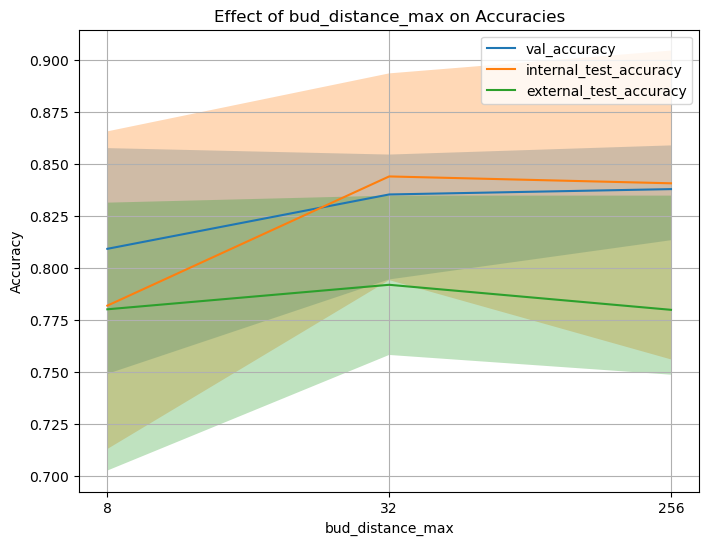

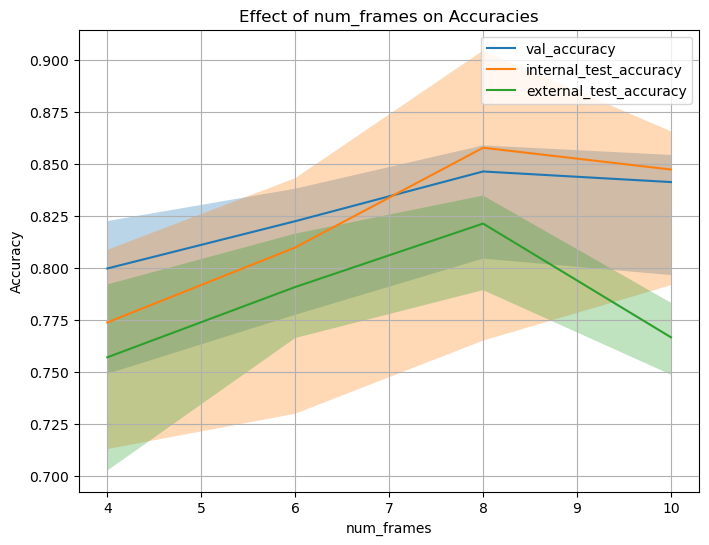

In [67]:
import matplotlib.pyplot as plt

# Line plot with bud_distance_max on the x-axis
plt.figure(figsize=(8, 6))
# result_result_df_norm = result_df.loc[result_df['normalized'] == True]
result_df['bud_distance_max'] = result_df['bud_distance_max'].astype(str)

for accuracy in ['val_accuracy', 'internal_test_accuracy', 'external_test_accuracy']:
    grouped_data = result_df.groupby('bud_distance_max')[accuracy].agg(['min', 'max'])
    plt.plot(result_df['bud_distance_max'].unique(), result_df.groupby('bud_distance_max')[accuracy].mean(), label=accuracy)
    plt.fill_between(result_df['bud_distance_max'].unique(), grouped_data['min'], grouped_data['max'], alpha=0.3)


plt.xlabel('bud_distance_max')
plt.ylabel('Accuracy')
plt.title('Effect of bud_distance_max on Accuracies')
plt.legend()
plt.grid(True)
plt.show()

# Line plot with num_frames on the x-axis
plt.figure(figsize=(8, 6))

for accuracy in ['val_accuracy', 'internal_test_accuracy', 'external_test_accuracy']:
    grouped_data = result_df.groupby('num_frames')[accuracy].agg(['min', 'max'])
    plt.plot(result_df['num_frames'].unique(), result_df.groupby('num_frames')[accuracy].mean(), label=accuracy)
    plt.fill_between(result_df['num_frames'].unique(), grouped_data['min'], grouped_data['max'], alpha=0.3)


plt.xlabel('num_frames')
plt.ylabel('Accuracy')
plt.title('Effect of num_frames on Accuracies')
plt.legend()
plt.grid(True)
plt.show()

In [86]:
result_df.loc[(result_df['bud_distance_max'].isin(['8','32'])) & (result_df['num_frames'].isin([6,8,10])) ]


,bud_distance_max,num_frames,normalized,val_accuracy,val_accuracy_std,internal_test_accuracy,internal_test_accuracy_std,external_test_accuracy,external_test_accuracy_std
20,8,6,True,0.823582,0.036096,0.824540,0.009182,0.788475,0.005073
21,8,6,False,0.829724,0.034829,0.842945,0.010697,0.766780,0.017071
22,8,8,True,0.858708,0.024899,0.904294,0.003006,0.827797,0.004497
23,8,8,False,0.857146,0.027757,0.898160,0.006256,0.834576,0.009196
24,8,10,True,0.849231,0.029433,0.865031,0.006721,0.762034,0.006573
25,8,10,False,0.847692,0.027262,0.856442,0.012633,0.748475,0.019812
30,32,6,True,0.836364,0.023764,0.838788,0.006181,0.810847,0.009196
31,32,6,False,0.837879,0.020101,0.842424,0.010842,0.795254,0.016129
32,32,8,True,0.854303,0.017074,0.893333,0.009847,0.834576,0.004497
33,32,8,False,0.845200,0.010584,0.869091,0.030327,0.809492,0.022321


In [1]:
result_df

NameError: name 'result_df' is not defined

In [89]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
df = result_df.loc[(result_df['bud_distance_max'].isin(['8','32'])) & (result_df['num_frames'].isin([6,8,10])) ]

fig = make_subplots(
    rows=1,
    cols=3,
    print_grid=True,
    subplot_titles=['val_accuracy', 'internal_test_accuracy', 'external_test_accuracy']
)

for i, acc in enumerate(['val_accuracy', 'internal_test_accuracy', 'external_test_accuracy']):
    for state in [True, False]:
        fig.add_trace(go.Violin(x=df['normalized'][df['normalized'] == state],
                        y=df[acc][df['normalized'] == state],
                        name=state,
                        box_visible=True,
                        meanline_visible=True),row=1, col=i+1)
            
fig.update_layout(barmode='overlay')
fig.update_layout(title_text="Effect of normalization on accuracies for bud_distance_max in [8,32] and num_frames in [6,8,10]")
fig.show()

This is the format of your plot grid:
[ (1,1) x,y   ]  [ (1,2) x2,y2 ]  [ (1,3) x3,y3 ]



test for different selected keys


In [ ]:
selected_keys = ['dist_max','dist_std','poly_fit_budcm_budpt','poly_fit_expansion_vector','position_bud_std','position_bud_first','position_bud_max','position_bud_last_minus_first','position_bud_last','orientation_bud_std','orientation_bud_last','orientation_bud_last_minus_first','plyfit_orientation_bud']
args = {'fov': 0, 'bud_distance_max': max_bud_dist, 'num_frames_refractory': 0, 'num_frames': frame_number, 'output_file': 'lineage.csv', 'normalized' : normalized}
res = do_pipeline(args, config, lin_gt_all)
res

## do pipeline for chosen parameters


In [26]:
selected_keys = ['dist_0','dist_std','poly_fit_budcm_budpt','poly_fit_expansion_vector','position_bud_std','position_bud_max','position_bud_min','position_bud_last','position_bud_first','orientation_bud_std','orientation_bud_max','orientation_bud_min','orientation_bud_last','orientation_bud_first','orientation_bud_last_minus_first','plyfit_orientation_bud']

args_norm = {'fov': 0, 'bud_distance_max': 12, 'num_frames_refractory': 0, 'num_frames': 8, 'selected_keys': selected_keys, 'normalized' : True}
res_norm = do_pipeline(args_norm, lin_gt_all)

args_original = {'fov': 0, 'bud_distance_max': 12, 'num_frames_refractory': 0, 'num_frames': 8, 'selected_keys': selected_keys, 'normalized' : False}
res_original = do_pipeline(args_original, lin_gt_all)
print('for bud_distance_max = ', args_original['bud_distance_max'], 'and num_frames = ', args_original['num_frames'], 'normalized = ', args_original['normalized'],':')
print(res_original)
print('for bud_distance_max = ', args_norm['bud_distance_max'], 'and num_frames = ', args_norm['num_frames'], 'normalized = ', args_norm['normalized'],':')
print(res_norm)

Processing colony 0
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 2 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #44 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 44 at time 74 with candidate 33: No candidate parents have been found for in frame #74.
Error for bud 185 at time 122 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 4 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))


Processing colony 1
No model was provided, using the default model
Processing colony 2
No model was provided, using the default model
Processing colony 3
No model was provided, using the default model
Error for bud 73 at time 163 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #77 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 77 at time 167 with candidate 13: No candidate parents have been found for in frame #167.
Processing colony 4
No model was provided, using the default model
Error for bud 40 at time 123 with candidate 15: Unable to find cell_id=40 at time_id=124 in the segmentation.
Error for bud 50 at time 136 with candidate 34: Unable to find cell_id=34 at time_id=141 in the segmentation.
Error for bud 55 at time 137 with candidate 34: Unable to find cell_id=34 at time_id=141 in the segmentation.
Error for bud 82 at time 154 with candidate 32: Unable to find cell_id=82 at time_id=161 in the segmentation.
Error for bud 87 at time 157 with candidate 60: Unable to find cell_id=60 at time_id=161 in the segmentation.
Error for bud 105 at time 169 with candidate 67: Unable to find cell_id=67 at time_id=170 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #114 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 114 at time 173 with candidate 97: No candidate parents have been found for in frame #173.
Processing colony 5
No model was provided, using the default model


/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 139 0 [  3  54  68 102 134] [1 0 4 3 2] 54
more than 4 candidates 146 0 [ 14  19  49 131 142] [2 0 1 4 3] 14
more than 4 candidates 152 0 [  9  23  48  91 111] [1 4 0 2 3] 23
more than 4 candidates 163 0 [  3  54  68 102 134] [4 3 0 1 2] 54
more than 4 candidates 168 0 [  1  33  77 154 159] [1 2 4 3 0] 1
parent not in candidates 168 0 [ 33  77 159 154] 1
more than 4 candidates 222 0 [  9  19  77 159 168] [2 3 1 4 0] 77
more than 4 candidates 261 0 [ 94 105 164 191 237] [2 0 1 4 3] 94
more than 4 candidates 262 0 [ 48  80 137 183 244] [2 1 4 3 0] 137
more than 4 candidates 280 0 [ 11  27 105 212 238] [2 3 1 4 0] 11
parent not in candidates 280 0 [105 212  27 238] 11
more than 4 candidates 303 0 [ 88  94 136 141 248] [4 3 0 1 2] 88
more than 4 candidates 310 0 [ 10  40 172 239 298] [4 3 0 2 1] 10
more than 4 candidates 343 0 [159 182 270 290 305] [1 0 2 3 4] 182


/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 52 1 [ 3  7 13 25 29] [3 4 0 2 1] 25
more than 4 candidates 69 3 [12 19 21 42 67] [4 0 1 2 3] 12
more than 4 candidates 87 3 [18 37 39 59 71] [1 2 0 4 3] 37
more than 4 candidates 92 3 [22 31 49 50 75] [3 4 0 1 2] 22
parent not in candidates 68 4 [ 4  8 64 -3] 39
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 12, 'num_frames': 8, 'normalized': True, 'cv_number': 1}


Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: f-labbaf97. Use `wandb login --relogin` to force relogin


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 12, 'num_frames': 8, 'normalized': True, 'cv_number': 2}


best_accuracy,▁▆███████████
epoch,▁▂▂▃▃▄▅▅▆▆▇▇█
eval_accuracy,▁▆█▇█████████
lr,█▆▃▁▁▁▁▁▁▁▁▁▁
patience,▁▁▁▂▂▃▄▅▅▆▇▇█
train_accuracy,▁▆███████████
best_accuracy,0.88636
epoch,12
eval_accuracy,0.88636
lr,0.0001
patience,10


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 12, 'num_frames': 8, 'normalized': True, 'cv_number': 3}


best_accuracy,▁▅███████████
epoch,▁▂▂▃▃▄▅▅▆▆▇▇█
eval_accuracy,▁▅██▇████████
lr,█▆▃▁▁▁▁▁▁▁▁▁▁
patience,▁▁▁▂▂▃▄▅▅▆▇▇█
train_accuracy,▁▇███████████
best_accuracy,0.80303
epoch,12
eval_accuracy,0.80303
lr,0.0001
patience,10


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 12, 'num_frames': 8, 'normalized': True, 'cv_number': 4}


best_accuracy,▁▇███████████
epoch,▁▂▂▃▃▄▅▅▆▆▇▇█
eval_accuracy,▁▇███████████
lr,█▆▃▁▁▁▁▁▁▁▁▁▁
patience,▁▁▁▂▂▃▄▅▅▆▇▇█
train_accuracy,▁▇▇██████████
best_accuracy,0.81061
epoch,12
eval_accuracy,0.81061
lr,0.0001
patience,10


early stopping at  14 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 12, 'num_frames': 8, 'normalized': True, 'cv_number': 5}


best_accuracy,▁▅▇███████████
epoch,▁▂▂▃▃▄▄▅▅▆▆▇▇█
eval_accuracy,▁▅▇███████████
lr,█▆▃▁▁▁▁▁▁▁▁▁▁▁
patience,▁▁▁▁▂▂▃▄▅▅▆▇▇█
train_accuracy,▁▆▇███████████
best_accuracy,0.9084
epoch,13
eval_accuracy,0.9084
lr,0.0001
patience,10


early stopping at  15 LR:  9.99999999999999e-05
accuracy:  0.8480916030534351 +/- 0.041938401671172604
test accuracy 0.8727272727272727
test accuracy 0.8666666666666667
test accuracy 0.8848484848484849
test accuracy 0.8727272727272727
test accuracy 0.8787878787878788
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #269 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 269 at time 116 with candidate 178: No candidate parents have been found for in frame #116.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #287 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #291 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 287 at time 117 with candidate 240: No candidate parents have been found for in frame #117.
Error for bud 291 at time 117 with candidate 174: No candidate parents have been found for in frame #117.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #300 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 300 at time 118 with candidate 276: No candidate parents have been found for in frame #118.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #307 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #309 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #310 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  war

Error for bud 307 at time 118 with candidate 269: No candidate parents have been found for in frame #118.
Error for bud 309 at time 118 with candidate 166: No candidate parents have been found for in frame #118.
Error for bud 310 at time 118 with candidate 166: No candidate parents have been found for in frame #118.
more than 4 candidates 44 10 [20 21 28 32 33 37] [5 2 3 0 4 1] 20
more than 4 candidates 47 10 [ 1  7 11 25 27] [1 3 4 2 0] 7
more than 4 candidates 58 10 [ 6 34 36 48 53] [0 1 2 3 4] 6
more than 4 candidates 68 10 [17 20 32 44 57] [4 1 2 0 3] 17
more than 4 candidates 69 10 [ 1  2  4 33 51] [2 3 4 0 1] 33
more than 4 candidates 73 10 [ 4 33 37 50 69] [0 1 2 4 3] 4
more than 4 candidates 74 10 [ 2  9 14 43 55] [0 3 4 2 1] 2
more than 4 candidates 76 10 [ 1  7 25 47 71] [1 2 3 4 0] 47
more than 4 candidates 80 10 [ 5 19 26 34 53] [1 2 3 0 4] 19
more than 4 candidates 85 10 [11 15 56 71 72] [0 2 3 4 1] 11
more than 4 candidates 92 10 [10 40 42 61 67] [1 4 0 3 2] 40
more than 

/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 114 10 [16 24 64 70 77] [0 2 1 4 3] 16
more than 4 candidates 115 10 [ 6 34 53 58 86] [0 2 1 3 4] 34
more than 4 candidates 118 10 [ 16  24  39  70 114] [1 4 3 0 2] 24
more than 4 candidates 123 10 [  6  53  58  86 115] [3 4 0 1 2] 53
more than 4 candidates 127 10 [ 11  18  54  87 119] [0 2 3 4 1] 54
more than 4 candidates 135 10 [25 47 76 82 90] [0 1 3 2 4] 47
more than 4 candidates 138 10 [ 17  20  57  68 131] [1 2 3 4 0] 57
more than 4 candidates 141 10 [  2  43  55  74 103] [2 3 0 4 1] 2
more than 4 candidates 146 10 [  6   8  14  86 123] [1 3 0 4 2] 8
more than 4 candidates 148 10 [ 11  30  72  85 143] [0 1 4 2 3] 11
more than 4 candidates 149 10 [ 21  44  57  88 131] [1 3 4 0 2] 44
more than 4 candidates 150 10 [56 71 76 85 90] [0 1 4 2 3] 56
more than 4 candidates 151 10 [ 6 48 58 83 91] [0 3 4 2 1] 6
more than 4 candidates 154 10 [27 38 41 47 95] [0 2 4 3 1] 41
more than 4 candidates 159 10 [  3   7  35  87 142] [0 1 2 3 4] 3
more than 4 candidates 164 10

/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 2 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #44 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 44 at time 74 with candidate 33: No candidate parents have been found for in frame #74.
Error for bud 185 at time 122 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 4 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))


Processing colony 1
No model was provided, using the default model
Processing colony 2
No model was provided, using the default model
Processing colony 3
No model was provided, using the default model
Error for bud 73 at time 163 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #77 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 77 at time 167 with candidate 13: No candidate parents have been found for in frame #167.
Processing colony 4
No model was provided, using the default model
Error for bud 40 at time 123 with candidate 15: Unable to find cell_id=40 at time_id=124 in the segmentation.
Error for bud 50 at time 136 with candidate 34: Unable to find cell_id=34 at time_id=141 in the segmentation.
Error for bud 55 at time 137 with candidate 34: Unable to find cell_id=34 at time_id=141 in the segmentation.
Error for bud 82 at time 154 with candidate 32: Unable to find cell_id=82 at time_id=161 in the segmentation.
Error for bud 87 at time 157 with candidate 60: Unable to find cell_id=60 at time_id=161 in the segmentation.
Error for bud 105 at time 169 with candidate 67: Unable to find cell_id=67 at time_id=170 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #114 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 114 at time 173 with candidate 97: No candidate parents have been found for in frame #173.
Processing colony 5
No model was provided, using the default model


/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 139 0 [  3  54  68 102 134] [1 0 4 3 2] 54
more than 4 candidates 146 0 [ 14  19  49 131 142] [2 0 1 4 3] 14
more than 4 candidates 152 0 [  9  23  48  91 111] [1 4 0 2 3] 23
more than 4 candidates 163 0 [  3  54  68 102 134] [4 3 0 1 2] 54
more than 4 candidates 168 0 [  1  33  77 154 159] [1 2 4 3 0] 1
parent not in candidates 168 0 [ 33  77 159 154] 1
more than 4 candidates 222 0 [  9  19  77 159 168] [2 3 1 4 0] 77
more than 4 candidates 261 0 [ 94 105 164 191 237] [2 0 1 4 3] 94
more than 4 candidates 262 0 [ 48  80 137 183 244] [2 1 4 3 0] 137
more than 4 candidates 280 0 [ 11  27 105 212 238] [2 3 1 4 0] 11
parent not in candidates 280 0 [105 212  27 238] 11
more than 4 candidates 303 0 [ 88  94 136 141 248] [4 3 0 1 2] 88
more than 4 candidates 310 0 [ 10  40 172 239 298] [4 3 0 2 1] 10
more than 4 candidates 343 0 [159 182 270 290 305] [1 0 2 3 4] 182


/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 52 1 [ 3  7 13 25 29] [3 4 0 2 1] 25
more than 4 candidates 69 3 [12 19 21 42 67] [4 0 1 2 3] 12
more than 4 candidates 87 3 [18 37 39 59 71] [1 2 0 4 3] 37
more than 4 candidates 92 3 [22 31 49 50 75] [3 4 0 1 2] 22
parent not in candidates 68 4 [ 4  8 64 -3] 39
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 12, 'num_frames': 8, 'normalized': False, 'cv_number': 1}


best_accuracy,▁▅▇▇███████████
epoch,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
eval_accuracy,▁▅▇▆███▇▇███▇▇█
lr,█▆▃▁▁▁▁▁▁▁▁▁▁▁▁
patience,▁▁▁▂▁▂▂▃▄▅▅▆▇▇█
train_accuracy,▁▆▇████████████
best_accuracy,0.83206
epoch,14
eval_accuracy,0.83206
lr,0.0001
patience,10


early stopping at  32 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 12, 'num_frames': 8, 'normalized': False, 'cv_number': 2}


best_accuracy,▁▆▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇███████████
epoch,▁▁▁▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇███
eval_accuracy,▁▆▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇█▇███▇▇████
lr,█▆▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
patience,▁▁▂▂▃▄▅▅▆▇▁▂▂▃▄▅▅▆▇▇█▁▂▂▃▄▅▅▆▇▇█
train_accuracy,▁▆▇█████████████████████████████
best_accuracy,0.89394
epoch,31
eval_accuracy,0.89394
lr,0.0001
patience,10


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 12, 'num_frames': 8, 'normalized': False, 'cv_number': 3}


best_accuracy,▁▆███████████
epoch,▁▂▂▃▃▄▅▅▆▆▇▇█
eval_accuracy,▁▆███████████
lr,█▆▃▁▁▁▁▁▁▁▁▁▁
patience,▁▁▁▂▂▃▄▅▅▆▇▇█
train_accuracy,▁▆▇██████████
best_accuracy,0.79545
epoch,12
eval_accuracy,0.79545
lr,0.0001
patience,10


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 12, 'num_frames': 8, 'normalized': False, 'cv_number': 4}


best_accuracy,▁▄███████████
epoch,▁▂▂▃▃▄▅▅▆▆▇▇█
eval_accuracy,▁▄█▇▆▆▆▆▆▆▆▆▆
lr,█▆▃▁▁▁▁▁▁▁▁▁▁
patience,▁▁▁▂▂▃▄▅▅▆▇▇█
train_accuracy,▁▆▇██████████
best_accuracy,0.82576
epoch,12
eval_accuracy,0.79545
lr,0.0001
patience,10


early stopping at  24 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 12, 'num_frames': 8, 'normalized': False, 'cv_number': 5}


best_accuracy,▁▅▆▆▇▇▇▇▇▇▇▇▇███████████
epoch,▁▁▂▂▂▃▃▃▃▄▄▄▅▅▅▆▆▆▆▇▇▇██
eval_accuracy,▁▅▆▆▇▇▇▇▇▇▇▇▇█▇▇███▇████
lr,█▆▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
patience,▁▁▁▂▁▂▂▃▄▅▅▁▂▁▂▂▃▄▅▅▆▇▇█
train_accuracy,▁▆▇█████████████████████
best_accuracy,0.9084
epoch,23
eval_accuracy,0.9084
lr,0.0001
patience,10


early stopping at  12 LR:  9.99999999999999e-05
accuracy:  0.8511219060837382 +/- 0.04294016148638376
test accuracy 0.8606060606060606
test accuracy 0.8666666666666667
test accuracy 0.8484848484848485
test accuracy 0.8727272727272727
test accuracy 0.8424242424242424
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #269 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 269 at time 116 with candidate 178: No candidate parents have been found for in frame #116.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #287 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #291 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 287 at time 117 with candidate 240: No candidate parents have been found for in frame #117.
Error for bud 291 at time 117 with candidate 174: No candidate parents have been found for in frame #117.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #300 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #307 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 300 at time 118 with candidate 276: No candidate parents have been found for in frame #118.
Error for bud 307 at time 118 with candidate 269: No candidate parents have been found for in frame #118.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #309 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #310 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 ca

Error for bud 309 at time 118 with candidate 166: No candidate parents have been found for in frame #118.
Error for bud 310 at time 118 with candidate 166: No candidate parents have been found for in frame #118.
more than 4 candidates 44 10 [20 21 28 32 33 37] [5 2 3 0 4 1] 20
more than 4 candidates 47 10 [ 1  7 11 25 27] [1 3 4 2 0] 7
more than 4 candidates 58 10 [ 6 34 36 48 53] [0 1 2 3 4] 6
more than 4 candidates 68 10 [17 20 32 44 57] [4 1 2 0 3] 17
more than 4 candidates 69 10 [ 1  2  4 33 51] [2 3 4 0 1] 33
more than 4 candidates 73 10 [ 4 33 37 50 69] [0 1 2 4 3] 4
more than 4 candidates 74 10 [ 2  9 14 43 55] [0 3 4 2 1] 2
more than 4 candidates 76 10 [ 1  7 25 47 71] [1 2 3 4 0] 47
more than 4 candidates 80 10 [ 5 19 26 34 53] [1 2 3 0 4] 19
more than 4 candidates 85 10 [11 15 56 71 72] [0 2 3 4 1] 11
more than 4 candidates 92 10 [10 40 42 61 67] [1 4 0 3 2] 40
more than 4 candidates 96 10 [ 3  6  8 31 83] [0 1 3 2 4] 31
more than 4 candidates 97 10 [13 29 35 48 54] [0 1 2 3 

/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is 

KeyError: 'max_bud_dist'

In [27]:
print('for bud_distance_max = ', args_original['bud_distance_max'], 'and num_frames = ', args_original['num_frames'], 'normalized = ', args_original['normalized'],':')
print(res_original)
print('for bud_distance_max = ', args_norm['bud_distance_max'], 'and num_frames = ', args_norm['num_frames'], 'normalized = ', args_norm['normalized'],':')
print(res_norm)

for bud_distance_max =  12 and num_frames =  8 normalized =  False :
{'val_accuracy': 0.8511219060837382, 'val_accuracy_std': 0.04294016148638376, 'internal_test_accuracy': 0.8581818181818182, 'internal_test_accuracy_std': 0.011240749691509937, 'external_test_accuracy': 0.8169491525423729, 'external_test_accuracy_std': 0.01114011981366439}
for bud_distance_max =  12 and num_frames =  8 normalized =  True :
{'val_accuracy': 0.8480916030534351, 'val_accuracy_std': 0.041938401671172604, 'internal_test_accuracy': 0.875151515151515, 'internal_test_accuracy_std': 0.0061806297134458085, 'external_test_accuracy': 0.8189830508474575, 'external_test_accuracy_std': 0.006980088231177597}


## test with 4 output instead of 5


In [28]:
config = {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True , 'features':'16','train_set': 'all', 'dist_threshold':args['bud_distance_max'], 'num_frames': args['num_frames'],'normalized': args['normalized']}
selected_keys = ['dist_0','dist_std','poly_fit_budcm_budpt','poly_fit_expansion_vector','position_bud_std','position_bud_max','position_bud_min','position_bud_last','position_bud_first','orientation_bud_std','orientation_bud_max','orientation_bud_min','orientation_bud_last','orientation_bud_first','orientation_bud_last_minus_first','plyfit_orientation_bud']

args_norm = {'fov': 0, 'bud_distance_max': 12, 'num_frames_refractory': 0, 'num_frames': 8, 'selected_keys': selected_keys, 'normalized' : True}
res_norm = do_pipeline(args_norm, lin_gt_all, config=config)

args_original = {'fov': 0, 'bud_distance_max': 12, 'num_frames_refractory': 0, 'num_frames': 8, 'selected_keys': selected_keys, 'normalized' : False}
res_original = do_pipeline(args_original, lin_gt_all, config=config)


Processing colony 0
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 2 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #44 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 44 at time 74 with candidate 33: No candidate parents have been found for in frame #74.
Error for bud 185 at time 122 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 4 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))


Processing colony 1
No model was provided, using the default model
Processing colony 2
No model was provided, using the default model
Processing colony 3
No model was provided, using the default model
Error for bud 73 at time 163 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #77 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 77 at time 167 with candidate 13: No candidate parents have been found for in frame #167.
Processing colony 4
No model was provided, using the default model
Error for bud 40 at time 123 with candidate 15: Unable to find cell_id=40 at time_id=124 in the segmentation.
Error for bud 50 at time 136 with candidate 34: Unable to find cell_id=34 at time_id=141 in the segmentation.
Error for bud 55 at time 137 with candidate 34: Unable to find cell_id=34 at time_id=141 in the segmentation.
Error for bud 82 at time 154 with candidate 32: Unable to find cell_id=82 at time_id=161 in the segmentation.
Error for bud 87 at time 157 with candidate 60: Unable to find cell_id=60 at time_id=161 in the segmentation.
Error for bud 105 at time 169 with candidate 67: Unable to find cell_id=67 at time_id=170 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #114 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 114 at time 173 with candidate 97: No candidate parents have been found for in frame #173.
Processing colony 5
No model was provided, using the default model


/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 139 0 [  3  54  68 102 134] [1 0 4 3 2] 54
more than 4 candidates 146 0 [ 14  19  49 131 142] [2 0 1 4 3] 14
more than 4 candidates 152 0 [  9  23  48  91 111] [1 4 0 2 3] 23
more than 4 candidates 163 0 [  3  54  68 102 134] [4 3 0 1 2] 54
more than 4 candidates 168 0 [  1  33  77 154 159] [1 2 4 3 0] 1
parent not in candidates 168 0 [ 33  77 159 154] 1
more than 4 candidates 222 0 [  9  19  77 159 168] [2 3 1 4 0] 77
more than 4 candidates 261 0 [ 94 105 164 191 237] [2 0 1 4 3] 94
more than 4 candidates 262 0 [ 48  80 137 183 244] [2 1 4 3 0] 137
more than 4 candidates 280 0 [ 11  27 105 212 238] [2 3 1 4 0] 11
parent not in candidates 280 0 [105 212  27 238] 11
more than 4 candidates 303 0 [ 88  94 136 141 248] [4 3 0 1 2] 88
more than 4 candidates 310 0 [ 10  40 172 239 298] [4 3 0 2 1] 10
more than 4 candidates 343 0 [159 182 270 290 305] [1 0 2 3 4] 182


/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 52 1 [ 3  7 13 25 29] [3 4 0 2 1] 25
more than 4 candidates 69 3 [12 19 21 42 67] [4 0 1 2 3] 12
more than 4 candidates 87 3 [18 37 39 59 71] [1 2 0 4 3] 37
more than 4 candidates 92 3 [22 31 49 50 75] [3 4 0 1 2] 22
parent not in candidates 68 4 [ 4  8 64 -3] 39
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 12, 'num_frames': 8, 'normalized': True, 'cv_number': 1}


best_accuracy,▁███████████
epoch,▁▂▂▃▄▄▅▅▆▇▇█
eval_accuracy,▁██▇█▇▇▇▇█▇▇
lr,█▆▃▁▁▁▁▁▁▁▁▁
patience,▁▁▂▂▃▄▅▅▆▇▇█
train_accuracy,▁▆▇█████████
best_accuracy,0.83206
epoch,11
eval_accuracy,0.82443
lr,0.0001
patience,10


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 12, 'num_frames': 8, 'normalized': True, 'cv_number': 2}


best_accuracy,▁▆███████████
epoch,▁▂▂▃▃▄▅▅▆▆▇▇█
eval_accuracy,▁▆█▇█████████
lr,█▆▃▁▁▁▁▁▁▁▁▁▁
patience,▁▁▁▂▂▃▄▅▅▆▇▇█
train_accuracy,▁▆███████████
best_accuracy,0.88636
epoch,12
eval_accuracy,0.88636
lr,0.0001
patience,10


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 12, 'num_frames': 8, 'normalized': True, 'cv_number': 3}


best_accuracy,▁▅███████████
epoch,▁▂▂▃▃▄▅▅▆▆▇▇█
eval_accuracy,▁▅██▇████████
lr,█▆▃▁▁▁▁▁▁▁▁▁▁
patience,▁▁▁▂▂▃▄▅▅▆▇▇█
train_accuracy,▁▇███████████
best_accuracy,0.80303
epoch,12
eval_accuracy,0.80303
lr,0.0001
patience,10


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 12, 'num_frames': 8, 'normalized': True, 'cv_number': 4}


best_accuracy,▁▇███████████
epoch,▁▂▂▃▃▄▅▅▆▆▇▇█
eval_accuracy,▁▇███████████
lr,█▆▃▁▁▁▁▁▁▁▁▁▁
patience,▁▁▁▂▂▃▄▅▅▆▇▇█
train_accuracy,▁▇▇██████████
best_accuracy,0.81061
epoch,12
eval_accuracy,0.81061
lr,0.0001
patience,10


early stopping at  14 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 12, 'num_frames': 8, 'normalized': True, 'cv_number': 5}


best_accuracy,▁▅▇███████████
epoch,▁▂▂▃▃▄▄▅▅▆▆▇▇█
eval_accuracy,▁▅▇███████████
lr,█▆▃▁▁▁▁▁▁▁▁▁▁▁
patience,▁▁▁▁▂▂▃▄▅▅▆▇▇█
train_accuracy,▁▆▇███████████
best_accuracy,0.9084
epoch,13
eval_accuracy,0.9084
lr,0.0001
patience,10


early stopping at  15 LR:  9.99999999999999e-05
accuracy:  0.8480916030534351 +/- 0.041938401671172604
test accuracy 0.8727272727272727
test accuracy 0.8666666666666667
test accuracy 0.8848484848484849
test accuracy 0.8727272727272727
test accuracy 0.8787878787878788
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #269 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 269 at time 116 with candidate 178: No candidate parents have been found for in frame #116.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #287 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #291 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 287 at time 117 with candidate 240: No candidate parents have been found for in frame #117.
Error for bud 291 at time 117 with candidate 174: No candidate parents have been found for in frame #117.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #300 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 300 at time 118 with candidate 276: No candidate parents have been found for in frame #118.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #307 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #309 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #310 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  war

Error for bud 307 at time 118 with candidate 269: No candidate parents have been found for in frame #118.
Error for bud 309 at time 118 with candidate 166: No candidate parents have been found for in frame #118.
Error for bud 310 at time 118 with candidate 166: No candidate parents have been found for in frame #118.
more than 4 candidates 44 10 [20 21 28 32 33 37] [5 2 3 0 4 1] 20
more than 4 candidates 47 10 [ 1  7 11 25 27] [1 3 4 2 0] 7
more than 4 candidates 58 10 [ 6 34 36 48 53] [0 1 2 3 4] 6
more than 4 candidates 68 10 [17 20 32 44 57] [4 1 2 0 3] 17
more than 4 candidates 69 10 [ 1  2  4 33 51] [2 3 4 0 1] 33
more than 4 candidates 73 10 [ 4 33 37 50 69] [0 1 2 4 3] 4
more than 4 candidates 74 10 [ 2  9 14 43 55] [0 3 4 2 1] 2
more than 4 candidates 76 10 [ 1  7 25 47 71] [1 2 3 4 0] 47
more than 4 candidates 80 10 [ 5 19 26 34 53] [1 2 3 0 4] 19
more than 4 candidates 85 10 [11 15 56 71 72] [0 2 3 4 1] 11
more than 4 candidates 92 10 [10 40 42 61 67] [1 4 0 3 2] 40
more than 

/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is 

No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 2 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #44 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 44 at time 74 with candidate 33: No candidate parents have been found for in frame #74.
Error for bud 185 at time 122 with candidate 155: Unable to find cell_id=155 at time_id=124 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/data/_data.py:596: MultipleContoursWarning: OpenCV returned multiple contours, 4 found.
  warnings.warn(Contour.MultipleContoursWarning(len(contours_cv)))


Processing colony 1
No model was provided, using the default model
Processing colony 2
No model was provided, using the default model
Processing colony 3
No model was provided, using the default model
Error for bud 73 at time 163 with candidate 53: Unable to find cell_id=53 at time_id=167 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #77 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 77 at time 167 with candidate 13: No candidate parents have been found for in frame #167.
Processing colony 4
No model was provided, using the default model
Error for bud 40 at time 123 with candidate 15: Unable to find cell_id=40 at time_id=124 in the segmentation.
Error for bud 50 at time 136 with candidate 34: Unable to find cell_id=34 at time_id=141 in the segmentation.
Error for bud 55 at time 137 with candidate 34: Unable to find cell_id=34 at time_id=141 in the segmentation.
Error for bud 82 at time 154 with candidate 32: Unable to find cell_id=82 at time_id=161 in the segmentation.
Error for bud 87 at time 157 with candidate 60: Unable to find cell_id=60 at time_id=161 in the segmentation.
Error for bud 105 at time 169 with candidate 67: Unable to find cell_id=67 at time_id=170 in the segmentation.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #114 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 114 at time 173 with candidate 97: No candidate parents have been found for in frame #173.
Processing colony 5
No model was provided, using the default model


/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 139 0 [  3  54  68 102 134] [1 0 4 3 2] 54
more than 4 candidates 146 0 [ 14  19  49 131 142] [2 0 1 4 3] 14
more than 4 candidates 152 0 [  9  23  48  91 111] [1 4 0 2 3] 23
more than 4 candidates 163 0 [  3  54  68 102 134] [4 3 0 1 2] 54
more than 4 candidates 168 0 [  1  33  77 154 159] [1 2 4 3 0] 1
parent not in candidates 168 0 [ 33  77 159 154] 1
more than 4 candidates 222 0 [  9  19  77 159 168] [2 3 1 4 0] 77
more than 4 candidates 261 0 [ 94 105 164 191 237] [2 0 1 4 3] 94
more than 4 candidates 262 0 [ 48  80 137 183 244] [2 1 4 3 0] 137
more than 4 candidates 280 0 [ 11  27 105 212 238] [2 3 1 4 0] 11
parent not in candidates 280 0 [105 212  27 238] 11
more than 4 candidates 303 0 [ 88  94 136 141 248] [4 3 0 1 2] 88
more than 4 candidates 310 0 [ 10  40 172 239 298] [4 3 0 2 1] 10
more than 4 candidates 343 0 [159 182 270 290 305] [1 0 2 3 4] 182


/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is 

more than 4 candidates 52 1 [ 3  7 13 25 29] [3 4 0 2 1] 25
more than 4 candidates 69 3 [12 19 21 42 67] [4 0 1 2 3] 12
more than 4 candidates 87 3 [18 37 39 59 71] [1 2 0 4 3] 37
more than 4 candidates 92 3 [22 31 49 50 75] [3 4 0 1 2] 22
parent not in candidates 68 4 [ 4  8 64 -3] 39
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 12, 'num_frames': 8, 'normalized': True, 'cv_number': 1}


best_accuracy,▁▅▇▇███████████
epoch,▁▁▂▃▃▃▄▅▅▅▆▇▇▇█
eval_accuracy,▁▅▇▆███▇▇███▇▇█
lr,█▆▃▁▁▁▁▁▁▁▁▁▁▁▁
patience,▁▁▁▂▁▂▂▃▄▅▅▆▇▇█
train_accuracy,▁▆▇████████████
best_accuracy,0.83206
epoch,14
eval_accuracy,0.83206
lr,0.0001
patience,10


early stopping at  32 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 12, 'num_frames': 8, 'normalized': True, 'cv_number': 2}


best_accuracy,▁▆▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇███████████
epoch,▁▁▁▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇███
eval_accuracy,▁▆▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇█▇███▇▇████
lr,█▆▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
patience,▁▁▂▂▃▄▅▅▆▇▁▂▂▃▄▅▅▆▇▇█▁▂▂▃▄▅▅▆▇▇█
train_accuracy,▁▆▇█████████████████████████████
best_accuracy,0.89394
epoch,31
eval_accuracy,0.89394
lr,0.0001
patience,10


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 12, 'num_frames': 8, 'normalized': True, 'cv_number': 3}


best_accuracy,▁▆███████████
epoch,▁▂▂▃▃▄▅▅▆▆▇▇█
eval_accuracy,▁▆███████████
lr,█▆▃▁▁▁▁▁▁▁▁▁▁
patience,▁▁▁▂▂▃▄▅▅▆▇▇█
train_accuracy,▁▆▇██████████
best_accuracy,0.79545
epoch,12
eval_accuracy,0.79545
lr,0.0001
patience,10


early stopping at  13 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 12, 'num_frames': 8, 'normalized': True, 'cv_number': 4}


best_accuracy,▁▄███████████
epoch,▁▂▂▃▃▄▅▅▆▆▇▇█
eval_accuracy,▁▄█▇▆▆▆▆▆▆▆▆▆
lr,█▆▃▁▁▁▁▁▁▁▁▁▁
patience,▁▁▁▂▂▃▄▅▅▆▇▇█
train_accuracy,▁▆▇██████████
best_accuracy,0.82576
epoch,12
eval_accuracy,0.79545
lr,0.0001
patience,10


early stopping at  24 LR:  9.99999999999999e-05
config:  {'epoch_n': 200, 'patience': 10, 'lr': 0.01, 'batch_size': 256, 'layers': [64, 64, 5], 'augment': True, 'features': '16', 'train_set': 'all', 'dist_threshold': 12, 'num_frames': 8, 'normalized': True, 'cv_number': 5}


best_accuracy,▁▅▆▆▇▇▇▇▇▇▇▇▇███████████
epoch,▁▁▂▂▂▃▃▃▃▄▄▄▅▅▅▆▆▆▆▇▇▇██
eval_accuracy,▁▅▆▆▇▇▇▇▇▇▇▇▇█▇▇███▇████
lr,█▆▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
patience,▁▁▁▂▁▂▂▃▄▅▅▁▂▁▂▂▃▄▅▅▆▇▇█
train_accuracy,▁▆▇█████████████████████
best_accuracy,0.9084
epoch,23
eval_accuracy,0.9084
lr,0.0001
patience,10


early stopping at  12 LR:  9.99999999999999e-05
accuracy:  0.8511219060837382 +/- 0.04294016148638376
test accuracy 0.8606060606060606
test accuracy 0.8666666666666667
test accuracy 0.8484848484848485
test accuracy 0.8727272727272727
test accuracy 0.8424242424242424
No model was provided, using the default model


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #269 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 269 at time 116 with candidate 178: No candidate parents have been found for in frame #116.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #287 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #291 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 287 at time 117 with candidate 240: No candidate parents have been found for in frame #117.
Error for bud 291 at time 117 with candidate 174: No candidate parents have been found for in frame #117.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #300 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #307 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))


Error for bud 300 at time 118 with candidate 276: No candidate parents have been found for in frame #118.
Error for bud 307 at time 118 with candidate 269: No candidate parents have been found for in frame #118.


/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #309 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/home/farzaneh/Documents/Bread/bread/src/bread/algo/lineage/_lineage.py:219: BreadWarning: cell #310 does not have nearest neighbours with a distance less than 12, and flexible_threshold is False.
  warnings.warn(BreadWarning(f'cell #{nearest_neighbours_of} does not have nearest neighbours with a distance less than {self.dist_threshold}, and flexible_threshold is {self.flexible_nn_threshold}.'))
/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 ca

Error for bud 309 at time 118 with candidate 166: No candidate parents have been found for in frame #118.
Error for bud 310 at time 118 with candidate 166: No candidate parents have been found for in frame #118.
more than 4 candidates 44 10 [20 21 28 32 33 37] [5 2 3 0 4 1] 20
more than 4 candidates 47 10 [ 1  7 11 25 27] [1 3 4 2 0] 7
more than 4 candidates 58 10 [ 6 34 36 48 53] [0 1 2 3 4] 6
more than 4 candidates 68 10 [17 20 32 44 57] [4 1 2 0 3] 17
more than 4 candidates 69 10 [ 1  2  4 33 51] [2 3 4 0 1] 33
more than 4 candidates 73 10 [ 4 33 37 50 69] [0 1 2 4 3] 4
more than 4 candidates 74 10 [ 2  9 14 43 55] [0 3 4 2 1] 2
more than 4 candidates 76 10 [ 1  7 25 47 71] [1 2 3 4 0] 47
more than 4 candidates 80 10 [ 5 19 26 34 53] [1 2 3 0 4] 19
more than 4 candidates 85 10 [11 15 56 71 72] [0 2 3 4 1] 11
more than 4 candidates 92 10 [10 40 42 61 67] [1 4 0 3 2] 40
more than 4 candidates 96 10 [ 3  6  8 31 83] [0 1 3 2 4] 31
more than 4 candidates 97 10 [13 29 35 48 54] [0 1 2 3 

/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  print('more than 4 candidates', bud, colony, candidates, sorted_indices, int(lineage.loc[(lineage['bud_id'] == bud) & (
/tmp/ipykernel_632332/4187796967.py:34: FutureWarning: Calling int on a single element Series is 

In [30]:
print('for bud_distance_max = ', args_original['bud_distance_max'], 'and num_frames = ', args_original['num_frames'], 'normalized = ', args_original['normalized'],':')
print(res_original)
print('for bud_distance_max = ', args_norm['bud_distance_max'], 'and num_frames = ', args_norm['num_frames'], 'normalized = ', args_norm['normalized'],':')
print(res_norm)

for bud_distance_max =  12 and num_frames =  8 normalized =  False :
{'val_accuracy': 0.8511219060837382, 'val_accuracy_std': 0.04294016148638376, 'internal_test_accuracy': 0.8581818181818182, 'internal_test_accuracy_std': 0.011240749691509937, 'external_test_accuracy': 0.8169491525423729, 'external_test_accuracy_std': 0.01114011981366439}
for bud_distance_max =  12 and num_frames =  8 normalized =  True :
{'val_accuracy': 0.8480916030534351, 'val_accuracy_std': 0.041938401671172604, 'internal_test_accuracy': 0.875151515151515, 'internal_test_accuracy_std': 0.0061806297134458085, 'external_test_accuracy': 0.8189830508474575, 'external_test_accuracy_std': 0.006980088231177597}


wandb: Network error (ConnectionError), entering retry loop.
